In [1]:
from __future__ import print_function, division
import tarfile
import numpy as np
from matplotlib import pyplot as plt
from io import BytesIO
import cv2
from PIL import Image

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D, Conv2DTranspose
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [0]:
class pic(): # Define a Class to do some pre operations of images 
  def __init__(self, filename):
    self.filename = filename;
    self.width = 120 # image width
    self.height = 48 # image height
    self.name_list, self.file_list = self.untar(self.filename)
    self.data_set = self.getdataset(self.file_list)
  
  def untar(self, filename): # uncompress the tar.gz file
    name_list = []
    file_list = []
    with tarfile.open(filename, "r") as file:
        for i in file.getmembers(): # use tar file module to untar the file
            f = file.extractfile(i)
            if f is not None:
              content = f.read()
              name_list.append(i.name)
              file_list.append(content)
    
    return name_list, file_list # return the file name list and file list

  def getdataset(self, file_list): # get data_set with np.array format
    data_set = []
    for i in range(len(file_list)):
      try:
        im = Image.open(BytesIO(file_list[i]))  # file_list is the binary stream, that needs to transfer to image format
      except OSError:
        pass
      im = im.convert("L") # convert images to gray scale
      data = im.getdata()  # get image tuple
      data = np.matrix(data)  # turn the image tuple to matrix
      
      try:
        picture = np.reshape(data,(self.height, self.width))  # turn to numpy array
      except ValueError:
        pass
      left, right = self.splitpic(picture) # split the image to enlarge the data_set
      data_set.append(left)
      data_set.append(right)
    return np.array(data_set)

  def showim(self,picture): # show image
    plt.imshow(picture)
    plt.show()

  def splitpic(self,picture): # split the image
    return np.split(picture, 2, axis=1)[0], np.split(picture, 2, axis=1)[1]
  
  def gendataset(self): # return the data_set
    return self.data_set

In [0]:
class DCGAN():
    def __init__(self):
        self.img_height = 48
        self.img_width = 60
        self.channels = 1
        self.img_shape = (self.img_height, self.img_width, self.channels)
        self.latent_dim = 100

        # Define optimizer
        optimizer = Adam(0.0002, 0.5)

        # Build the generator
        self.generator = self._generator()
        
        # Build discrimnator
        self.discriminator = self._discriminator()
        self.discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

        # Noise as input
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # In order to train G, we need to fix D
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        real = self.discriminator(img)

        # combine the generator and discriminator
        # Trains the generator to fool the discriminator
        self.combined = Model(z, real)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    def _generator(self):

        moment = 0.5
        model = Sequential()

        model.add(Dense(1024 * 12 * 15, activation="relu", input_dim=self.latent_dim))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation("relu"))
        model.add(Reshape((12, 15, 1024)))
        
        model.add(Conv2DTranspose(512, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation("relu"))
        
        model.add(Conv2DTranspose(256, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(128, kernel_size=3, padding="same"))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(64, kernel_size=3, padding='same'))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(32, kernel_size=3, padding='same'))
        model.add(BatchNormalization(momentum=moment))
        model.add(Activation('relu'))
        
        model.add(Conv2DTranspose(self.channels, kernel_size=3, padding="same"))
        model.add(Activation("tanh"))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def _discriminator(self):

        dropout = 0.6
        
        model = Sequential()

        model.add(Conv2D(64, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        
        model.add(Conv2D(256, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        
        model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(dropout))
        
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))
        
        model.summary()
        img = Input(shape=self.img_shape)
        validity = model(img)
        return Model(img, validity)

    def train(self, epochs, data_set, batch_size=128, save_interval=50):
        
        data_set = data_set / 127.5 - 1. # Rescale -1 to 1
        data_set = np.expand_dims(data_set, axis=3)

        real = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        
        start = 0
        for epoch in range(epochs):

            # Train D
            #idx = np.random.randint(0, data_set.shape[0], batch_size)
            #imgs = data_set[idx]
            end = start + batch_size
            real_images = data_set[start:end]

            # Noise as input and get generated image 
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator (real classified as ones and generated as zeros)
            d_loss_real = self.discriminator.train_on_batch(real_images, real)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train G

            # Train the generator (wants discriminator to mistake images as real)
            g_loss = self.combined.train_on_batch(noise, real)

            print ("%d [D loss: %f] [G loss: %f]" % (epoch, d_loss[0], g_loss))
            
            start += batch_size
            if start > len(data_set) - batch_size:
              start = 0
              
            if epoch % save_interval == 0:
                self.show_imgs(epoch)

    def show_imgs(self, epoch):
        # Generate 3*3
        noise = np.random.normal(0, 1, (3 * 3, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(3, 3)
        current = 0
        for i in range(3):
            for j in range(3):
                axs[i,j].imshow(gen_imgs[current, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                current += 1
        plt.show()
        plt.close()
    
    def dataset(self, data_set):
      data_set = self.getdataset(file_list, 48, 120)
      return data_set
      

In [0]:
pic1 = pic('yzm1.tar.gz')
data_set1 = pic1.gendataset()

In [6]:
# pic1.showim(data_set[0])
print (data_set1.shape)

(10694, 48, 60)


In [0]:
pic2 = pic('yzm.tar.gz')

In [11]:
data_set2 = pic2.gendataset()
print (data_set2.shape)

(8162, 48, 60)


In [12]:
data_set = np.concatenate((data_set1, data_set2), axis = 0)
print(data_set.shape)

(18856, 48, 60)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_14 (Dense)             (None, 184320)            18616320  
_________________________________________________________________
batch_normalization_58 (Batc (None, 184320)            737280    
_________________________________________________________________
activation_45 (Activation)   (None, 184320)            0         
_________________________________________________________________
reshape_8 (Reshape)          (None, 12, 15, 1024)      0         
_________________________________________________________________
conv2d_transpose_35 (Conv2DT (None, 24, 30, 512)       4719104   
_________________________________________________________________
batch_normalization_59 (Batc (None, 24, 30, 512)       2048      
_________________________________________________________________
activation_46 (Activation)   (None, 24, 30, 512)       0         
__________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 1.376691] [G loss: 0.673645]


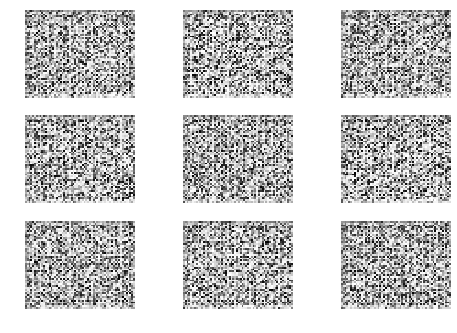

1 [D loss: 1.124394] [G loss: 1.051436]
2 [D loss: 0.988521] [G loss: 1.516366]
3 [D loss: 0.938037] [G loss: 1.367973]
4 [D loss: 0.903648] [G loss: 1.326669]
5 [D loss: 0.945156] [G loss: 1.426573]
6 [D loss: 0.918471] [G loss: 1.597934]
7 [D loss: 0.736937] [G loss: 1.354842]
8 [D loss: 0.718894] [G loss: 1.638285]
9 [D loss: 0.920643] [G loss: 1.318453]
10 [D loss: 0.622451] [G loss: 1.992541]
11 [D loss: 0.783754] [G loss: 1.419899]
12 [D loss: 0.766127] [G loss: 1.971359]
13 [D loss: 0.763683] [G loss: 1.937612]
14 [D loss: 0.910537] [G loss: 1.348114]
15 [D loss: 0.488856] [G loss: 1.483921]
16 [D loss: 0.584009] [G loss: 1.260169]
17 [D loss: 0.547592] [G loss: 1.362859]
18 [D loss: 0.815755] [G loss: 1.088859]
19 [D loss: 0.742076] [G loss: 1.800277]
20 [D loss: 0.688020] [G loss: 1.969525]
21 [D loss: 0.721932] [G loss: 1.921347]
22 [D loss: 0.950283] [G loss: 1.849479]
23 [D loss: 0.649672] [G loss: 1.487127]
24 [D loss: 0.890027] [G loss: 1.853874]
25 [D loss: 0.386166] [G 

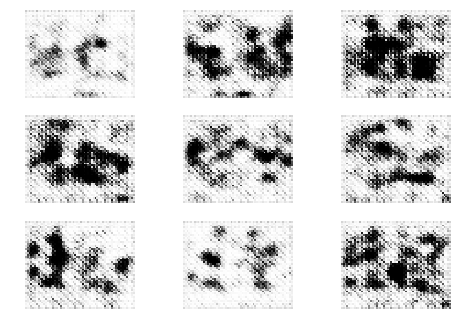

51 [D loss: 1.182267] [G loss: 1.360953]
52 [D loss: 1.132416] [G loss: 1.653590]
53 [D loss: 0.991947] [G loss: 1.580515]
54 [D loss: 1.486550] [G loss: 1.555948]
55 [D loss: 0.980162] [G loss: 1.394525]
56 [D loss: 1.230943] [G loss: 1.158318]
57 [D loss: 1.366071] [G loss: 1.961463]
58 [D loss: 0.955131] [G loss: 2.038326]
59 [D loss: 0.988973] [G loss: 1.737695]
60 [D loss: 1.330064] [G loss: 1.689668]
61 [D loss: 1.214502] [G loss: 1.371090]
62 [D loss: 1.219770] [G loss: 1.094646]
63 [D loss: 0.960210] [G loss: 1.504681]
64 [D loss: 0.808833] [G loss: 1.382702]
65 [D loss: 0.713929] [G loss: 1.413031]
66 [D loss: 1.067992] [G loss: 1.462294]
67 [D loss: 1.144913] [G loss: 1.261183]
68 [D loss: 1.070680] [G loss: 1.036166]
69 [D loss: 0.652723] [G loss: 1.291461]
70 [D loss: 0.978940] [G loss: 0.882267]
71 [D loss: 0.900414] [G loss: 1.515408]
72 [D loss: 1.302730] [G loss: 0.972315]
73 [D loss: 1.273742] [G loss: 1.642598]
74 [D loss: 0.715557] [G loss: 1.671784]
75 [D loss: 1.17

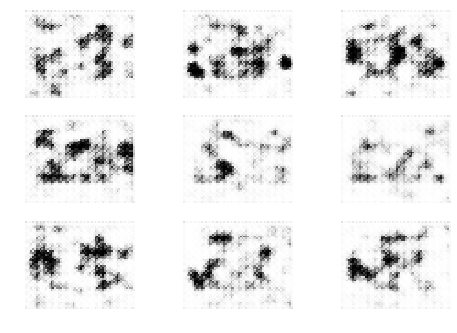

101 [D loss: 1.076066] [G loss: 1.175310]
102 [D loss: 0.822738] [G loss: 1.280843]
103 [D loss: 1.195613] [G loss: 1.324667]
104 [D loss: 1.201646] [G loss: 1.129953]
105 [D loss: 0.824708] [G loss: 1.811429]
106 [D loss: 1.306975] [G loss: 1.473510]
107 [D loss: 1.208089] [G loss: 1.651588]
108 [D loss: 0.888843] [G loss: 1.405509]
109 [D loss: 0.988127] [G loss: 1.125991]
110 [D loss: 1.130625] [G loss: 1.925798]
111 [D loss: 0.880862] [G loss: 1.656567]
112 [D loss: 0.871364] [G loss: 1.258624]
113 [D loss: 0.951858] [G loss: 1.173838]
114 [D loss: 1.173300] [G loss: 1.205469]
115 [D loss: 0.987263] [G loss: 1.642080]
116 [D loss: 0.891193] [G loss: 2.284097]
117 [D loss: 1.035625] [G loss: 1.720634]
118 [D loss: 1.184272] [G loss: 1.322812]
119 [D loss: 1.222267] [G loss: 1.295561]
120 [D loss: 1.122588] [G loss: 0.972490]
121 [D loss: 1.214040] [G loss: 1.463835]
122 [D loss: 1.064668] [G loss: 1.619318]
123 [D loss: 0.895453] [G loss: 1.734857]
124 [D loss: 1.140070] [G loss: 1.

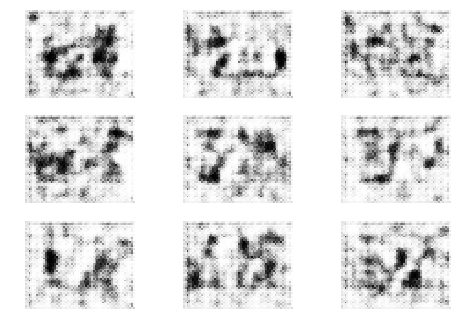

151 [D loss: 1.032858] [G loss: 0.870391]
152 [D loss: 1.018317] [G loss: 1.347601]
153 [D loss: 0.815649] [G loss: 1.490940]
154 [D loss: 1.092638] [G loss: 1.297207]
155 [D loss: 1.013664] [G loss: 1.410946]
156 [D loss: 0.961356] [G loss: 1.504592]
157 [D loss: 1.127606] [G loss: 1.293216]
158 [D loss: 1.033127] [G loss: 1.049280]
159 [D loss: 1.320516] [G loss: 1.354129]
160 [D loss: 0.997139] [G loss: 1.579027]
161 [D loss: 1.279519] [G loss: 1.315268]
162 [D loss: 1.316995] [G loss: 0.989563]
163 [D loss: 0.863359] [G loss: 1.285853]
164 [D loss: 1.034202] [G loss: 1.268261]
165 [D loss: 1.004360] [G loss: 1.333249]
166 [D loss: 1.315258] [G loss: 1.092867]
167 [D loss: 0.891353] [G loss: 1.575322]
168 [D loss: 0.860486] [G loss: 1.330135]
169 [D loss: 1.352059] [G loss: 0.922254]
170 [D loss: 1.135065] [G loss: 1.476446]
171 [D loss: 1.145184] [G loss: 1.208730]
172 [D loss: 0.612580] [G loss: 1.744751]
173 [D loss: 1.166566] [G loss: 1.495200]
174 [D loss: 1.156698] [G loss: 1.

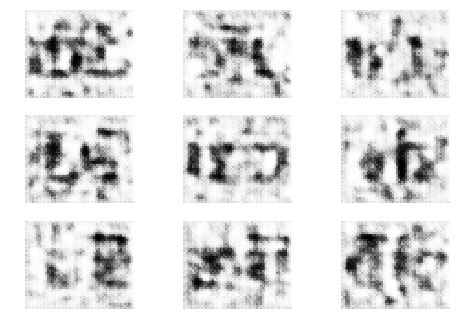

201 [D loss: 1.011901] [G loss: 1.356860]
202 [D loss: 1.080337] [G loss: 1.380758]
203 [D loss: 1.169947] [G loss: 1.329235]
204 [D loss: 1.432278] [G loss: 1.720483]
205 [D loss: 1.198089] [G loss: 1.839603]
206 [D loss: 1.123927] [G loss: 1.311948]
207 [D loss: 0.990427] [G loss: 1.183288]
208 [D loss: 1.298815] [G loss: 1.587351]
209 [D loss: 1.097702] [G loss: 1.621971]
210 [D loss: 0.938456] [G loss: 1.504945]
211 [D loss: 1.157215] [G loss: 1.447751]
212 [D loss: 1.192990] [G loss: 1.371273]
213 [D loss: 1.474348] [G loss: 0.874249]
214 [D loss: 0.982861] [G loss: 1.377434]
215 [D loss: 1.050613] [G loss: 1.466747]
216 [D loss: 1.005771] [G loss: 1.204790]
217 [D loss: 1.203073] [G loss: 1.180906]
218 [D loss: 0.928762] [G loss: 1.698063]
219 [D loss: 1.133043] [G loss: 1.655001]
220 [D loss: 1.137662] [G loss: 1.320003]
221 [D loss: 0.875248] [G loss: 1.549251]
222 [D loss: 0.767015] [G loss: 1.238387]
223 [D loss: 1.023490] [G loss: 1.352289]
224 [D loss: 1.289004] [G loss: 1.

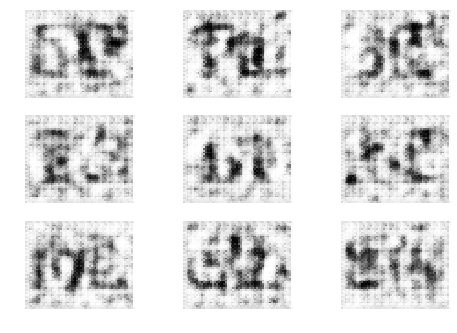

251 [D loss: 0.995136] [G loss: 1.640831]
252 [D loss: 1.200022] [G loss: 1.300321]
253 [D loss: 1.170792] [G loss: 1.106412]
254 [D loss: 1.074681] [G loss: 1.256567]
255 [D loss: 1.254426] [G loss: 1.468135]
256 [D loss: 1.209866] [G loss: 1.586773]
257 [D loss: 1.255820] [G loss: 1.568868]
258 [D loss: 1.340521] [G loss: 1.825862]
259 [D loss: 0.983482] [G loss: 1.476473]
260 [D loss: 0.966694] [G loss: 1.499649]
261 [D loss: 1.241991] [G loss: 1.570848]
262 [D loss: 1.046726] [G loss: 1.539655]
263 [D loss: 1.221780] [G loss: 1.387173]
264 [D loss: 1.202969] [G loss: 1.613436]
265 [D loss: 1.250390] [G loss: 1.800055]
266 [D loss: 1.415556] [G loss: 1.133381]
267 [D loss: 0.767188] [G loss: 1.792791]
268 [D loss: 0.997895] [G loss: 1.206220]
269 [D loss: 1.100161] [G loss: 1.071632]
270 [D loss: 1.157332] [G loss: 1.726586]
271 [D loss: 0.984133] [G loss: 1.367879]
272 [D loss: 0.934792] [G loss: 1.324926]
273 [D loss: 0.759756] [G loss: 1.473008]
274 [D loss: 1.058676] [G loss: 1.

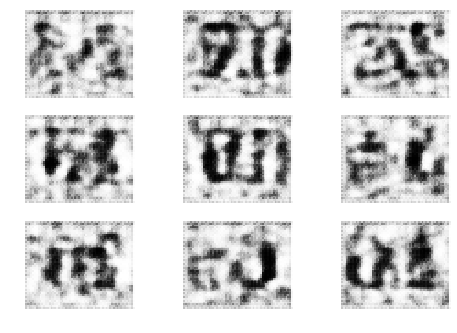

301 [D loss: 1.055978] [G loss: 1.297949]
302 [D loss: 0.938521] [G loss: 1.482260]
303 [D loss: 0.901235] [G loss: 1.191597]
304 [D loss: 1.099990] [G loss: 1.121327]
305 [D loss: 1.193045] [G loss: 1.645291]
306 [D loss: 1.078715] [G loss: 1.795387]
307 [D loss: 1.162633] [G loss: 1.413152]
308 [D loss: 0.904274] [G loss: 1.337669]
309 [D loss: 1.023696] [G loss: 0.915803]
310 [D loss: 1.140915] [G loss: 1.501749]
311 [D loss: 1.272157] [G loss: 1.467159]
312 [D loss: 1.182433] [G loss: 1.301565]
313 [D loss: 0.926953] [G loss: 1.859558]
314 [D loss: 0.865214] [G loss: 1.526263]
315 [D loss: 0.994708] [G loss: 1.276717]
316 [D loss: 0.904764] [G loss: 1.266554]
317 [D loss: 1.014291] [G loss: 1.267015]
318 [D loss: 1.216892] [G loss: 0.831020]
319 [D loss: 1.299186] [G loss: 1.144162]
320 [D loss: 1.046274] [G loss: 1.504744]
321 [D loss: 1.194944] [G loss: 1.145034]
322 [D loss: 1.099197] [G loss: 1.475013]
323 [D loss: 1.309514] [G loss: 1.007397]
324 [D loss: 0.989022] [G loss: 1.

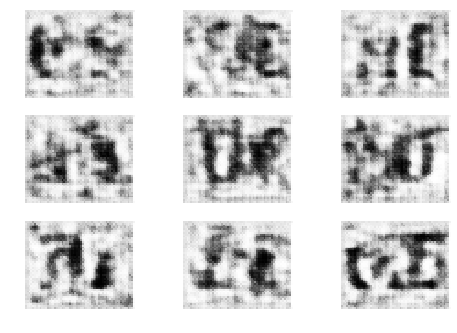

351 [D loss: 0.945368] [G loss: 1.193104]
352 [D loss: 0.926919] [G loss: 1.311251]
353 [D loss: 0.884381] [G loss: 1.549084]
354 [D loss: 0.902686] [G loss: 1.149041]
355 [D loss: 1.073100] [G loss: 1.435293]
356 [D loss: 1.060098] [G loss: 1.054156]
357 [D loss: 1.227836] [G loss: 0.857645]
358 [D loss: 0.841710] [G loss: 1.040853]
359 [D loss: 1.170913] [G loss: 1.505008]
360 [D loss: 0.934346] [G loss: 1.115255]
361 [D loss: 1.011749] [G loss: 1.523650]
362 [D loss: 1.193121] [G loss: 1.309502]
363 [D loss: 1.361461] [G loss: 1.264707]
364 [D loss: 1.144856] [G loss: 1.026504]
365 [D loss: 1.053422] [G loss: 1.794471]
366 [D loss: 1.397438] [G loss: 1.486473]
367 [D loss: 1.103590] [G loss: 1.655510]
368 [D loss: 0.826040] [G loss: 1.005663]
369 [D loss: 1.261660] [G loss: 1.238746]
370 [D loss: 1.057945] [G loss: 1.401389]
371 [D loss: 0.895256] [G loss: 1.386314]
372 [D loss: 1.068650] [G loss: 1.344609]
373 [D loss: 1.022136] [G loss: 1.798718]
374 [D loss: 1.022293] [G loss: 1.

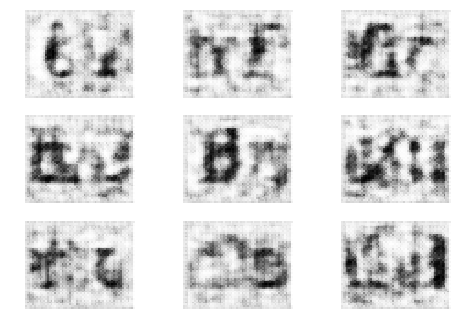

401 [D loss: 0.860682] [G loss: 1.165529]
402 [D loss: 0.929625] [G loss: 0.948675]
403 [D loss: 1.036907] [G loss: 1.075153]
404 [D loss: 1.107202] [G loss: 0.970405]
405 [D loss: 1.116101] [G loss: 0.883266]
406 [D loss: 1.270908] [G loss: 1.147260]
407 [D loss: 0.758808] [G loss: 1.328782]
408 [D loss: 1.191161] [G loss: 0.859060]
409 [D loss: 0.954148] [G loss: 1.278004]
410 [D loss: 1.107716] [G loss: 1.686557]
411 [D loss: 0.915101] [G loss: 1.432649]
412 [D loss: 1.051463] [G loss: 1.130076]
413 [D loss: 0.820309] [G loss: 1.052222]
414 [D loss: 1.068729] [G loss: 1.216232]
415 [D loss: 1.176239] [G loss: 1.645612]
416 [D loss: 1.063025] [G loss: 0.964981]
417 [D loss: 1.063518] [G loss: 1.394408]
418 [D loss: 1.164471] [G loss: 1.430143]
419 [D loss: 1.086711] [G loss: 1.352665]
420 [D loss: 0.882679] [G loss: 1.823349]
421 [D loss: 1.041096] [G loss: 1.349826]
422 [D loss: 1.001001] [G loss: 0.957387]
423 [D loss: 1.152727] [G loss: 1.042531]
424 [D loss: 1.066446] [G loss: 1.

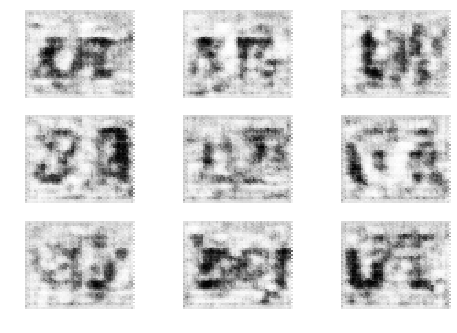

451 [D loss: 0.835993] [G loss: 1.111894]
452 [D loss: 1.023080] [G loss: 1.246470]
453 [D loss: 0.727892] [G loss: 1.411539]
454 [D loss: 0.876601] [G loss: 1.338354]
455 [D loss: 0.863472] [G loss: 1.277931]
456 [D loss: 0.794429] [G loss: 1.269582]
457 [D loss: 0.960681] [G loss: 1.072788]
458 [D loss: 1.043063] [G loss: 1.064671]
459 [D loss: 0.705237] [G loss: 1.334973]
460 [D loss: 1.031994] [G loss: 1.115642]
461 [D loss: 1.218460] [G loss: 1.485037]
462 [D loss: 1.036177] [G loss: 1.522493]
463 [D loss: 0.817513] [G loss: 2.049768]
464 [D loss: 1.176229] [G loss: 1.012933]
465 [D loss: 1.096014] [G loss: 1.321107]
466 [D loss: 1.054429] [G loss: 1.204826]
467 [D loss: 1.182533] [G loss: 0.829165]
468 [D loss: 0.823272] [G loss: 1.071864]
469 [D loss: 1.047734] [G loss: 1.398401]
470 [D loss: 0.741022] [G loss: 1.489949]
471 [D loss: 1.134474] [G loss: 1.228660]
472 [D loss: 0.915397] [G loss: 1.330849]
473 [D loss: 1.081576] [G loss: 1.377206]
474 [D loss: 1.044225] [G loss: 1.

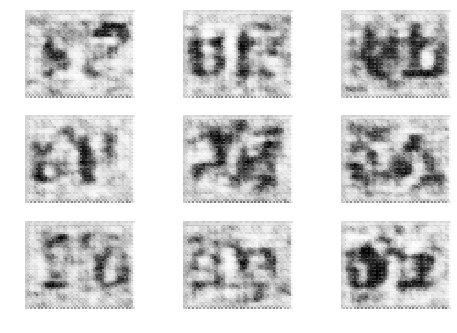

501 [D loss: 1.141867] [G loss: 0.936089]
502 [D loss: 1.046984] [G loss: 1.175524]
503 [D loss: 0.993500] [G loss: 1.268241]
504 [D loss: 0.882042] [G loss: 1.505107]
505 [D loss: 1.158753] [G loss: 1.514149]
506 [D loss: 0.631464] [G loss: 1.055056]
507 [D loss: 1.300017] [G loss: 1.174734]
508 [D loss: 0.904660] [G loss: 1.429957]
509 [D loss: 0.952819] [G loss: 1.046629]
510 [D loss: 0.878030] [G loss: 1.225148]
511 [D loss: 0.868530] [G loss: 1.299332]
512 [D loss: 0.895595] [G loss: 1.452268]
513 [D loss: 1.115102] [G loss: 1.436733]
514 [D loss: 0.945381] [G loss: 1.049032]
515 [D loss: 1.032027] [G loss: 0.866102]
516 [D loss: 0.997743] [G loss: 1.333146]
517 [D loss: 0.865617] [G loss: 1.109897]
518 [D loss: 1.217028] [G loss: 0.957405]
519 [D loss: 0.775997] [G loss: 1.330458]
520 [D loss: 1.089239] [G loss: 0.986359]
521 [D loss: 1.086794] [G loss: 0.962394]
522 [D loss: 0.812548] [G loss: 1.043945]
523 [D loss: 1.208819] [G loss: 0.880253]
524 [D loss: 1.001643] [G loss: 1.

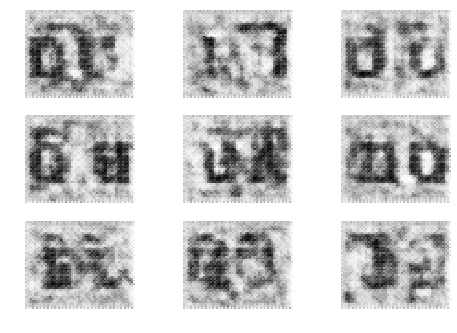

551 [D loss: 0.881950] [G loss: 1.269545]
552 [D loss: 1.158346] [G loss: 1.138770]
553 [D loss: 0.837861] [G loss: 1.323146]
554 [D loss: 0.912188] [G loss: 1.434511]
555 [D loss: 0.916562] [G loss: 1.421023]
556 [D loss: 0.916452] [G loss: 1.425689]
557 [D loss: 1.027267] [G loss: 1.212494]
558 [D loss: 0.834717] [G loss: 1.310271]
559 [D loss: 1.092403] [G loss: 0.999438]
560 [D loss: 0.947745] [G loss: 1.248627]
561 [D loss: 0.991430] [G loss: 0.963499]
562 [D loss: 0.742848] [G loss: 1.494491]
563 [D loss: 1.145406] [G loss: 1.373127]
564 [D loss: 1.053397] [G loss: 1.237493]
565 [D loss: 0.910564] [G loss: 1.422783]
566 [D loss: 1.134293] [G loss: 1.758654]
567 [D loss: 0.812507] [G loss: 1.301622]
568 [D loss: 1.017109] [G loss: 1.525121]
569 [D loss: 0.955219] [G loss: 1.358834]
570 [D loss: 1.034554] [G loss: 1.066435]
571 [D loss: 1.176609] [G loss: 1.283975]
572 [D loss: 1.134293] [G loss: 1.312761]
573 [D loss: 0.839840] [G loss: 1.344945]
574 [D loss: 1.067028] [G loss: 1.

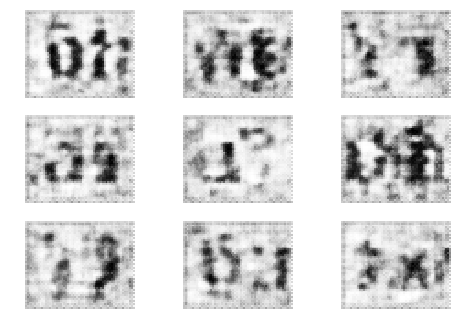

601 [D loss: 0.817501] [G loss: 1.419512]
602 [D loss: 1.001117] [G loss: 1.328034]
603 [D loss: 0.954049] [G loss: 1.220246]
604 [D loss: 0.960371] [G loss: 1.324694]
605 [D loss: 1.051829] [G loss: 1.167348]
606 [D loss: 1.142338] [G loss: 0.849313]
607 [D loss: 0.958133] [G loss: 1.058862]
608 [D loss: 0.937225] [G loss: 1.153193]
609 [D loss: 0.824300] [G loss: 1.177379]
610 [D loss: 1.011966] [G loss: 1.144071]
611 [D loss: 0.978368] [G loss: 1.167479]
612 [D loss: 0.946908] [G loss: 1.082215]
613 [D loss: 0.795229] [G loss: 1.102234]
614 [D loss: 0.742780] [G loss: 1.165707]
615 [D loss: 0.806806] [G loss: 1.251254]
616 [D loss: 0.923001] [G loss: 1.218273]
617 [D loss: 0.852385] [G loss: 1.051117]
618 [D loss: 0.811660] [G loss: 1.184006]
619 [D loss: 0.962884] [G loss: 1.559128]
620 [D loss: 1.017982] [G loss: 1.183910]
621 [D loss: 0.890465] [G loss: 1.415096]
622 [D loss: 0.962571] [G loss: 1.154161]
623 [D loss: 0.690175] [G loss: 1.402914]
624 [D loss: 0.925830] [G loss: 0.

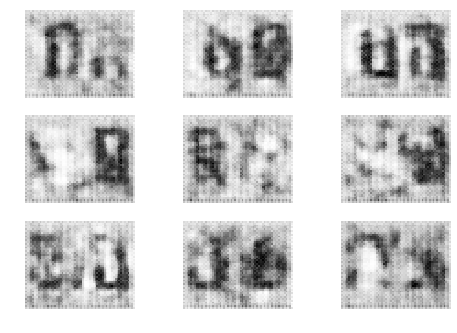

651 [D loss: 1.017491] [G loss: 1.167276]
652 [D loss: 1.010436] [G loss: 1.127496]
653 [D loss: 0.903716] [G loss: 0.984904]
654 [D loss: 0.910039] [G loss: 1.317799]
655 [D loss: 0.953436] [G loss: 1.297323]
656 [D loss: 1.030704] [G loss: 1.100417]
657 [D loss: 0.727772] [G loss: 1.365248]
658 [D loss: 0.914016] [G loss: 1.397722]
659 [D loss: 1.033784] [G loss: 1.222043]
660 [D loss: 0.810204] [G loss: 1.239671]
661 [D loss: 0.856160] [G loss: 1.383535]
662 [D loss: 0.924877] [G loss: 0.965270]
663 [D loss: 1.069871] [G loss: 0.935954]
664 [D loss: 0.666370] [G loss: 1.396649]
665 [D loss: 0.795928] [G loss: 1.064788]
666 [D loss: 0.966334] [G loss: 1.132292]
667 [D loss: 0.961814] [G loss: 1.386939]
668 [D loss: 0.764247] [G loss: 1.172028]
669 [D loss: 0.996811] [G loss: 0.987103]
670 [D loss: 0.940674] [G loss: 1.295731]
671 [D loss: 1.098464] [G loss: 1.138683]
672 [D loss: 0.907497] [G loss: 1.518234]
673 [D loss: 1.091109] [G loss: 1.131275]
674 [D loss: 0.905155] [G loss: 0.

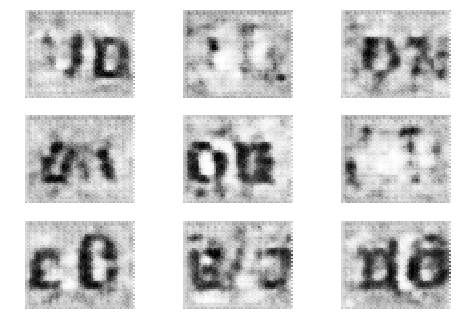

701 [D loss: 0.898050] [G loss: 1.227790]
702 [D loss: 0.749035] [G loss: 1.595544]
703 [D loss: 0.898064] [G loss: 1.076399]
704 [D loss: 0.885053] [G loss: 1.208319]
705 [D loss: 1.055793] [G loss: 1.147699]
706 [D loss: 1.066687] [G loss: 0.988654]
707 [D loss: 1.129272] [G loss: 1.060661]
708 [D loss: 0.918957] [G loss: 1.015130]
709 [D loss: 0.863498] [G loss: 1.231097]
710 [D loss: 1.002431] [G loss: 1.361989]
711 [D loss: 1.018560] [G loss: 1.227113]
712 [D loss: 0.828370] [G loss: 1.334329]
713 [D loss: 0.971547] [G loss: 1.207468]
714 [D loss: 0.837195] [G loss: 0.963261]
715 [D loss: 0.907052] [G loss: 1.442756]
716 [D loss: 0.832032] [G loss: 1.292705]
717 [D loss: 0.979354] [G loss: 1.319266]
718 [D loss: 0.744875] [G loss: 1.135114]
719 [D loss: 0.779153] [G loss: 1.349525]
720 [D loss: 1.180516] [G loss: 1.156238]
721 [D loss: 0.797094] [G loss: 1.206365]
722 [D loss: 0.854319] [G loss: 0.980586]
723 [D loss: 0.970513] [G loss: 1.156031]
724 [D loss: 0.691697] [G loss: 1.

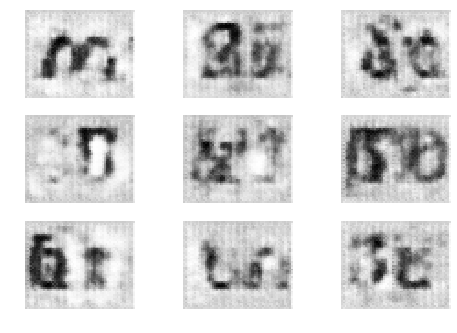

751 [D loss: 0.992426] [G loss: 1.102577]
752 [D loss: 1.043850] [G loss: 0.751426]
753 [D loss: 0.919106] [G loss: 0.865420]
754 [D loss: 0.921009] [G loss: 1.105494]
755 [D loss: 0.796308] [G loss: 1.244876]
756 [D loss: 1.058900] [G loss: 1.042753]
757 [D loss: 0.937232] [G loss: 1.205500]
758 [D loss: 0.840767] [G loss: 1.211848]
759 [D loss: 0.826930] [G loss: 1.205374]
760 [D loss: 0.977103] [G loss: 1.079990]
761 [D loss: 0.949803] [G loss: 0.982770]
762 [D loss: 0.890314] [G loss: 0.992747]
763 [D loss: 0.795089] [G loss: 1.423984]
764 [D loss: 1.113351] [G loss: 1.177196]
765 [D loss: 0.910656] [G loss: 1.194211]
766 [D loss: 0.840246] [G loss: 1.152102]
767 [D loss: 1.023974] [G loss: 1.201693]
768 [D loss: 1.063329] [G loss: 1.105177]
769 [D loss: 1.097544] [G loss: 1.154410]
770 [D loss: 1.040227] [G loss: 1.414148]
771 [D loss: 1.177193] [G loss: 1.518388]
772 [D loss: 1.160211] [G loss: 1.146770]
773 [D loss: 0.958465] [G loss: 1.064416]
774 [D loss: 0.963593] [G loss: 1.

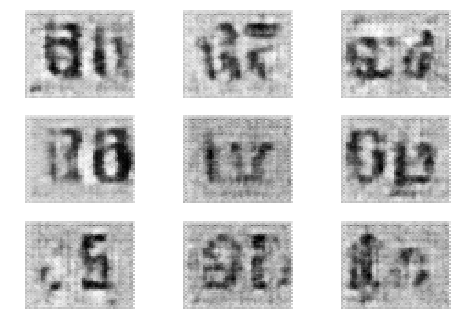

801 [D loss: 0.966974] [G loss: 0.868086]
802 [D loss: 0.825170] [G loss: 1.249910]
803 [D loss: 0.887013] [G loss: 1.087627]
804 [D loss: 0.773364] [G loss: 1.146739]
805 [D loss: 0.952114] [G loss: 0.897801]
806 [D loss: 0.862809] [G loss: 1.083907]
807 [D loss: 0.930407] [G loss: 1.114767]
808 [D loss: 0.779276] [G loss: 1.274472]
809 [D loss: 0.845042] [G loss: 0.958274]
810 [D loss: 0.850207] [G loss: 0.964138]
811 [D loss: 0.929869] [G loss: 1.166965]
812 [D loss: 0.806767] [G loss: 1.406087]
813 [D loss: 0.884789] [G loss: 1.312289]
814 [D loss: 1.129836] [G loss: 1.297455]
815 [D loss: 0.783185] [G loss: 1.224084]
816 [D loss: 0.921032] [G loss: 1.076074]
817 [D loss: 0.820211] [G loss: 1.055478]
818 [D loss: 1.025840] [G loss: 1.163301]
819 [D loss: 0.793108] [G loss: 1.067070]
820 [D loss: 0.831701] [G loss: 1.058098]
821 [D loss: 1.029843] [G loss: 1.331546]
822 [D loss: 0.895685] [G loss: 1.027257]
823 [D loss: 0.821833] [G loss: 1.104843]
824 [D loss: 0.856378] [G loss: 1.

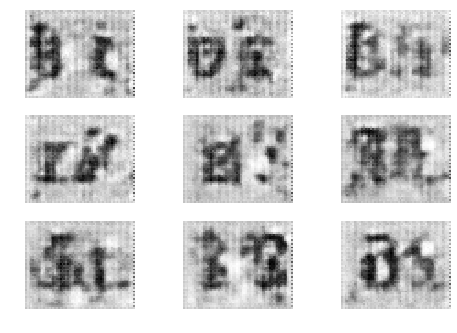

851 [D loss: 0.734891] [G loss: 1.039415]
852 [D loss: 0.911637] [G loss: 0.875872]
853 [D loss: 0.695820] [G loss: 1.086790]
854 [D loss: 0.854006] [G loss: 1.320474]
855 [D loss: 1.025465] [G loss: 1.034159]
856 [D loss: 0.820968] [G loss: 0.906014]
857 [D loss: 0.699156] [G loss: 1.541958]
858 [D loss: 0.951953] [G loss: 1.374750]
859 [D loss: 0.970567] [G loss: 1.146115]
860 [D loss: 0.893187] [G loss: 1.484512]
861 [D loss: 0.986210] [G loss: 0.929728]
862 [D loss: 1.095227] [G loss: 0.806979]
863 [D loss: 0.872988] [G loss: 0.963285]
864 [D loss: 1.049181] [G loss: 1.199247]
865 [D loss: 0.753668] [G loss: 1.422524]
866 [D loss: 0.910178] [G loss: 0.994660]
867 [D loss: 0.790826] [G loss: 1.376247]
868 [D loss: 0.815263] [G loss: 1.164567]
869 [D loss: 0.903957] [G loss: 1.183761]
870 [D loss: 0.957325] [G loss: 1.139899]
871 [D loss: 0.903741] [G loss: 1.283711]
872 [D loss: 0.776496] [G loss: 1.202077]
873 [D loss: 1.055860] [G loss: 0.963455]
874 [D loss: 0.719815] [G loss: 1.

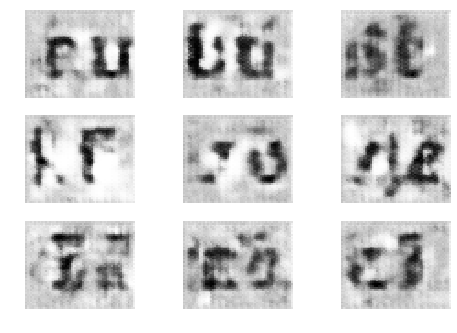

901 [D loss: 0.948108] [G loss: 0.997236]
902 [D loss: 0.786959] [G loss: 1.101542]
903 [D loss: 0.896629] [G loss: 1.154612]
904 [D loss: 1.082802] [G loss: 1.121652]
905 [D loss: 0.740677] [G loss: 1.325401]
906 [D loss: 1.083958] [G loss: 1.466339]
907 [D loss: 0.797798] [G loss: 1.179315]
908 [D loss: 0.812538] [G loss: 1.219148]
909 [D loss: 0.994105] [G loss: 1.358036]
910 [D loss: 0.981319] [G loss: 1.241822]
911 [D loss: 0.905290] [G loss: 0.860927]
912 [D loss: 0.790736] [G loss: 1.102113]
913 [D loss: 0.695620] [G loss: 0.987763]
914 [D loss: 0.874409] [G loss: 1.088084]
915 [D loss: 0.716293] [G loss: 1.038779]
916 [D loss: 0.986772] [G loss: 1.229243]
917 [D loss: 0.934098] [G loss: 1.072939]
918 [D loss: 0.970135] [G loss: 1.032169]
919 [D loss: 0.863809] [G loss: 1.187244]
920 [D loss: 0.913954] [G loss: 0.927172]
921 [D loss: 0.937561] [G loss: 1.041842]
922 [D loss: 0.803417] [G loss: 1.294496]
923 [D loss: 1.014060] [G loss: 0.967063]
924 [D loss: 0.942266] [G loss: 1.

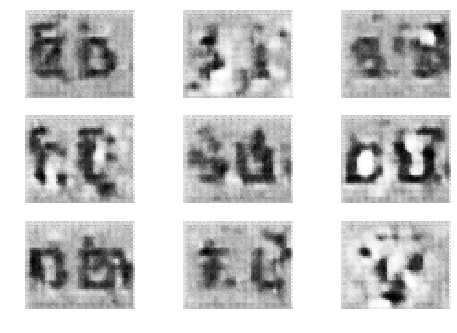

951 [D loss: 0.937088] [G loss: 1.101182]
952 [D loss: 0.801345] [G loss: 1.369760]
953 [D loss: 0.729288] [G loss: 1.127597]
954 [D loss: 0.944873] [G loss: 1.057571]
955 [D loss: 0.898671] [G loss: 1.117840]
956 [D loss: 0.852404] [G loss: 1.272653]
957 [D loss: 1.054358] [G loss: 1.161245]
958 [D loss: 0.721247] [G loss: 1.287875]
959 [D loss: 0.840248] [G loss: 1.361994]
960 [D loss: 0.875990] [G loss: 1.341569]
961 [D loss: 0.989167] [G loss: 1.013687]
962 [D loss: 0.803414] [G loss: 1.356239]
963 [D loss: 0.666817] [G loss: 0.943023]
964 [D loss: 0.959015] [G loss: 1.134380]
965 [D loss: 0.832398] [G loss: 1.280621]
966 [D loss: 0.822614] [G loss: 1.175210]
967 [D loss: 0.841789] [G loss: 1.121116]
968 [D loss: 1.112479] [G loss: 1.044760]
969 [D loss: 0.823434] [G loss: 1.110033]
970 [D loss: 0.934211] [G loss: 1.259124]
971 [D loss: 0.709190] [G loss: 1.152198]
972 [D loss: 0.983468] [G loss: 1.151975]
973 [D loss: 1.064742] [G loss: 0.980477]
974 [D loss: 0.818512] [G loss: 1.

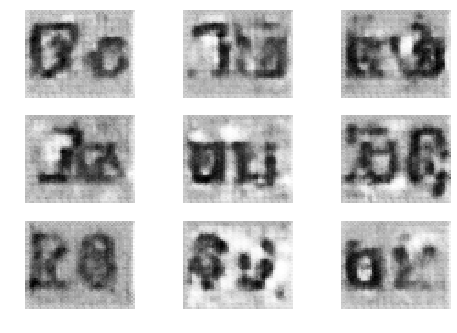

1001 [D loss: 0.939696] [G loss: 1.040075]
1002 [D loss: 0.842833] [G loss: 1.099841]
1003 [D loss: 0.934592] [G loss: 1.209119]
1004 [D loss: 0.945574] [G loss: 1.335746]
1005 [D loss: 1.028779] [G loss: 1.382161]
1006 [D loss: 1.005362] [G loss: 1.143701]
1007 [D loss: 0.904511] [G loss: 0.997383]
1008 [D loss: 0.993957] [G loss: 1.079036]
1009 [D loss: 0.820815] [G loss: 1.237198]
1010 [D loss: 0.814548] [G loss: 0.865977]
1011 [D loss: 0.767697] [G loss: 1.260749]
1012 [D loss: 1.059464] [G loss: 1.132564]
1013 [D loss: 0.665615] [G loss: 1.057169]
1014 [D loss: 0.949968] [G loss: 1.115575]
1015 [D loss: 0.799470] [G loss: 1.243639]
1016 [D loss: 0.840363] [G loss: 1.064493]
1017 [D loss: 0.759744] [G loss: 1.092484]
1018 [D loss: 0.939099] [G loss: 1.184772]
1019 [D loss: 0.899668] [G loss: 0.949821]
1020 [D loss: 0.907727] [G loss: 0.958409]
1021 [D loss: 0.960158] [G loss: 1.401214]
1022 [D loss: 0.961440] [G loss: 1.221258]
1023 [D loss: 0.898707] [G loss: 1.119962]
1024 [D los

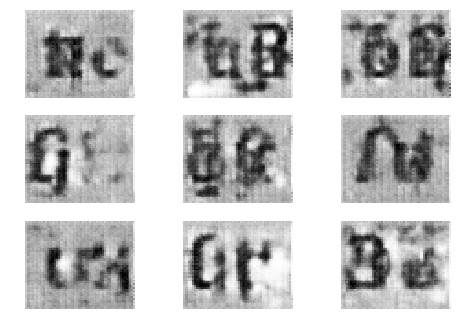

1051 [D loss: 1.128124] [G loss: 1.257252]
1052 [D loss: 1.045389] [G loss: 1.270745]
1053 [D loss: 0.903597] [G loss: 1.160980]
1054 [D loss: 0.935581] [G loss: 1.424157]
1055 [D loss: 0.863326] [G loss: 1.543391]
1056 [D loss: 0.908221] [G loss: 1.083003]
1057 [D loss: 0.959630] [G loss: 1.218206]
1058 [D loss: 0.915672] [G loss: 0.909629]
1059 [D loss: 0.786071] [G loss: 1.085991]
1060 [D loss: 0.769080] [G loss: 1.342898]
1061 [D loss: 0.896951] [G loss: 0.941841]
1062 [D loss: 0.855869] [G loss: 0.958362]
1063 [D loss: 0.989303] [G loss: 1.085328]
1064 [D loss: 0.800044] [G loss: 1.229593]
1065 [D loss: 0.835737] [G loss: 1.309462]
1066 [D loss: 0.669611] [G loss: 1.233419]
1067 [D loss: 0.825191] [G loss: 1.018160]
1068 [D loss: 0.910863] [G loss: 0.956017]
1069 [D loss: 0.807153] [G loss: 1.021353]
1070 [D loss: 0.879409] [G loss: 1.273220]
1071 [D loss: 0.882224] [G loss: 1.215027]
1072 [D loss: 0.883623] [G loss: 1.054326]
1073 [D loss: 0.753726] [G loss: 1.129858]
1074 [D los

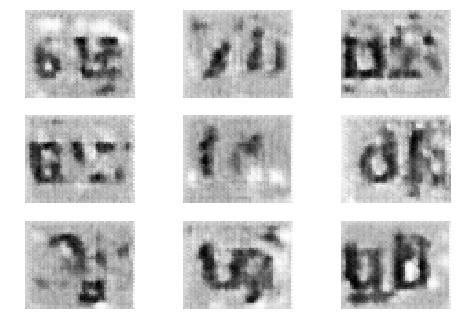

1101 [D loss: 0.837681] [G loss: 1.313958]
1102 [D loss: 0.825355] [G loss: 1.350383]
1103 [D loss: 0.705256] [G loss: 1.229272]
1104 [D loss: 0.917258] [G loss: 0.941735]
1105 [D loss: 0.878188] [G loss: 0.988485]
1106 [D loss: 0.826606] [G loss: 1.126439]
1107 [D loss: 0.711143] [G loss: 1.209655]
1108 [D loss: 0.967553] [G loss: 1.262045]
1109 [D loss: 0.817114] [G loss: 1.244761]
1110 [D loss: 0.830927] [G loss: 1.154043]
1111 [D loss: 0.847643] [G loss: 0.887729]
1112 [D loss: 0.909482] [G loss: 0.925554]
1113 [D loss: 0.749043] [G loss: 1.116017]
1114 [D loss: 0.895901] [G loss: 1.140191]
1115 [D loss: 0.794114] [G loss: 1.066814]
1116 [D loss: 1.001347] [G loss: 1.032380]
1117 [D loss: 0.747050] [G loss: 1.214654]
1118 [D loss: 0.953961] [G loss: 1.022370]
1119 [D loss: 1.025112] [G loss: 0.889331]
1120 [D loss: 0.878253] [G loss: 1.128271]
1121 [D loss: 0.893810] [G loss: 1.128952]
1122 [D loss: 0.628826] [G loss: 1.356283]
1123 [D loss: 0.901513] [G loss: 0.996499]
1124 [D los

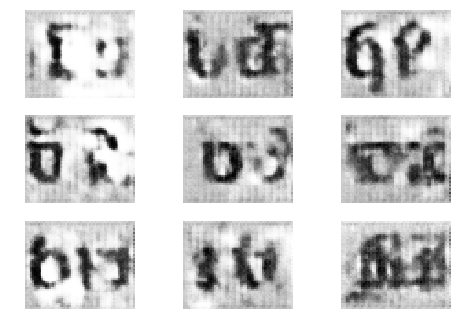

1151 [D loss: 0.766194] [G loss: 1.125219]
1152 [D loss: 0.955937] [G loss: 1.027199]
1153 [D loss: 0.874290] [G loss: 0.980001]
1154 [D loss: 0.661281] [G loss: 1.053864]
1155 [D loss: 0.781909] [G loss: 1.103306]
1156 [D loss: 0.849116] [G loss: 1.136586]
1157 [D loss: 0.838485] [G loss: 1.159700]
1158 [D loss: 1.010465] [G loss: 1.092664]
1159 [D loss: 0.796667] [G loss: 1.206531]
1160 [D loss: 1.001995] [G loss: 1.084415]
1161 [D loss: 0.845308] [G loss: 1.084528]
1162 [D loss: 1.013908] [G loss: 1.161457]
1163 [D loss: 0.866480] [G loss: 1.225134]
1164 [D loss: 0.857124] [G loss: 1.257891]
1165 [D loss: 0.821934] [G loss: 1.306085]
1166 [D loss: 0.728707] [G loss: 1.347135]
1167 [D loss: 1.043830] [G loss: 1.026226]
1168 [D loss: 0.992993] [G loss: 1.018939]
1169 [D loss: 0.856448] [G loss: 1.198527]
1170 [D loss: 0.766580] [G loss: 1.169006]
1171 [D loss: 0.924663] [G loss: 1.267285]
1172 [D loss: 0.733684] [G loss: 1.183923]
1173 [D loss: 0.704048] [G loss: 1.155451]
1174 [D los

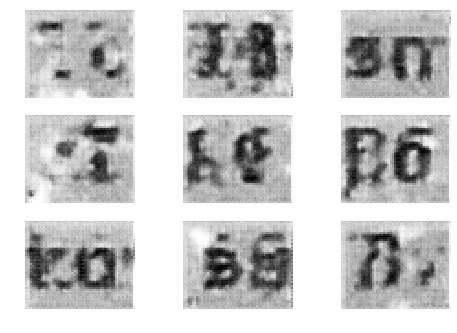

1201 [D loss: 0.829025] [G loss: 1.033753]
1202 [D loss: 0.660982] [G loss: 1.068177]
1203 [D loss: 0.747622] [G loss: 1.147391]
1204 [D loss: 0.713218] [G loss: 1.433865]
1205 [D loss: 1.021819] [G loss: 0.982660]
1206 [D loss: 0.801965] [G loss: 1.412509]
1207 [D loss: 0.823641] [G loss: 1.207598]
1208 [D loss: 0.766978] [G loss: 1.376952]
1209 [D loss: 0.676728] [G loss: 1.409562]
1210 [D loss: 0.724471] [G loss: 1.158293]
1211 [D loss: 0.721844] [G loss: 0.996162]
1212 [D loss: 0.891230] [G loss: 1.303480]
1213 [D loss: 0.926700] [G loss: 1.202947]
1214 [D loss: 0.515820] [G loss: 1.391764]
1215 [D loss: 0.964646] [G loss: 1.147238]
1216 [D loss: 0.680029] [G loss: 1.084911]
1217 [D loss: 0.864519] [G loss: 0.911101]
1218 [D loss: 0.581599] [G loss: 1.379573]
1219 [D loss: 0.779288] [G loss: 1.134632]
1220 [D loss: 0.765123] [G loss: 1.191535]
1221 [D loss: 0.919778] [G loss: 1.234150]
1222 [D loss: 0.607734] [G loss: 1.196937]
1223 [D loss: 0.568038] [G loss: 1.474874]
1224 [D los

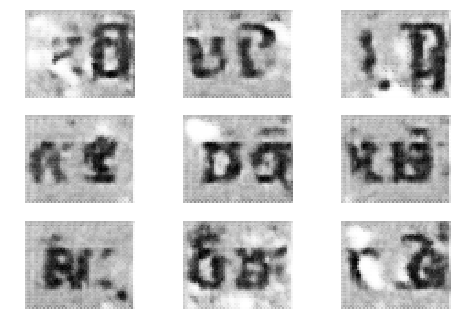

1251 [D loss: 0.901784] [G loss: 1.040095]
1252 [D loss: 0.915979] [G loss: 1.044618]
1253 [D loss: 0.680399] [G loss: 1.300534]
1254 [D loss: 0.710322] [G loss: 1.187168]
1255 [D loss: 1.084406] [G loss: 1.078443]
1256 [D loss: 0.705887] [G loss: 1.448239]
1257 [D loss: 0.855598] [G loss: 1.412719]
1258 [D loss: 0.791747] [G loss: 1.110999]
1259 [D loss: 0.897798] [G loss: 1.357025]
1260 [D loss: 0.891299] [G loss: 1.184588]
1261 [D loss: 0.666084] [G loss: 1.430645]
1262 [D loss: 0.941411] [G loss: 1.053465]
1263 [D loss: 0.764377] [G loss: 1.019255]
1264 [D loss: 0.621837] [G loss: 1.310181]
1265 [D loss: 0.804240] [G loss: 1.048165]
1266 [D loss: 0.735469] [G loss: 1.005197]
1267 [D loss: 0.692744] [G loss: 1.160036]
1268 [D loss: 0.712387] [G loss: 1.072884]
1269 [D loss: 0.754759] [G loss: 1.065720]
1270 [D loss: 0.895454] [G loss: 1.210160]
1271 [D loss: 0.989471] [G loss: 0.945259]
1272 [D loss: 0.938457] [G loss: 1.221368]
1273 [D loss: 0.868867] [G loss: 1.527820]
1274 [D los

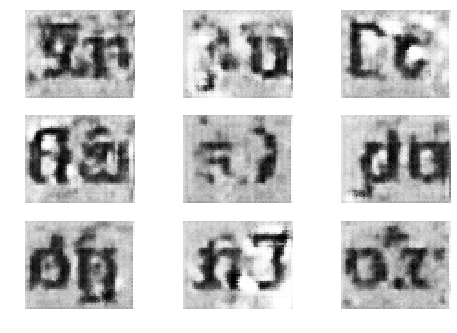

1301 [D loss: 0.900174] [G loss: 1.070249]
1302 [D loss: 0.700883] [G loss: 1.246051]
1303 [D loss: 0.643993] [G loss: 1.185724]
1304 [D loss: 0.624778] [G loss: 1.437867]
1305 [D loss: 0.621460] [G loss: 1.086816]
1306 [D loss: 0.718325] [G loss: 1.338696]
1307 [D loss: 0.896374] [G loss: 1.402516]
1308 [D loss: 0.826288] [G loss: 1.141842]
1309 [D loss: 0.673041] [G loss: 1.117662]
1310 [D loss: 0.576864] [G loss: 1.401361]
1311 [D loss: 0.882893] [G loss: 0.967315]
1312 [D loss: 0.774831] [G loss: 1.304101]
1313 [D loss: 0.578532] [G loss: 1.406492]
1314 [D loss: 0.648187] [G loss: 1.376773]
1315 [D loss: 1.040264] [G loss: 1.140919]
1316 [D loss: 0.919084] [G loss: 0.970183]
1317 [D loss: 0.940928] [G loss: 0.925582]
1318 [D loss: 0.975281] [G loss: 0.837533]
1319 [D loss: 0.518764] [G loss: 1.053166]
1320 [D loss: 0.926866] [G loss: 1.122488]
1321 [D loss: 0.656256] [G loss: 1.267023]
1322 [D loss: 0.552315] [G loss: 1.583085]
1323 [D loss: 0.791154] [G loss: 1.399378]
1324 [D los

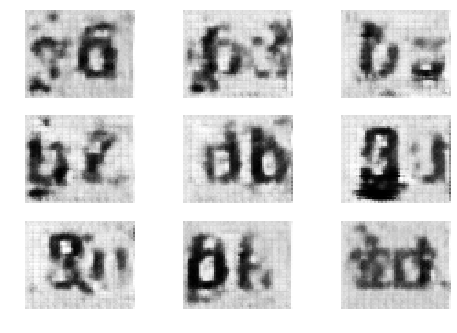

1351 [D loss: 0.638276] [G loss: 1.237039]
1352 [D loss: 0.958323] [G loss: 1.197241]
1353 [D loss: 0.861347] [G loss: 1.176617]
1354 [D loss: 1.108891] [G loss: 0.932020]
1355 [D loss: 0.752198] [G loss: 1.076859]
1356 [D loss: 0.726510] [G loss: 0.881865]
1357 [D loss: 0.697906] [G loss: 1.142536]
1358 [D loss: 0.716083] [G loss: 1.305738]
1359 [D loss: 0.691074] [G loss: 1.163067]
1360 [D loss: 0.999723] [G loss: 1.289834]
1361 [D loss: 0.880459] [G loss: 1.126098]
1362 [D loss: 0.922745] [G loss: 1.112154]
1363 [D loss: 0.804414] [G loss: 1.201599]
1364 [D loss: 0.757832] [G loss: 1.075883]
1365 [D loss: 0.784812] [G loss: 1.117626]
1366 [D loss: 0.950469] [G loss: 1.121567]
1367 [D loss: 0.777281] [G loss: 1.271822]
1368 [D loss: 0.916476] [G loss: 1.366541]
1369 [D loss: 0.812753] [G loss: 1.074007]
1370 [D loss: 0.667634] [G loss: 1.395229]
1371 [D loss: 0.952185] [G loss: 0.910373]
1372 [D loss: 0.975253] [G loss: 1.255779]
1373 [D loss: 0.864872] [G loss: 0.963244]
1374 [D los

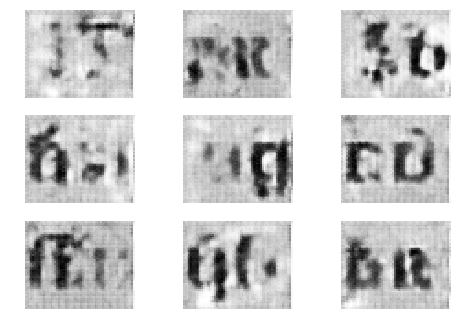

1401 [D loss: 0.786925] [G loss: 0.969221]
1402 [D loss: 0.675344] [G loss: 1.059093]
1403 [D loss: 0.729482] [G loss: 1.294830]
1404 [D loss: 0.652955] [G loss: 1.449488]
1405 [D loss: 0.911685] [G loss: 1.242981]
1406 [D loss: 0.692803] [G loss: 1.291486]
1407 [D loss: 0.616885] [G loss: 1.329815]
1408 [D loss: 0.736983] [G loss: 1.084311]
1409 [D loss: 0.601856] [G loss: 1.121630]
1410 [D loss: 0.933474] [G loss: 1.114411]
1411 [D loss: 0.789590] [G loss: 0.885331]
1412 [D loss: 0.774786] [G loss: 1.424748]
1413 [D loss: 0.985686] [G loss: 1.295554]
1414 [D loss: 0.867306] [G loss: 1.052833]
1415 [D loss: 0.863657] [G loss: 1.161289]
1416 [D loss: 0.643793] [G loss: 1.222720]
1417 [D loss: 0.673683] [G loss: 1.503932]
1418 [D loss: 0.877440] [G loss: 1.155373]
1419 [D loss: 0.770809] [G loss: 1.136919]
1420 [D loss: 0.656312] [G loss: 1.103423]
1421 [D loss: 0.753296] [G loss: 1.102112]
1422 [D loss: 0.545214] [G loss: 1.257849]
1423 [D loss: 0.864290] [G loss: 1.383744]
1424 [D los

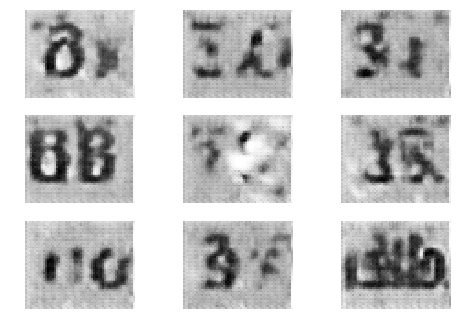

1451 [D loss: 0.787787] [G loss: 1.202600]
1452 [D loss: 0.806104] [G loss: 0.939479]
1453 [D loss: 0.701261] [G loss: 1.226724]
1454 [D loss: 0.648179] [G loss: 1.378597]
1455 [D loss: 0.560530] [G loss: 1.463596]
1456 [D loss: 0.704284] [G loss: 1.339526]
1457 [D loss: 0.855128] [G loss: 1.143418]
1458 [D loss: 0.869675] [G loss: 0.735801]
1459 [D loss: 0.855143] [G loss: 0.953966]
1460 [D loss: 0.911146] [G loss: 1.103176]
1461 [D loss: 0.750235] [G loss: 1.166051]
1462 [D loss: 1.013865] [G loss: 1.090036]
1463 [D loss: 0.748957] [G loss: 1.339948]
1464 [D loss: 0.602229] [G loss: 1.541787]
1465 [D loss: 0.874717] [G loss: 1.077169]
1466 [D loss: 0.573772] [G loss: 1.229879]
1467 [D loss: 0.950408] [G loss: 0.802157]
1468 [D loss: 0.785410] [G loss: 0.944348]
1469 [D loss: 0.600193] [G loss: 1.347170]
1470 [D loss: 0.927612] [G loss: 1.432348]
1471 [D loss: 1.079339] [G loss: 1.227601]
1472 [D loss: 0.652925] [G loss: 1.322996]
1473 [D loss: 0.896637] [G loss: 1.122962]
1474 [D los

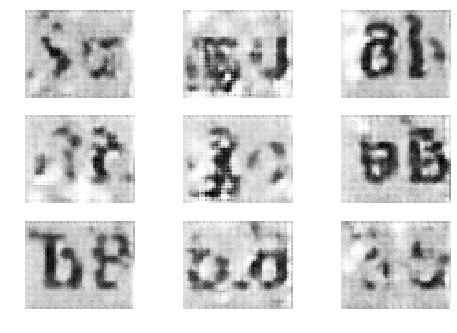

1501 [D loss: 0.691763] [G loss: 1.123381]
1502 [D loss: 0.692703] [G loss: 1.024163]
1503 [D loss: 0.991370] [G loss: 0.996798]
1504 [D loss: 0.600625] [G loss: 1.021934]
1505 [D loss: 0.909101] [G loss: 0.904580]
1506 [D loss: 0.829359] [G loss: 0.992520]
1507 [D loss: 0.951774] [G loss: 0.762394]
1508 [D loss: 0.739882] [G loss: 1.365270]
1509 [D loss: 0.623734] [G loss: 1.629810]
1510 [D loss: 0.892097] [G loss: 1.189258]
1511 [D loss: 0.655755] [G loss: 1.247139]
1512 [D loss: 0.893814] [G loss: 1.044529]
1513 [D loss: 0.699587] [G loss: 1.052128]
1514 [D loss: 0.580811] [G loss: 1.262944]
1515 [D loss: 0.706367] [G loss: 1.161946]
1516 [D loss: 0.745858] [G loss: 1.169006]
1517 [D loss: 0.698214] [G loss: 1.151678]
1518 [D loss: 0.785680] [G loss: 1.288044]
1519 [D loss: 0.679021] [G loss: 1.184551]
1520 [D loss: 0.796232] [G loss: 1.186678]
1521 [D loss: 0.574271] [G loss: 1.271019]
1522 [D loss: 0.589660] [G loss: 1.347496]
1523 [D loss: 1.018853] [G loss: 1.059827]
1524 [D los

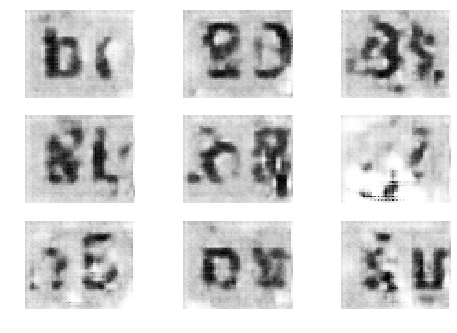

1551 [D loss: 0.873063] [G loss: 1.281518]
1552 [D loss: 1.010616] [G loss: 1.181327]
1553 [D loss: 0.945568] [G loss: 1.177156]
1554 [D loss: 0.813148] [G loss: 1.234805]
1555 [D loss: 0.957698] [G loss: 1.090241]
1556 [D loss: 0.794995] [G loss: 0.897105]
1557 [D loss: 0.806044] [G loss: 1.025748]
1558 [D loss: 0.819975] [G loss: 1.042266]
1559 [D loss: 0.761469] [G loss: 1.029720]
1560 [D loss: 0.485591] [G loss: 1.375273]
1561 [D loss: 0.739081] [G loss: 1.276165]
1562 [D loss: 0.699763] [G loss: 0.980320]
1563 [D loss: 0.753400] [G loss: 0.992787]
1564 [D loss: 0.879919] [G loss: 1.053860]
1565 [D loss: 0.776019] [G loss: 0.942469]
1566 [D loss: 0.844796] [G loss: 1.021883]
1567 [D loss: 0.780514] [G loss: 1.303359]
1568 [D loss: 0.815164] [G loss: 1.289034]
1569 [D loss: 0.836155] [G loss: 1.113182]
1570 [D loss: 0.672623] [G loss: 1.348823]
1571 [D loss: 0.875586] [G loss: 1.268250]
1572 [D loss: 0.811434] [G loss: 1.262452]
1573 [D loss: 0.615154] [G loss: 1.313919]
1574 [D los

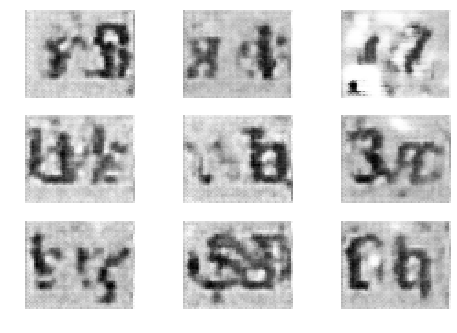

1601 [D loss: 0.810752] [G loss: 1.104485]
1602 [D loss: 0.740691] [G loss: 1.285246]
1603 [D loss: 0.621849] [G loss: 1.229627]
1604 [D loss: 0.746869] [G loss: 1.477439]
1605 [D loss: 0.545901] [G loss: 1.659949]
1606 [D loss: 0.964860] [G loss: 1.213215]
1607 [D loss: 0.835324] [G loss: 1.220172]
1608 [D loss: 0.902495] [G loss: 0.865635]
1609 [D loss: 0.828634] [G loss: 1.046357]
1610 [D loss: 0.676134] [G loss: 1.720650]
1611 [D loss: 0.891737] [G loss: 1.418164]
1612 [D loss: 0.893393] [G loss: 1.005775]
1613 [D loss: 0.823383] [G loss: 1.072456]
1614 [D loss: 0.910719] [G loss: 1.431633]
1615 [D loss: 0.800671] [G loss: 1.037504]
1616 [D loss: 0.973560] [G loss: 0.888198]
1617 [D loss: 0.693723] [G loss: 1.559634]
1618 [D loss: 0.855228] [G loss: 1.163529]
1619 [D loss: 0.703592] [G loss: 1.203318]
1620 [D loss: 0.836368] [G loss: 1.012603]
1621 [D loss: 0.683616] [G loss: 1.116851]
1622 [D loss: 0.907957] [G loss: 1.266852]
1623 [D loss: 0.793985] [G loss: 1.332096]
1624 [D los

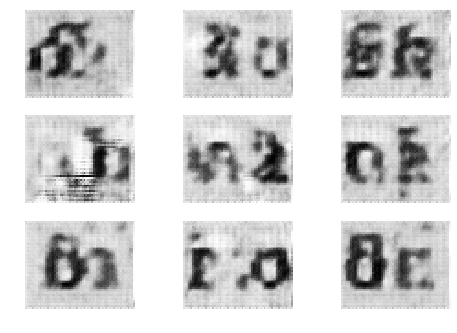

1651 [D loss: 0.887084] [G loss: 1.023571]
1652 [D loss: 0.699903] [G loss: 1.142802]
1653 [D loss: 0.723950] [G loss: 1.130442]
1654 [D loss: 0.807905] [G loss: 1.133893]
1655 [D loss: 0.861101] [G loss: 1.390683]
1656 [D loss: 0.750265] [G loss: 1.354719]
1657 [D loss: 0.966522] [G loss: 1.295537]
1658 [D loss: 0.735442] [G loss: 1.087361]
1659 [D loss: 0.924806] [G loss: 1.256107]
1660 [D loss: 0.903894] [G loss: 1.260120]
1661 [D loss: 0.790463] [G loss: 1.252391]
1662 [D loss: 0.853230] [G loss: 1.388934]
1663 [D loss: 0.596738] [G loss: 1.438787]
1664 [D loss: 0.800327] [G loss: 1.289611]
1665 [D loss: 0.843721] [G loss: 1.156897]
1666 [D loss: 0.884203] [G loss: 1.173288]
1667 [D loss: 0.907567] [G loss: 1.306660]
1668 [D loss: 0.887967] [G loss: 1.218227]
1669 [D loss: 0.774403] [G loss: 1.244668]
1670 [D loss: 0.778391] [G loss: 1.324394]
1671 [D loss: 0.834973] [G loss: 1.406709]
1672 [D loss: 0.705570] [G loss: 1.150110]
1673 [D loss: 0.790939] [G loss: 1.086932]
1674 [D los

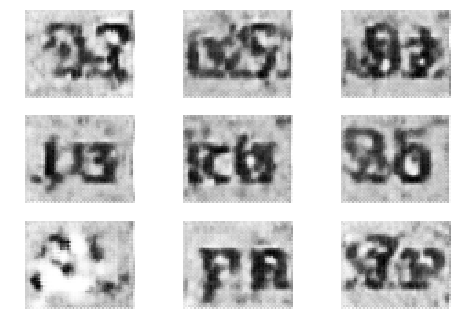

1701 [D loss: 0.851820] [G loss: 0.895155]
1702 [D loss: 0.898627] [G loss: 0.930491]
1703 [D loss: 0.748679] [G loss: 1.285613]
1704 [D loss: 0.688380] [G loss: 1.305129]
1705 [D loss: 0.880457] [G loss: 1.057287]
1706 [D loss: 0.788714] [G loss: 1.379841]
1707 [D loss: 0.756487] [G loss: 1.293368]
1708 [D loss: 0.871076] [G loss: 0.998374]
1709 [D loss: 0.739870] [G loss: 1.182247]
1710 [D loss: 0.768203] [G loss: 1.319207]
1711 [D loss: 0.651428] [G loss: 1.348424]
1712 [D loss: 0.839517] [G loss: 1.289589]
1713 [D loss: 0.699749] [G loss: 1.104091]
1714 [D loss: 0.789701] [G loss: 1.049344]
1715 [D loss: 0.784486] [G loss: 1.233165]
1716 [D loss: 0.837749] [G loss: 0.950748]
1717 [D loss: 0.567736] [G loss: 1.389758]
1718 [D loss: 0.841281] [G loss: 1.187324]
1719 [D loss: 0.691012] [G loss: 1.299659]
1720 [D loss: 0.744625] [G loss: 1.254088]
1721 [D loss: 0.798191] [G loss: 1.001091]
1722 [D loss: 0.834997] [G loss: 0.926274]
1723 [D loss: 0.520643] [G loss: 1.378507]
1724 [D los

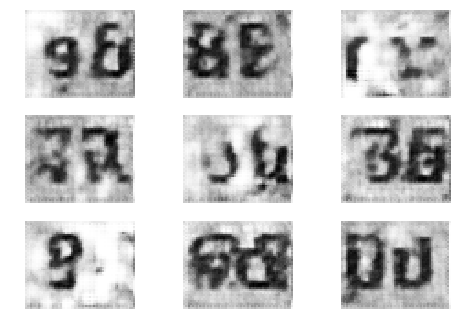

1751 [D loss: 0.699128] [G loss: 1.358850]
1752 [D loss: 0.982988] [G loss: 1.258262]
1753 [D loss: 0.879184] [G loss: 1.111580]
1754 [D loss: 0.714769] [G loss: 1.284916]
1755 [D loss: 0.747283] [G loss: 1.214165]
1756 [D loss: 0.714788] [G loss: 1.059560]
1757 [D loss: 0.795903] [G loss: 0.954844]
1758 [D loss: 0.597355] [G loss: 1.253313]
1759 [D loss: 0.804337] [G loss: 1.327456]
1760 [D loss: 0.893319] [G loss: 1.324396]
1761 [D loss: 0.685709] [G loss: 1.476105]
1762 [D loss: 0.720581] [G loss: 1.481065]
1763 [D loss: 0.627113] [G loss: 1.349845]
1764 [D loss: 0.773486] [G loss: 1.231124]
1765 [D loss: 0.857776] [G loss: 0.888712]
1766 [D loss: 0.648827] [G loss: 1.215957]
1767 [D loss: 0.826247] [G loss: 1.506878]
1768 [D loss: 1.004462] [G loss: 1.033963]
1769 [D loss: 0.802122] [G loss: 1.507949]
1770 [D loss: 1.010398] [G loss: 1.280336]
1771 [D loss: 0.566196] [G loss: 1.245654]
1772 [D loss: 0.874474] [G loss: 1.061318]
1773 [D loss: 0.750377] [G loss: 1.004423]
1774 [D los

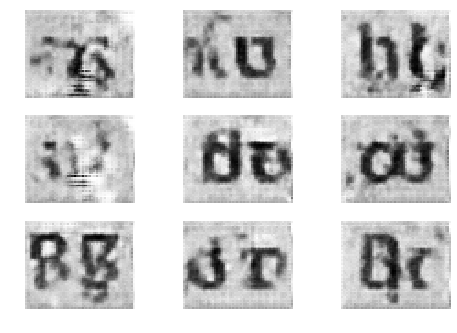

1801 [D loss: 0.836169] [G loss: 1.189596]
1802 [D loss: 1.057189] [G loss: 0.930662]
1803 [D loss: 0.679983] [G loss: 1.277627]
1804 [D loss: 0.797167] [G loss: 0.979617]
1805 [D loss: 0.734111] [G loss: 0.993546]
1806 [D loss: 0.814878] [G loss: 1.002532]
1807 [D loss: 0.836156] [G loss: 1.228344]
1808 [D loss: 0.924591] [G loss: 1.173932]
1809 [D loss: 0.747230] [G loss: 1.196393]
1810 [D loss: 0.813368] [G loss: 1.059381]
1811 [D loss: 0.856774] [G loss: 1.305405]
1812 [D loss: 0.680496] [G loss: 1.276625]
1813 [D loss: 0.798719] [G loss: 1.350773]
1814 [D loss: 0.748430] [G loss: 1.267493]
1815 [D loss: 0.845804] [G loss: 1.108677]
1816 [D loss: 0.952802] [G loss: 0.971723]
1817 [D loss: 0.675987] [G loss: 1.196410]
1818 [D loss: 0.877756] [G loss: 1.393666]
1819 [D loss: 0.826990] [G loss: 1.422406]
1820 [D loss: 0.882225] [G loss: 1.454773]
1821 [D loss: 0.793807] [G loss: 1.446803]
1822 [D loss: 0.920105] [G loss: 1.304076]
1823 [D loss: 0.772340] [G loss: 1.554522]
1824 [D los

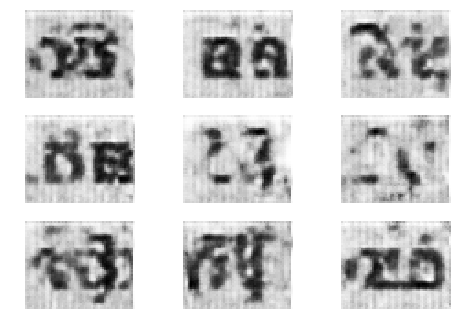

1851 [D loss: 1.014609] [G loss: 0.994961]
1852 [D loss: 0.745757] [G loss: 1.217282]
1853 [D loss: 0.814534] [G loss: 1.045878]
1854 [D loss: 0.996940] [G loss: 1.102152]
1855 [D loss: 0.937602] [G loss: 1.220168]
1856 [D loss: 0.666830] [G loss: 1.203165]
1857 [D loss: 0.775565] [G loss: 1.160369]
1858 [D loss: 0.663868] [G loss: 1.389864]
1859 [D loss: 0.841699] [G loss: 1.059839]
1860 [D loss: 0.905269] [G loss: 1.069296]
1861 [D loss: 0.728364] [G loss: 1.388295]
1862 [D loss: 0.658998] [G loss: 1.263981]
1863 [D loss: 0.803897] [G loss: 0.988217]
1864 [D loss: 0.624059] [G loss: 1.210621]
1865 [D loss: 0.790271] [G loss: 1.410576]
1866 [D loss: 0.828506] [G loss: 1.472460]
1867 [D loss: 0.687488] [G loss: 1.401826]
1868 [D loss: 0.835096] [G loss: 1.277755]
1869 [D loss: 0.753347] [G loss: 1.122256]
1870 [D loss: 0.660219] [G loss: 1.193888]
1871 [D loss: 0.807454] [G loss: 1.463924]
1872 [D loss: 0.890669] [G loss: 1.226269]
1873 [D loss: 0.825628] [G loss: 1.479087]
1874 [D los

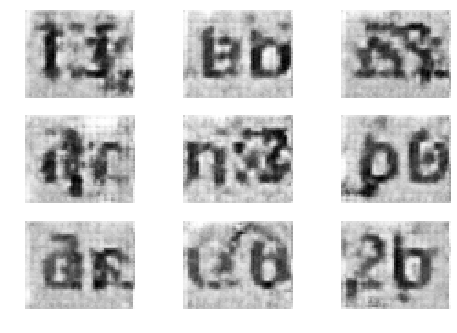

1901 [D loss: 0.741219] [G loss: 1.189587]
1902 [D loss: 0.508815] [G loss: 1.394047]
1903 [D loss: 0.762012] [G loss: 1.020128]
1904 [D loss: 0.915975] [G loss: 0.978237]
1905 [D loss: 0.792888] [G loss: 0.931236]
1906 [D loss: 0.652283] [G loss: 1.095508]
1907 [D loss: 0.840501] [G loss: 1.260287]
1908 [D loss: 0.641098] [G loss: 1.516332]
1909 [D loss: 0.980845] [G loss: 1.069064]
1910 [D loss: 0.618203] [G loss: 1.123898]
1911 [D loss: 0.545047] [G loss: 1.508889]
1912 [D loss: 0.815927] [G loss: 1.081220]
1913 [D loss: 0.842036] [G loss: 1.174954]
1914 [D loss: 0.744323] [G loss: 1.229242]
1915 [D loss: 0.809232] [G loss: 1.169213]
1916 [D loss: 0.717868] [G loss: 1.043281]
1917 [D loss: 0.832441] [G loss: 1.019675]
1918 [D loss: 0.755154] [G loss: 1.060915]
1919 [D loss: 0.810524] [G loss: 1.043282]
1920 [D loss: 0.525673] [G loss: 1.018426]
1921 [D loss: 0.664201] [G loss: 1.424710]
1922 [D loss: 0.955474] [G loss: 1.250517]
1923 [D loss: 1.071859] [G loss: 1.100029]
1924 [D los

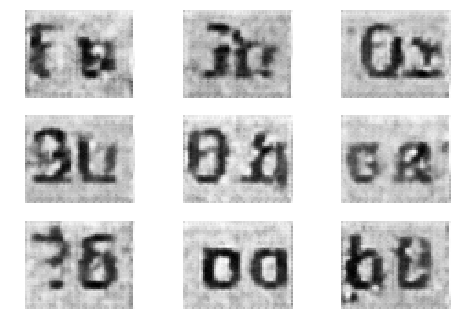

1951 [D loss: 0.916101] [G loss: 1.069449]
1952 [D loss: 0.903800] [G loss: 1.075800]
1953 [D loss: 0.873521] [G loss: 1.036219]
1954 [D loss: 0.838379] [G loss: 0.962576]
1955 [D loss: 0.808338] [G loss: 1.570916]
1956 [D loss: 0.697083] [G loss: 1.288132]
1957 [D loss: 0.867101] [G loss: 1.119218]
1958 [D loss: 0.716607] [G loss: 1.179054]
1959 [D loss: 0.865922] [G loss: 1.110503]
1960 [D loss: 0.725865] [G loss: 1.202059]
1961 [D loss: 0.902153] [G loss: 1.148330]
1962 [D loss: 0.740907] [G loss: 1.248132]
1963 [D loss: 0.972391] [G loss: 1.320858]
1964 [D loss: 0.768377] [G loss: 1.239343]
1965 [D loss: 0.818176] [G loss: 0.943529]
1966 [D loss: 0.716251] [G loss: 1.263831]
1967 [D loss: 0.830485] [G loss: 1.310241]
1968 [D loss: 0.901915] [G loss: 1.063897]
1969 [D loss: 0.692853] [G loss: 1.155315]
1970 [D loss: 0.775550] [G loss: 1.050342]
1971 [D loss: 0.707537] [G loss: 1.274857]
1972 [D loss: 0.920158] [G loss: 1.071534]
1973 [D loss: 0.902979] [G loss: 1.276051]
1974 [D los

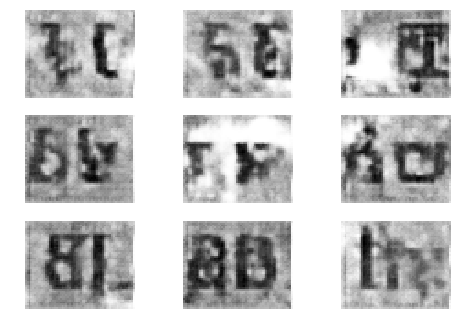

2001 [D loss: 0.636462] [G loss: 1.169526]
2002 [D loss: 0.877106] [G loss: 1.368009]
2003 [D loss: 0.903610] [G loss: 1.280604]
2004 [D loss: 0.742804] [G loss: 1.180489]
2005 [D loss: 0.560706] [G loss: 1.513765]
2006 [D loss: 0.537647] [G loss: 1.555358]
2007 [D loss: 0.852095] [G loss: 1.157372]
2008 [D loss: 0.835228] [G loss: 0.996400]
2009 [D loss: 0.628360] [G loss: 1.414064]
2010 [D loss: 0.801624] [G loss: 1.131303]
2011 [D loss: 0.693418] [G loss: 1.375137]
2012 [D loss: 0.977725] [G loss: 1.060779]
2013 [D loss: 0.773378] [G loss: 0.995905]
2014 [D loss: 0.702238] [G loss: 1.269022]
2015 [D loss: 0.836406] [G loss: 1.278045]
2016 [D loss: 0.788102] [G loss: 1.114416]
2017 [D loss: 0.939280] [G loss: 1.121960]
2018 [D loss: 0.780181] [G loss: 1.525625]
2019 [D loss: 0.766937] [G loss: 0.924527]
2020 [D loss: 0.748741] [G loss: 1.434399]
2021 [D loss: 0.750648] [G loss: 1.027881]
2022 [D loss: 0.689292] [G loss: 1.494679]
2023 [D loss: 0.758104] [G loss: 1.319553]
2024 [D los

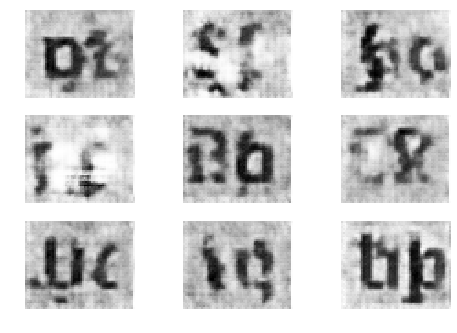

2051 [D loss: 0.759003] [G loss: 1.252074]
2052 [D loss: 0.707871] [G loss: 1.564970]
2053 [D loss: 0.536205] [G loss: 1.591436]
2054 [D loss: 0.546592] [G loss: 1.420524]
2055 [D loss: 0.621917] [G loss: 1.357947]
2056 [D loss: 0.844689] [G loss: 1.285884]
2057 [D loss: 0.856491] [G loss: 1.012827]
2058 [D loss: 0.707745] [G loss: 1.368676]
2059 [D loss: 0.762620] [G loss: 1.349735]
2060 [D loss: 0.892377] [G loss: 1.183059]
2061 [D loss: 0.622849] [G loss: 1.142918]
2062 [D loss: 0.804430] [G loss: 1.164086]
2063 [D loss: 0.800352] [G loss: 1.033830]
2064 [D loss: 0.840488] [G loss: 1.042586]
2065 [D loss: 0.681295] [G loss: 1.337022]
2066 [D loss: 0.968991] [G loss: 0.974121]
2067 [D loss: 0.864369] [G loss: 0.877434]
2068 [D loss: 0.722064] [G loss: 1.063126]
2069 [D loss: 0.737517] [G loss: 1.044782]
2070 [D loss: 0.662135] [G loss: 1.266756]
2071 [D loss: 0.769684] [G loss: 1.003038]
2072 [D loss: 0.585029] [G loss: 1.332002]
2073 [D loss: 0.643887] [G loss: 1.485502]
2074 [D los

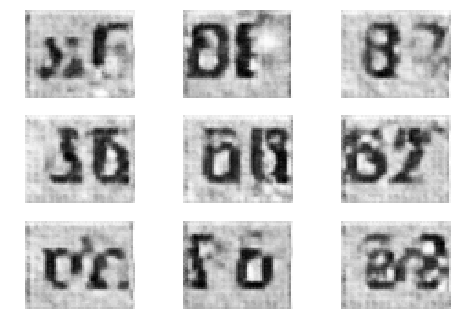

2101 [D loss: 0.816795] [G loss: 0.979648]
2102 [D loss: 0.710849] [G loss: 1.028159]
2103 [D loss: 0.657844] [G loss: 1.402149]
2104 [D loss: 0.439113] [G loss: 1.516603]
2105 [D loss: 0.570437] [G loss: 1.626182]
2106 [D loss: 0.848052] [G loss: 1.123067]
2107 [D loss: 0.543792] [G loss: 1.357366]
2108 [D loss: 0.629596] [G loss: 1.450980]
2109 [D loss: 0.775125] [G loss: 1.196339]
2110 [D loss: 0.446230] [G loss: 1.617380]
2111 [D loss: 0.627938] [G loss: 1.360987]
2112 [D loss: 1.039167] [G loss: 0.831964]
2113 [D loss: 0.657580] [G loss: 1.192303]
2114 [D loss: 0.499257] [G loss: 1.494751]
2115 [D loss: 1.032386] [G loss: 1.386034]
2116 [D loss: 0.909990] [G loss: 0.990885]
2117 [D loss: 0.722734] [G loss: 0.951295]
2118 [D loss: 0.672346] [G loss: 1.506773]
2119 [D loss: 0.657055] [G loss: 1.719357]
2120 [D loss: 0.978256] [G loss: 1.266459]
2121 [D loss: 0.789794] [G loss: 1.147434]
2122 [D loss: 0.708573] [G loss: 1.114789]
2123 [D loss: 0.885459] [G loss: 1.150306]
2124 [D los

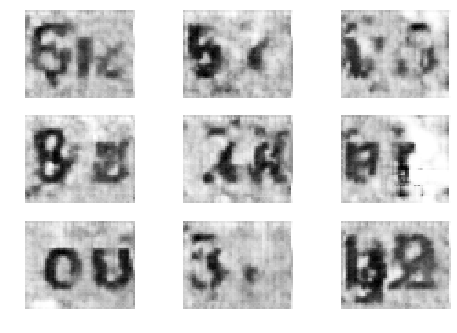

2151 [D loss: 0.689120] [G loss: 1.060377]
2152 [D loss: 0.969965] [G loss: 0.983126]
2153 [D loss: 0.768899] [G loss: 1.268297]
2154 [D loss: 0.684972] [G loss: 1.438628]
2155 [D loss: 0.764224] [G loss: 1.116361]
2156 [D loss: 0.737284] [G loss: 1.159654]
2157 [D loss: 0.686772] [G loss: 1.021928]
2158 [D loss: 0.840425] [G loss: 1.188685]
2159 [D loss: 0.732240] [G loss: 1.463191]
2160 [D loss: 0.737621] [G loss: 1.370312]
2161 [D loss: 0.801903] [G loss: 1.429997]
2162 [D loss: 0.638413] [G loss: 1.608201]
2163 [D loss: 0.758804] [G loss: 1.351133]
2164 [D loss: 0.986770] [G loss: 1.068962]
2165 [D loss: 0.691268] [G loss: 1.271660]
2166 [D loss: 0.773343] [G loss: 1.505120]
2167 [D loss: 0.729354] [G loss: 1.413333]
2168 [D loss: 0.761878] [G loss: 1.105368]
2169 [D loss: 0.661654] [G loss: 1.062360]
2170 [D loss: 0.529972] [G loss: 1.255066]
2171 [D loss: 0.856164] [G loss: 1.287156]
2172 [D loss: 0.682094] [G loss: 1.261940]
2173 [D loss: 0.684352] [G loss: 0.920409]
2174 [D los

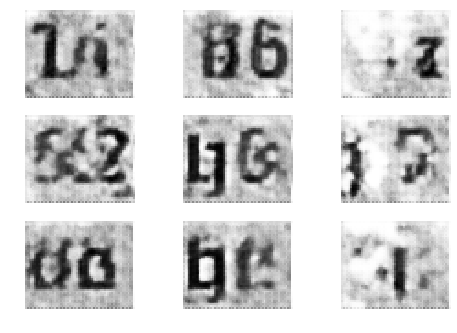

2201 [D loss: 0.732489] [G loss: 1.334555]
2202 [D loss: 0.930523] [G loss: 1.122464]
2203 [D loss: 0.781316] [G loss: 1.018339]
2204 [D loss: 0.702014] [G loss: 1.100266]
2205 [D loss: 0.615314] [G loss: 1.274902]
2206 [D loss: 0.568663] [G loss: 1.359139]
2207 [D loss: 0.744522] [G loss: 1.349986]
2208 [D loss: 0.617886] [G loss: 1.551708]
2209 [D loss: 0.802008] [G loss: 0.984731]
2210 [D loss: 0.610653] [G loss: 1.223551]
2211 [D loss: 0.717765] [G loss: 1.377399]
2212 [D loss: 0.689280] [G loss: 1.445812]
2213 [D loss: 0.675768] [G loss: 1.194467]
2214 [D loss: 0.889253] [G loss: 1.187117]
2215 [D loss: 0.814330] [G loss: 1.264201]
2216 [D loss: 0.581747] [G loss: 1.284588]
2217 [D loss: 0.608992] [G loss: 1.447668]
2218 [D loss: 0.809321] [G loss: 1.022439]
2219 [D loss: 0.835455] [G loss: 1.171715]
2220 [D loss: 0.910485] [G loss: 1.022385]
2221 [D loss: 0.597131] [G loss: 1.374120]
2222 [D loss: 0.734630] [G loss: 0.933406]
2223 [D loss: 0.830319] [G loss: 1.194202]
2224 [D los

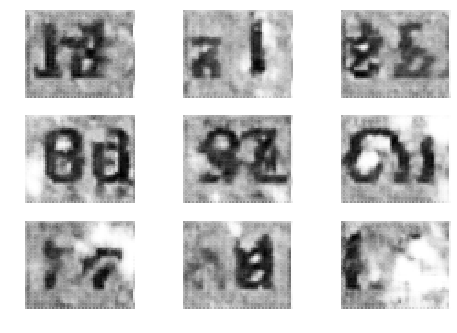

2251 [D loss: 0.764520] [G loss: 1.207790]
2252 [D loss: 0.579855] [G loss: 1.717799]
2253 [D loss: 0.553201] [G loss: 1.536577]
2254 [D loss: 0.597594] [G loss: 0.983686]
2255 [D loss: 0.684066] [G loss: 1.047459]
2256 [D loss: 0.965932] [G loss: 0.772749]
2257 [D loss: 0.751448] [G loss: 0.944994]
2258 [D loss: 0.764418] [G loss: 1.071489]
2259 [D loss: 0.773609] [G loss: 1.030654]
2260 [D loss: 0.754253] [G loss: 1.316623]
2261 [D loss: 0.623518] [G loss: 1.569535]
2262 [D loss: 0.901279] [G loss: 1.063739]
2263 [D loss: 0.908627] [G loss: 0.972750]
2264 [D loss: 0.626010] [G loss: 1.085569]
2265 [D loss: 0.814413] [G loss: 0.906823]
2266 [D loss: 0.746740] [G loss: 1.204542]
2267 [D loss: 0.667374] [G loss: 1.325614]
2268 [D loss: 0.950521] [G loss: 1.315962]
2269 [D loss: 0.796570] [G loss: 0.949580]
2270 [D loss: 0.850953] [G loss: 1.527905]
2271 [D loss: 0.705761] [G loss: 1.383266]
2272 [D loss: 0.769969] [G loss: 1.125208]
2273 [D loss: 0.882377] [G loss: 1.103194]
2274 [D los

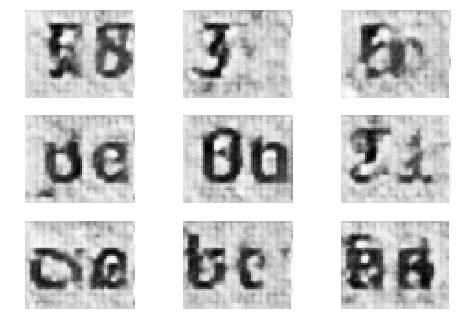

2301 [D loss: 0.834645] [G loss: 1.279837]
2302 [D loss: 0.735032] [G loss: 1.470642]
2303 [D loss: 0.763479] [G loss: 1.323013]
2304 [D loss: 0.804127] [G loss: 1.286380]
2305 [D loss: 0.786456] [G loss: 1.201239]
2306 [D loss: 0.603755] [G loss: 1.361866]
2307 [D loss: 0.855266] [G loss: 1.130624]
2308 [D loss: 0.750549] [G loss: 1.113741]
2309 [D loss: 0.802480] [G loss: 1.098478]
2310 [D loss: 0.667847] [G loss: 1.237064]
2311 [D loss: 0.687937] [G loss: 1.034173]
2312 [D loss: 0.605542] [G loss: 1.309824]
2313 [D loss: 0.760841] [G loss: 0.995674]
2314 [D loss: 0.765502] [G loss: 1.367243]
2315 [D loss: 0.629659] [G loss: 1.303275]
2316 [D loss: 0.970628] [G loss: 1.273839]
2317 [D loss: 0.997646] [G loss: 1.036384]
2318 [D loss: 0.792949] [G loss: 1.167547]
2319 [D loss: 0.710404] [G loss: 1.194199]
2320 [D loss: 0.539909] [G loss: 1.436486]
2321 [D loss: 0.503885] [G loss: 1.419332]
2322 [D loss: 0.743316] [G loss: 1.192351]
2323 [D loss: 0.520092] [G loss: 1.194290]
2324 [D los

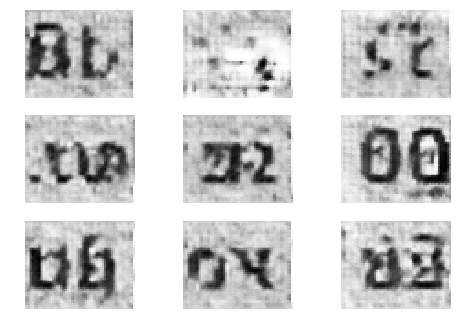

2351 [D loss: 0.641055] [G loss: 1.264253]
2352 [D loss: 0.701744] [G loss: 1.584879]
2353 [D loss: 0.619103] [G loss: 1.540213]
2354 [D loss: 0.847080] [G loss: 1.218253]
2355 [D loss: 0.606513] [G loss: 1.516567]
2356 [D loss: 0.836184] [G loss: 1.299627]
2357 [D loss: 0.720710] [G loss: 1.380118]
2358 [D loss: 0.753763] [G loss: 1.162534]
2359 [D loss: 0.713219] [G loss: 1.064237]
2360 [D loss: 0.679401] [G loss: 1.500087]
2361 [D loss: 0.811663] [G loss: 1.394633]
2362 [D loss: 0.732477] [G loss: 1.313328]
2363 [D loss: 0.894648] [G loss: 1.000628]
2364 [D loss: 0.693980] [G loss: 1.434924]
2365 [D loss: 0.754000] [G loss: 1.229187]
2366 [D loss: 0.669616] [G loss: 1.197194]
2367 [D loss: 0.706148] [G loss: 1.290165]
2368 [D loss: 0.834184] [G loss: 0.946720]
2369 [D loss: 0.612437] [G loss: 1.300963]
2370 [D loss: 0.576482] [G loss: 1.613734]
2371 [D loss: 0.882998] [G loss: 1.162755]
2372 [D loss: 0.644783] [G loss: 1.255709]
2373 [D loss: 1.020076] [G loss: 1.159063]
2374 [D los

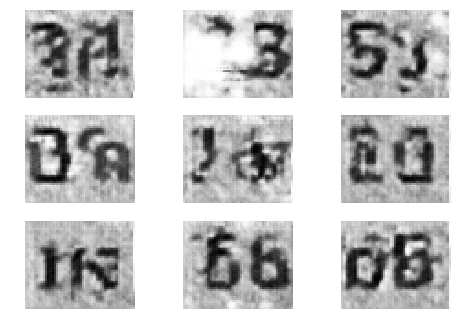

2401 [D loss: 0.574584] [G loss: 1.607171]
2402 [D loss: 0.887650] [G loss: 1.376613]
2403 [D loss: 0.642287] [G loss: 1.516364]
2404 [D loss: 0.931911] [G loss: 1.228780]
2405 [D loss: 0.539352] [G loss: 1.083361]
2406 [D loss: 0.930597] [G loss: 1.187671]
2407 [D loss: 0.736156] [G loss: 1.118052]
2408 [D loss: 0.781326] [G loss: 1.128963]
2409 [D loss: 0.667077] [G loss: 1.340799]
2410 [D loss: 0.625657] [G loss: 1.639187]
2411 [D loss: 0.736993] [G loss: 1.275656]
2412 [D loss: 0.687679] [G loss: 1.192028]
2413 [D loss: 0.573851] [G loss: 1.302874]
2414 [D loss: 0.662331] [G loss: 1.312752]
2415 [D loss: 0.842466] [G loss: 1.231200]
2416 [D loss: 0.732005] [G loss: 1.109799]
2417 [D loss: 0.774750] [G loss: 1.299365]
2418 [D loss: 0.802799] [G loss: 1.581952]
2419 [D loss: 0.644491] [G loss: 1.543782]
2420 [D loss: 0.843594] [G loss: 1.117978]
2421 [D loss: 0.778314] [G loss: 1.357261]
2422 [D loss: 0.524781] [G loss: 1.107702]
2423 [D loss: 0.700523] [G loss: 1.454569]
2424 [D los

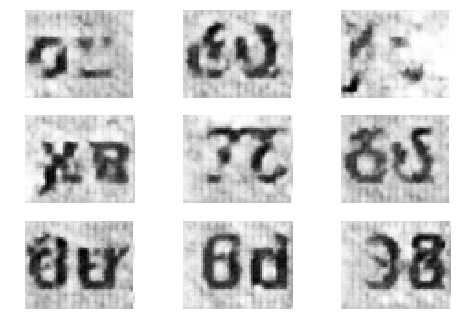

2451 [D loss: 0.657879] [G loss: 1.302588]
2452 [D loss: 0.832647] [G loss: 1.548476]
2453 [D loss: 0.530137] [G loss: 1.499063]
2454 [D loss: 0.981583] [G loss: 1.105037]
2455 [D loss: 0.837631] [G loss: 1.290056]
2456 [D loss: 0.554973] [G loss: 1.430317]
2457 [D loss: 0.794314] [G loss: 1.235692]
2458 [D loss: 0.832443] [G loss: 1.205944]
2459 [D loss: 0.592436] [G loss: 1.471495]
2460 [D loss: 0.734647] [G loss: 1.102073]
2461 [D loss: 0.813895] [G loss: 1.293924]
2462 [D loss: 0.810602] [G loss: 0.989235]
2463 [D loss: 0.723885] [G loss: 1.536955]
2464 [D loss: 0.595741] [G loss: 1.481278]
2465 [D loss: 0.576122] [G loss: 1.490870]
2466 [D loss: 0.933612] [G loss: 1.219773]
2467 [D loss: 0.638673] [G loss: 1.175521]
2468 [D loss: 0.632033] [G loss: 1.451987]
2469 [D loss: 0.837572] [G loss: 1.155359]
2470 [D loss: 0.748771] [G loss: 1.382315]
2471 [D loss: 0.843542] [G loss: 1.412575]
2472 [D loss: 0.906401] [G loss: 1.310663]
2473 [D loss: 0.722044] [G loss: 1.126030]
2474 [D los

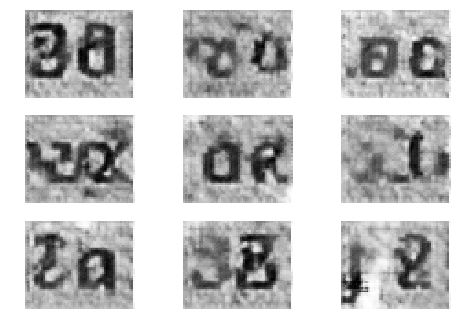

2501 [D loss: 0.715308] [G loss: 1.205820]
2502 [D loss: 0.777984] [G loss: 0.997500]
2503 [D loss: 0.717292] [G loss: 1.100854]
2504 [D loss: 0.884014] [G loss: 1.147624]
2505 [D loss: 0.579827] [G loss: 1.317149]
2506 [D loss: 0.878758] [G loss: 1.166197]
2507 [D loss: 0.606337] [G loss: 1.293949]
2508 [D loss: 0.618384] [G loss: 1.180797]
2509 [D loss: 0.677576] [G loss: 1.326188]
2510 [D loss: 0.611889] [G loss: 1.336594]
2511 [D loss: 0.949365] [G loss: 1.049436]
2512 [D loss: 0.660695] [G loss: 0.966835]
2513 [D loss: 0.656599] [G loss: 1.051493]
2514 [D loss: 0.671019] [G loss: 0.889556]
2515 [D loss: 0.672442] [G loss: 1.475278]
2516 [D loss: 0.829034] [G loss: 1.280249]
2517 [D loss: 0.799528] [G loss: 1.395291]
2518 [D loss: 0.812422] [G loss: 1.276942]
2519 [D loss: 0.746858] [G loss: 1.387048]
2520 [D loss: 0.771775] [G loss: 1.440583]
2521 [D loss: 0.603381] [G loss: 1.083529]
2522 [D loss: 0.639308] [G loss: 1.294114]
2523 [D loss: 0.749339] [G loss: 1.572913]
2524 [D los

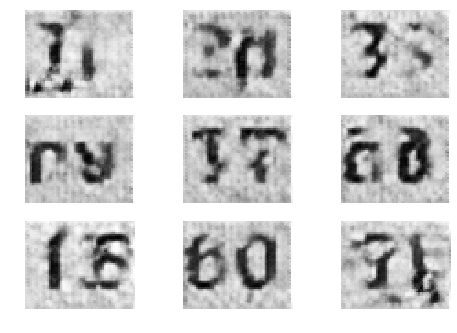

2551 [D loss: 0.834711] [G loss: 1.296956]
2552 [D loss: 0.829463] [G loss: 1.357466]
2553 [D loss: 0.778857] [G loss: 1.214575]
2554 [D loss: 0.562631] [G loss: 0.993821]
2555 [D loss: 0.764392] [G loss: 1.302325]
2556 [D loss: 0.662134] [G loss: 1.162268]
2557 [D loss: 0.689700] [G loss: 1.354218]
2558 [D loss: 0.687493] [G loss: 1.210704]
2559 [D loss: 0.687392] [G loss: 1.320909]
2560 [D loss: 0.772496] [G loss: 1.115572]
2561 [D loss: 0.680815] [G loss: 1.240524]
2562 [D loss: 0.707667] [G loss: 1.146520]
2563 [D loss: 0.611573] [G loss: 1.404828]
2564 [D loss: 0.744537] [G loss: 1.349489]
2565 [D loss: 0.562585] [G loss: 1.616336]
2566 [D loss: 0.856047] [G loss: 1.353364]
2567 [D loss: 0.549592] [G loss: 1.334330]
2568 [D loss: 0.710313] [G loss: 1.661594]
2569 [D loss: 0.721183] [G loss: 1.375352]
2570 [D loss: 0.720757] [G loss: 1.353259]
2571 [D loss: 0.831273] [G loss: 1.381131]
2572 [D loss: 0.764144] [G loss: 1.347668]
2573 [D loss: 0.714887] [G loss: 1.213109]
2574 [D los

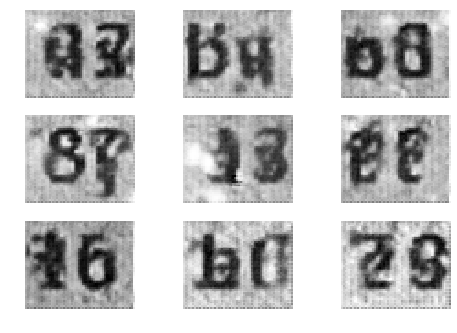

2601 [D loss: 0.681388] [G loss: 1.084000]
2602 [D loss: 0.692724] [G loss: 1.148636]
2603 [D loss: 0.783095] [G loss: 1.581424]
2604 [D loss: 0.781669] [G loss: 1.099065]
2605 [D loss: 0.802008] [G loss: 1.218200]
2606 [D loss: 0.746866] [G loss: 1.311820]
2607 [D loss: 0.749059] [G loss: 1.158056]
2608 [D loss: 0.584747] [G loss: 1.296141]
2609 [D loss: 0.723373] [G loss: 1.156351]
2610 [D loss: 0.480839] [G loss: 1.457609]
2611 [D loss: 0.672953] [G loss: 1.266252]
2612 [D loss: 0.856858] [G loss: 1.348228]
2613 [D loss: 0.804332] [G loss: 1.289939]
2614 [D loss: 0.809672] [G loss: 1.259127]
2615 [D loss: 0.873760] [G loss: 1.217328]
2616 [D loss: 0.650710] [G loss: 1.231875]
2617 [D loss: 0.889528] [G loss: 1.350482]
2618 [D loss: 0.815981] [G loss: 1.344873]
2619 [D loss: 0.636826] [G loss: 1.268234]
2620 [D loss: 0.733025] [G loss: 1.120417]
2621 [D loss: 0.904409] [G loss: 1.146646]
2622 [D loss: 1.002290] [G loss: 1.201108]
2623 [D loss: 0.676529] [G loss: 1.474042]
2624 [D los

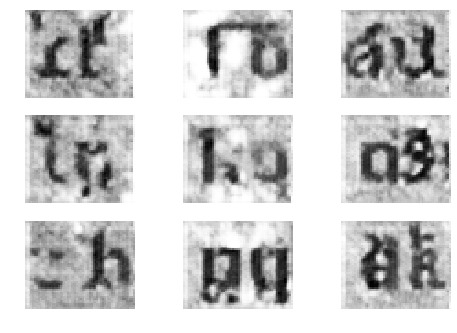

2651 [D loss: 0.699172] [G loss: 1.158101]
2652 [D loss: 0.782623] [G loss: 1.036477]
2653 [D loss: 0.714299] [G loss: 1.213172]
2654 [D loss: 0.482729] [G loss: 1.178115]
2655 [D loss: 0.669053] [G loss: 1.557243]
2656 [D loss: 0.759893] [G loss: 1.483486]
2657 [D loss: 0.508722] [G loss: 1.235260]
2658 [D loss: 0.761223] [G loss: 1.207347]
2659 [D loss: 0.535177] [G loss: 1.316356]
2660 [D loss: 1.084530] [G loss: 0.767385]
2661 [D loss: 0.791545] [G loss: 1.020355]
2662 [D loss: 0.580803] [G loss: 1.362376]
2663 [D loss: 0.768473] [G loss: 1.196463]
2664 [D loss: 0.676354] [G loss: 1.249864]
2665 [D loss: 0.756336] [G loss: 1.230528]
2666 [D loss: 0.604794] [G loss: 1.054842]
2667 [D loss: 0.716507] [G loss: 1.229246]
2668 [D loss: 0.763927] [G loss: 1.129081]
2669 [D loss: 0.655873] [G loss: 1.497389]
2670 [D loss: 0.707712] [G loss: 1.426959]
2671 [D loss: 0.652475] [G loss: 1.066486]
2672 [D loss: 0.683509] [G loss: 1.655815]
2673 [D loss: 0.737556] [G loss: 1.261369]
2674 [D los

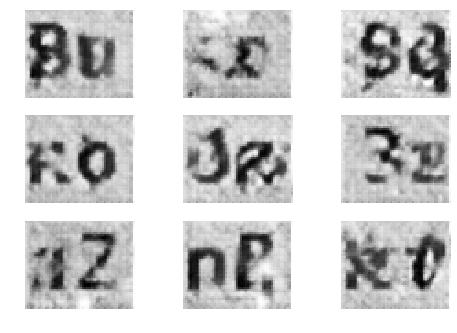

2701 [D loss: 0.701859] [G loss: 1.178816]
2702 [D loss: 0.566199] [G loss: 1.079907]
2703 [D loss: 0.627448] [G loss: 1.644740]
2704 [D loss: 0.862945] [G loss: 1.143189]
2705 [D loss: 0.637805] [G loss: 0.812631]
2706 [D loss: 0.784261] [G loss: 1.429256]
2707 [D loss: 0.799937] [G loss: 1.117707]
2708 [D loss: 0.605482] [G loss: 1.348903]
2709 [D loss: 0.649139] [G loss: 1.325226]
2710 [D loss: 0.649403] [G loss: 1.045935]
2711 [D loss: 0.697012] [G loss: 1.017783]
2712 [D loss: 0.635333] [G loss: 1.345101]
2713 [D loss: 0.800344] [G loss: 0.879531]
2714 [D loss: 0.658562] [G loss: 1.199028]
2715 [D loss: 0.615897] [G loss: 1.351714]
2716 [D loss: 0.815684] [G loss: 1.078413]
2717 [D loss: 0.710772] [G loss: 1.163104]
2718 [D loss: 0.616313] [G loss: 1.371085]
2719 [D loss: 0.658659] [G loss: 1.555950]
2720 [D loss: 0.844171] [G loss: 1.443824]
2721 [D loss: 0.618359] [G loss: 1.257823]
2722 [D loss: 0.766186] [G loss: 1.161000]
2723 [D loss: 0.716427] [G loss: 1.414830]
2724 [D los

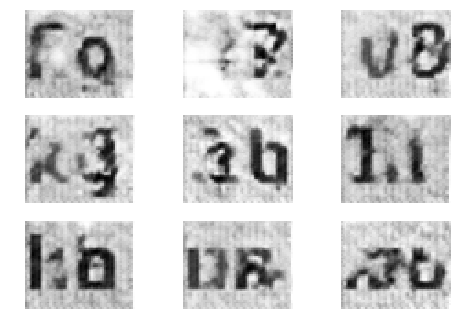

2751 [D loss: 0.545870] [G loss: 1.474356]
2752 [D loss: 0.712413] [G loss: 1.195407]
2753 [D loss: 0.812890] [G loss: 1.645695]
2754 [D loss: 0.643842] [G loss: 1.424476]
2755 [D loss: 0.676367] [G loss: 1.612652]
2756 [D loss: 0.790916] [G loss: 1.136236]
2757 [D loss: 0.830596] [G loss: 1.337503]
2758 [D loss: 0.896515] [G loss: 1.420900]
2759 [D loss: 0.555193] [G loss: 1.548981]
2760 [D loss: 0.625129] [G loss: 1.389620]
2761 [D loss: 0.812919] [G loss: 1.522673]
2762 [D loss: 0.772619] [G loss: 1.089857]
2763 [D loss: 0.630066] [G loss: 1.453554]
2764 [D loss: 0.718664] [G loss: 1.222528]
2765 [D loss: 0.539229] [G loss: 1.630455]
2766 [D loss: 0.473394] [G loss: 1.813233]
2767 [D loss: 0.892361] [G loss: 1.217288]
2768 [D loss: 0.859913] [G loss: 0.937272]
2769 [D loss: 0.857664] [G loss: 1.075795]
2770 [D loss: 0.703936] [G loss: 1.191844]
2771 [D loss: 0.890512] [G loss: 0.800029]
2772 [D loss: 0.696569] [G loss: 1.240598]
2773 [D loss: 0.743396] [G loss: 1.136451]
2774 [D los

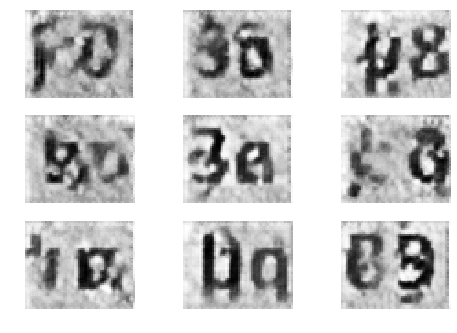

2801 [D loss: 0.483441] [G loss: 1.570957]
2802 [D loss: 0.571910] [G loss: 1.542508]
2803 [D loss: 0.761043] [G loss: 1.398923]
2804 [D loss: 0.719364] [G loss: 1.261752]
2805 [D loss: 0.579981] [G loss: 1.580333]
2806 [D loss: 0.543267] [G loss: 1.619261]
2807 [D loss: 0.784432] [G loss: 1.150742]
2808 [D loss: 0.803096] [G loss: 1.051232]
2809 [D loss: 0.648467] [G loss: 1.290211]
2810 [D loss: 0.540015] [G loss: 1.474117]
2811 [D loss: 0.702532] [G loss: 1.184088]
2812 [D loss: 0.616879] [G loss: 1.219608]
2813 [D loss: 0.734916] [G loss: 1.418059]
2814 [D loss: 0.696497] [G loss: 1.350766]
2815 [D loss: 0.498021] [G loss: 1.643345]
2816 [D loss: 0.876290] [G loss: 1.261436]
2817 [D loss: 0.862475] [G loss: 1.087196]
2818 [D loss: 0.864155] [G loss: 1.116994]
2819 [D loss: 0.588718] [G loss: 1.681378]
2820 [D loss: 0.735557] [G loss: 1.356469]
2821 [D loss: 0.711363] [G loss: 1.114326]
2822 [D loss: 0.756344] [G loss: 1.301011]
2823 [D loss: 0.714704] [G loss: 1.076459]
2824 [D los

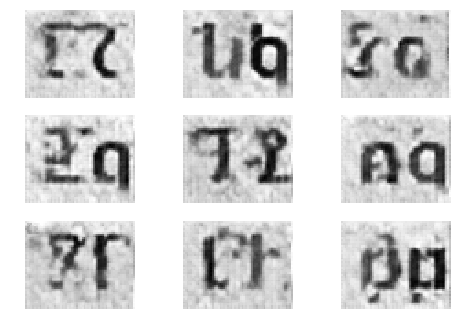

2851 [D loss: 0.849960] [G loss: 0.958606]
2852 [D loss: 0.663059] [G loss: 1.137887]
2853 [D loss: 0.634849] [G loss: 1.492377]
2854 [D loss: 0.874939] [G loss: 1.236472]
2855 [D loss: 0.646658] [G loss: 1.609177]
2856 [D loss: 0.621779] [G loss: 1.224575]
2857 [D loss: 0.695110] [G loss: 1.016595]
2858 [D loss: 0.721493] [G loss: 1.054315]
2859 [D loss: 0.738455] [G loss: 1.412683]
2860 [D loss: 0.625867] [G loss: 1.460708]
2861 [D loss: 0.735760] [G loss: 1.422420]
2862 [D loss: 0.646201] [G loss: 1.369277]
2863 [D loss: 0.527619] [G loss: 1.145074]
2864 [D loss: 0.676448] [G loss: 1.172015]
2865 [D loss: 0.727472] [G loss: 1.335616]
2866 [D loss: 0.692730] [G loss: 1.243822]
2867 [D loss: 0.607154] [G loss: 1.639243]
2868 [D loss: 0.620711] [G loss: 1.611900]
2869 [D loss: 0.735112] [G loss: 1.318591]
2870 [D loss: 0.753473] [G loss: 1.379942]
2871 [D loss: 0.684514] [G loss: 1.397972]
2872 [D loss: 0.540025] [G loss: 1.319339]
2873 [D loss: 0.841110] [G loss: 1.320745]
2874 [D los

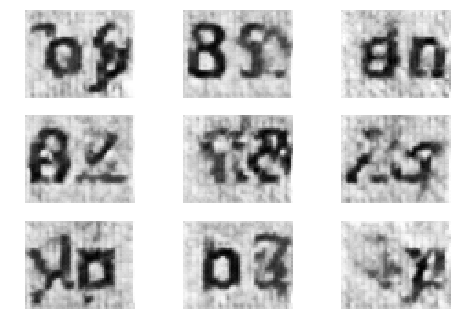

2901 [D loss: 0.486879] [G loss: 1.503692]
2902 [D loss: 0.756785] [G loss: 1.406031]
2903 [D loss: 0.649830] [G loss: 1.564937]
2904 [D loss: 0.600506] [G loss: 1.686926]
2905 [D loss: 0.835599] [G loss: 1.345969]
2906 [D loss: 0.843427] [G loss: 1.147370]
2907 [D loss: 0.664299] [G loss: 1.310424]
2908 [D loss: 0.736517] [G loss: 1.165187]
2909 [D loss: 0.520298] [G loss: 1.464552]
2910 [D loss: 0.510895] [G loss: 1.579804]
2911 [D loss: 0.671882] [G loss: 1.349971]
2912 [D loss: 0.526351] [G loss: 1.396071]
2913 [D loss: 0.710923] [G loss: 1.538679]
2914 [D loss: 0.822795] [G loss: 1.265037]
2915 [D loss: 0.776167] [G loss: 1.475332]
2916 [D loss: 0.673919] [G loss: 1.212613]
2917 [D loss: 0.845670] [G loss: 1.364185]
2918 [D loss: 0.509123] [G loss: 1.306053]
2919 [D loss: 0.814242] [G loss: 1.230983]
2920 [D loss: 0.646561] [G loss: 1.206823]
2921 [D loss: 0.461695] [G loss: 1.391211]
2922 [D loss: 0.510293] [G loss: 1.406274]
2923 [D loss: 0.752312] [G loss: 1.337859]
2924 [D los

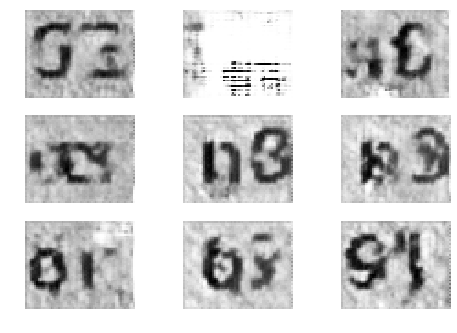

2951 [D loss: 0.936980] [G loss: 1.084794]
2952 [D loss: 0.784886] [G loss: 1.220662]
2953 [D loss: 0.881061] [G loss: 1.317116]
2954 [D loss: 0.629380] [G loss: 0.991162]
2955 [D loss: 0.563835] [G loss: 1.429319]
2956 [D loss: 0.760996] [G loss: 1.273344]
2957 [D loss: 0.639018] [G loss: 1.533254]
2958 [D loss: 0.528170] [G loss: 1.432227]
2959 [D loss: 0.620194] [G loss: 1.559946]
2960 [D loss: 0.610547] [G loss: 1.672657]
2961 [D loss: 0.491891] [G loss: 1.624349]
2962 [D loss: 0.737683] [G loss: 1.340903]
2963 [D loss: 0.725519] [G loss: 1.262815]
2964 [D loss: 0.662373] [G loss: 1.686387]
2965 [D loss: 0.703187] [G loss: 1.431079]
2966 [D loss: 0.598593] [G loss: 1.812793]
2967 [D loss: 0.686165] [G loss: 1.355347]
2968 [D loss: 0.538210] [G loss: 1.256291]
2969 [D loss: 0.394239] [G loss: 1.750865]
2970 [D loss: 0.818331] [G loss: 1.213115]
2971 [D loss: 0.471553] [G loss: 1.685663]
2972 [D loss: 0.734853] [G loss: 1.369084]
2973 [D loss: 0.453236] [G loss: 1.679800]
2974 [D los

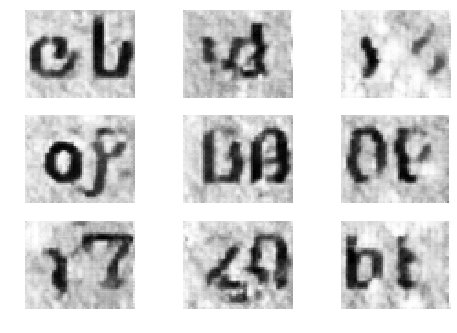

3001 [D loss: 0.646767] [G loss: 1.248981]
3002 [D loss: 0.661368] [G loss: 1.356227]
3003 [D loss: 0.627041] [G loss: 1.559484]
3004 [D loss: 0.776125] [G loss: 1.638719]
3005 [D loss: 0.700773] [G loss: 1.315149]
3006 [D loss: 0.558608] [G loss: 1.547248]
3007 [D loss: 0.831286] [G loss: 1.309444]
3008 [D loss: 0.607229] [G loss: 1.312405]
3009 [D loss: 0.537317] [G loss: 1.317364]
3010 [D loss: 0.802810] [G loss: 1.681010]
3011 [D loss: 0.598530] [G loss: 1.467763]
3012 [D loss: 0.742885] [G loss: 1.439653]
3013 [D loss: 0.668666] [G loss: 1.294610]
3014 [D loss: 0.691725] [G loss: 1.446869]
3015 [D loss: 0.742505] [G loss: 1.217032]
3016 [D loss: 0.735201] [G loss: 1.153884]
3017 [D loss: 0.708287] [G loss: 1.334524]
3018 [D loss: 0.791765] [G loss: 1.259479]
3019 [D loss: 0.661302] [G loss: 1.553676]
3020 [D loss: 0.791036] [G loss: 1.418962]
3021 [D loss: 0.709509] [G loss: 1.152824]
3022 [D loss: 0.756695] [G loss: 1.097749]
3023 [D loss: 0.646208] [G loss: 1.784315]
3024 [D los

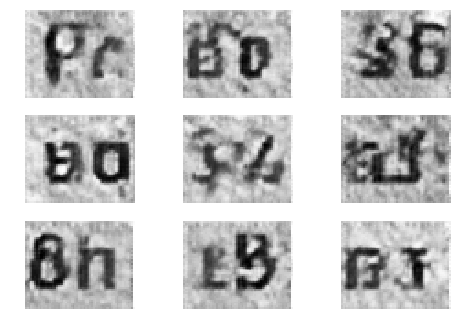

3051 [D loss: 0.806697] [G loss: 1.509616]
3052 [D loss: 0.738530] [G loss: 1.399242]
3053 [D loss: 0.516198] [G loss: 1.737033]
3054 [D loss: 0.595820] [G loss: 1.571458]
3055 [D loss: 0.591774] [G loss: 1.266627]
3056 [D loss: 0.756829] [G loss: 1.281483]
3057 [D loss: 0.602863] [G loss: 1.515539]
3058 [D loss: 0.704104] [G loss: 1.489030]
3059 [D loss: 0.650571] [G loss: 1.155758]
3060 [D loss: 0.780167] [G loss: 1.583592]
3061 [D loss: 0.691389] [G loss: 1.473449]
3062 [D loss: 0.755587] [G loss: 1.261924]
3063 [D loss: 0.756024] [G loss: 1.127565]
3064 [D loss: 0.569824] [G loss: 1.167099]
3065 [D loss: 0.794634] [G loss: 0.930544]
3066 [D loss: 0.772369] [G loss: 1.207726]
3067 [D loss: 0.650924] [G loss: 1.048534]
3068 [D loss: 0.772702] [G loss: 1.527945]
3069 [D loss: 0.697315] [G loss: 1.089858]
3070 [D loss: 0.588572] [G loss: 1.621807]
3071 [D loss: 0.493511] [G loss: 1.438590]
3072 [D loss: 0.584199] [G loss: 1.307980]
3073 [D loss: 0.637536] [G loss: 1.196516]
3074 [D los

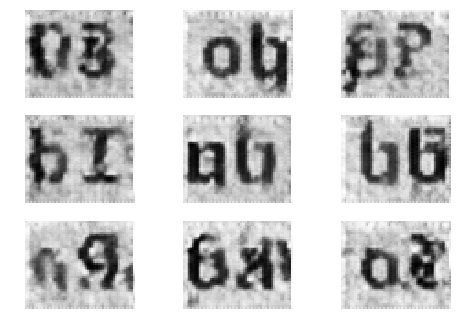

3101 [D loss: 0.509156] [G loss: 1.614187]
3102 [D loss: 0.747846] [G loss: 1.137882]
3103 [D loss: 0.703245] [G loss: 1.221254]
3104 [D loss: 0.639955] [G loss: 1.503291]
3105 [D loss: 0.579799] [G loss: 1.587341]
3106 [D loss: 0.724701] [G loss: 1.638712]
3107 [D loss: 0.743024] [G loss: 1.318221]
3108 [D loss: 0.663038] [G loss: 1.192652]
3109 [D loss: 0.551794] [G loss: 1.598969]
3110 [D loss: 0.661268] [G loss: 1.232148]
3111 [D loss: 0.567194] [G loss: 1.650014]
3112 [D loss: 0.596240] [G loss: 1.255154]
3113 [D loss: 0.652080] [G loss: 1.396327]
3114 [D loss: 0.608531] [G loss: 1.325826]
3115 [D loss: 0.569290] [G loss: 1.500936]
3116 [D loss: 0.681359] [G loss: 1.278338]
3117 [D loss: 0.731517] [G loss: 1.379352]
3118 [D loss: 0.558071] [G loss: 1.357707]
3119 [D loss: 0.657203] [G loss: 1.581785]
3120 [D loss: 0.819075] [G loss: 1.465703]
3121 [D loss: 0.688943] [G loss: 1.391249]
3122 [D loss: 0.630702] [G loss: 1.225412]
3123 [D loss: 0.563032] [G loss: 1.429664]
3124 [D los

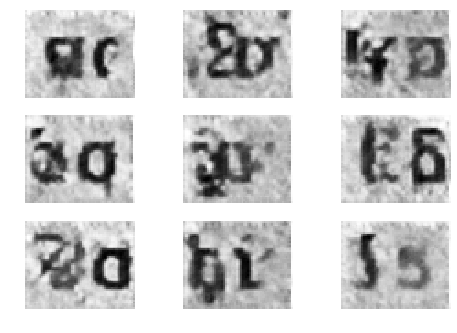

3151 [D loss: 0.773284] [G loss: 1.291728]
3152 [D loss: 0.530291] [G loss: 1.659934]
3153 [D loss: 0.619122] [G loss: 1.538934]
3154 [D loss: 0.711177] [G loss: 1.662846]
3155 [D loss: 0.642442] [G loss: 1.457376]
3156 [D loss: 0.482223] [G loss: 1.475447]
3157 [D loss: 0.653041] [G loss: 1.754082]
3158 [D loss: 0.801125] [G loss: 1.386206]
3159 [D loss: 0.572002] [G loss: 1.504835]
3160 [D loss: 0.597505] [G loss: 1.305962]
3161 [D loss: 0.701209] [G loss: 1.664127]
3162 [D loss: 0.634154] [G loss: 1.711383]
3163 [D loss: 0.630591] [G loss: 1.404418]
3164 [D loss: 0.811385] [G loss: 1.730480]
3165 [D loss: 0.707953] [G loss: 1.231088]
3166 [D loss: 0.479546] [G loss: 1.731898]
3167 [D loss: 0.748298] [G loss: 1.295335]
3168 [D loss: 0.703156] [G loss: 1.255914]
3169 [D loss: 0.497541] [G loss: 1.419019]
3170 [D loss: 0.571653] [G loss: 1.834230]
3171 [D loss: 0.488410] [G loss: 1.833113]
3172 [D loss: 0.881705] [G loss: 1.577361]
3173 [D loss: 0.404616] [G loss: 1.682321]
3174 [D los

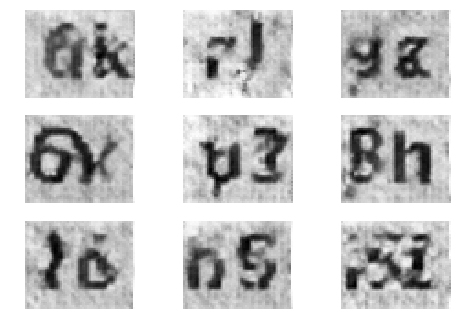

3201 [D loss: 0.615943] [G loss: 1.353306]
3202 [D loss: 0.707513] [G loss: 1.559049]
3203 [D loss: 0.866377] [G loss: 1.410426]
3204 [D loss: 0.812956] [G loss: 1.294837]
3205 [D loss: 0.778457] [G loss: 1.429823]
3206 [D loss: 0.664109] [G loss: 1.840816]
3207 [D loss: 0.566140] [G loss: 1.559746]
3208 [D loss: 0.748041] [G loss: 1.488790]
3209 [D loss: 0.582681] [G loss: 1.236189]
3210 [D loss: 0.649373] [G loss: 1.620219]
3211 [D loss: 0.595460] [G loss: 1.602532]
3212 [D loss: 0.731187] [G loss: 1.303864]
3213 [D loss: 0.584181] [G loss: 1.486941]
3214 [D loss: 0.707697] [G loss: 1.325324]
3215 [D loss: 0.647615] [G loss: 1.484576]
3216 [D loss: 0.746981] [G loss: 1.389559]
3217 [D loss: 0.692117] [G loss: 1.538977]
3218 [D loss: 0.542756] [G loss: 1.368119]
3219 [D loss: 0.600441] [G loss: 1.186920]
3220 [D loss: 0.801376] [G loss: 1.388892]
3221 [D loss: 0.590572] [G loss: 1.505037]
3222 [D loss: 0.520497] [G loss: 1.738399]
3223 [D loss: 0.535142] [G loss: 1.847693]
3224 [D los

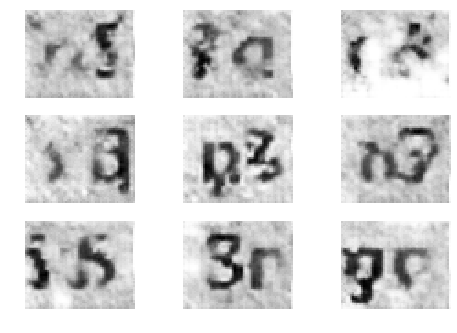

3251 [D loss: 0.484444] [G loss: 1.606448]
3252 [D loss: 0.760773] [G loss: 1.652972]
3253 [D loss: 0.684323] [G loss: 1.113599]
3254 [D loss: 0.532662] [G loss: 1.430749]
3255 [D loss: 0.481728] [G loss: 1.409305]
3256 [D loss: 0.948479] [G loss: 1.398131]
3257 [D loss: 0.663303] [G loss: 1.548508]
3258 [D loss: 0.724525] [G loss: 1.578491]
3259 [D loss: 0.647650] [G loss: 1.756964]
3260 [D loss: 0.856932] [G loss: 1.414163]
3261 [D loss: 0.381554] [G loss: 1.783348]
3262 [D loss: 0.698138] [G loss: 1.466948]
3263 [D loss: 0.712636] [G loss: 1.194956]
3264 [D loss: 0.526114] [G loss: 1.777478]
3265 [D loss: 0.644091] [G loss: 1.454243]
3266 [D loss: 0.847658] [G loss: 1.192919]
3267 [D loss: 0.535876] [G loss: 1.429086]
3268 [D loss: 0.360192] [G loss: 1.493607]
3269 [D loss: 0.492767] [G loss: 2.055547]
3270 [D loss: 0.720617] [G loss: 1.665860]
3271 [D loss: 0.582874] [G loss: 1.501484]
3272 [D loss: 0.776615] [G loss: 1.163016]
3273 [D loss: 0.793481] [G loss: 1.455455]
3274 [D los

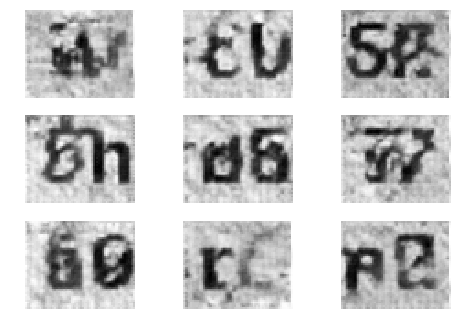

3301 [D loss: 0.749733] [G loss: 1.455780]
3302 [D loss: 0.852034] [G loss: 1.380717]
3303 [D loss: 0.474993] [G loss: 1.491347]
3304 [D loss: 0.777739] [G loss: 1.364404]
3305 [D loss: 0.697081] [G loss: 1.563078]
3306 [D loss: 0.643257] [G loss: 1.484595]
3307 [D loss: 0.670436] [G loss: 1.407655]
3308 [D loss: 0.633010] [G loss: 1.674364]
3309 [D loss: 0.749722] [G loss: 1.716154]
3310 [D loss: 0.793539] [G loss: 1.617163]
3311 [D loss: 0.802879] [G loss: 1.578782]
3312 [D loss: 0.566362] [G loss: 1.494588]
3313 [D loss: 0.772886] [G loss: 1.397102]
3314 [D loss: 0.856325] [G loss: 1.548531]
3315 [D loss: 0.823484] [G loss: 1.104213]
3316 [D loss: 0.631219] [G loss: 1.231929]
3317 [D loss: 0.662727] [G loss: 1.796385]
3318 [D loss: 0.706935] [G loss: 1.556894]
3319 [D loss: 0.654603] [G loss: 1.221309]
3320 [D loss: 1.027653] [G loss: 1.336308]
3321 [D loss: 0.645834] [G loss: 1.461147]
3322 [D loss: 0.595051] [G loss: 1.752169]
3323 [D loss: 0.753929] [G loss: 1.421799]
3324 [D los

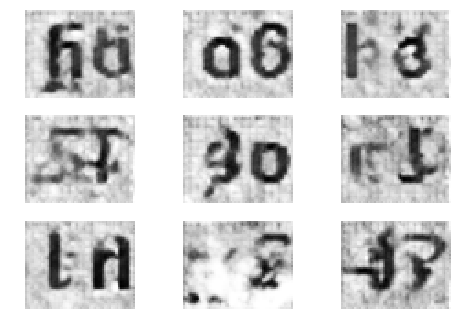

3351 [D loss: 0.604503] [G loss: 1.368365]
3352 [D loss: 0.641766] [G loss: 1.693092]
3353 [D loss: 0.726377] [G loss: 1.411155]
3354 [D loss: 0.517756] [G loss: 1.814414]
3355 [D loss: 0.513044] [G loss: 1.937783]
3356 [D loss: 0.628432] [G loss: 1.857842]
3357 [D loss: 0.750532] [G loss: 1.264429]
3358 [D loss: 0.671960] [G loss: 1.557833]
3359 [D loss: 0.610415] [G loss: 1.237384]
3360 [D loss: 0.724779] [G loss: 1.389303]
3361 [D loss: 0.629928] [G loss: 1.497510]
3362 [D loss: 0.673685] [G loss: 1.621742]
3363 [D loss: 0.630043] [G loss: 1.697251]
3364 [D loss: 0.574753] [G loss: 1.303197]
3365 [D loss: 0.647318] [G loss: 1.324661]
3366 [D loss: 0.638850] [G loss: 1.281488]
3367 [D loss: 0.730422] [G loss: 1.415878]
3368 [D loss: 0.568889] [G loss: 1.704727]
3369 [D loss: 0.657574] [G loss: 1.679166]
3370 [D loss: 0.555387] [G loss: 1.595927]
3371 [D loss: 0.659873] [G loss: 1.771127]
3372 [D loss: 0.530208] [G loss: 1.553030]
3373 [D loss: 0.800975] [G loss: 1.423141]
3374 [D los

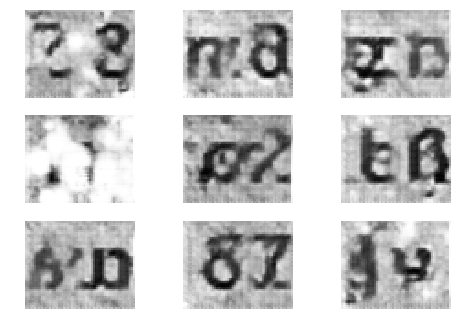

3401 [D loss: 0.529993] [G loss: 1.524943]
3402 [D loss: 0.563227] [G loss: 1.374075]
3403 [D loss: 0.598078] [G loss: 1.631884]
3404 [D loss: 0.411849] [G loss: 1.906983]
3405 [D loss: 0.933442] [G loss: 1.635587]
3406 [D loss: 0.869236] [G loss: 1.447258]
3407 [D loss: 0.669733] [G loss: 1.598799]
3408 [D loss: 0.461818] [G loss: 1.452249]
3409 [D loss: 0.845898] [G loss: 1.407231]
3410 [D loss: 0.736357] [G loss: 1.378772]
3411 [D loss: 0.569062] [G loss: 1.420051]
3412 [D loss: 0.663789] [G loss: 0.885855]
3413 [D loss: 0.587088] [G loss: 1.548279]
3414 [D loss: 0.650269] [G loss: 1.399028]
3415 [D loss: 0.605446] [G loss: 1.542926]
3416 [D loss: 0.602056] [G loss: 1.930126]
3417 [D loss: 0.579235] [G loss: 1.160715]
3418 [D loss: 0.618751] [G loss: 1.295494]
3419 [D loss: 0.527827] [G loss: 1.261655]
3420 [D loss: 0.661653] [G loss: 1.227440]
3421 [D loss: 0.613310] [G loss: 1.833039]
3422 [D loss: 0.515625] [G loss: 1.842458]
3423 [D loss: 0.721573] [G loss: 1.438776]
3424 [D los

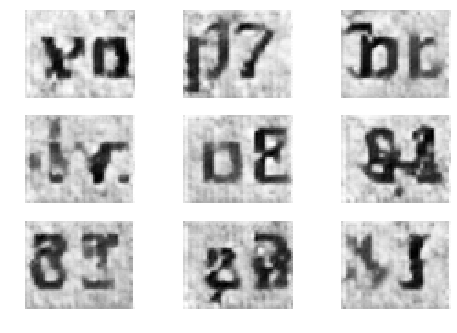

3451 [D loss: 0.541374] [G loss: 1.796261]
3452 [D loss: 0.558760] [G loss: 1.908689]
3453 [D loss: 0.503374] [G loss: 2.017632]
3454 [D loss: 0.690166] [G loss: 1.449751]
3455 [D loss: 0.589269] [G loss: 1.513110]
3456 [D loss: 0.689362] [G loss: 1.447080]
3457 [D loss: 0.591157] [G loss: 1.538007]
3458 [D loss: 0.773989] [G loss: 1.466881]
3459 [D loss: 0.604211] [G loss: 1.541863]
3460 [D loss: 0.821419] [G loss: 1.599326]
3461 [D loss: 0.827624] [G loss: 1.463773]
3462 [D loss: 0.613486] [G loss: 1.525517]
3463 [D loss: 0.421887] [G loss: 1.422602]
3464 [D loss: 0.758454] [G loss: 1.584690]
3465 [D loss: 0.521784] [G loss: 1.554638]
3466 [D loss: 0.599385] [G loss: 1.470213]
3467 [D loss: 0.727620] [G loss: 1.142818]
3468 [D loss: 0.551134] [G loss: 1.624778]
3469 [D loss: 0.564515] [G loss: 1.188990]
3470 [D loss: 0.626589] [G loss: 1.336239]
3471 [D loss: 0.419651] [G loss: 2.060639]
3472 [D loss: 0.691520] [G loss: 1.747642]
3473 [D loss: 0.451963] [G loss: 1.756468]
3474 [D los

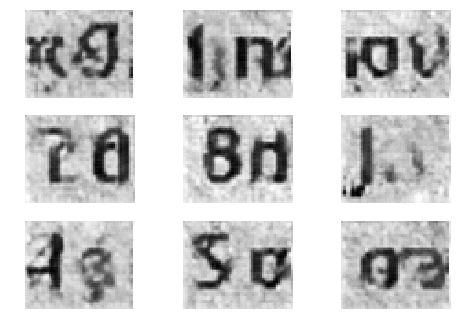

3501 [D loss: 0.585168] [G loss: 1.715976]
3502 [D loss: 0.614887] [G loss: 1.544887]
3503 [D loss: 0.813647] [G loss: 1.496522]
3504 [D loss: 0.655044] [G loss: 1.696409]
3505 [D loss: 0.628112] [G loss: 1.756997]
3506 [D loss: 0.793600] [G loss: 1.382177]
3507 [D loss: 0.711920] [G loss: 1.315388]
3508 [D loss: 0.722842] [G loss: 1.652918]
3509 [D loss: 0.704772] [G loss: 1.634226]
3510 [D loss: 0.598129] [G loss: 1.766166]
3511 [D loss: 0.544578] [G loss: 1.617671]
3512 [D loss: 0.536738] [G loss: 1.652031]
3513 [D loss: 0.742552] [G loss: 1.202218]
3514 [D loss: 0.700556] [G loss: 1.436902]
3515 [D loss: 0.657989] [G loss: 1.299313]
3516 [D loss: 0.685591] [G loss: 1.399383]
3517 [D loss: 0.433159] [G loss: 1.485548]
3518 [D loss: 0.624364] [G loss: 1.615686]
3519 [D loss: 0.673352] [G loss: 1.810510]
3520 [D loss: 0.497011] [G loss: 1.686021]
3521 [D loss: 0.669030] [G loss: 1.447743]
3522 [D loss: 0.573004] [G loss: 1.561933]
3523 [D loss: 0.827594] [G loss: 1.273811]
3524 [D los

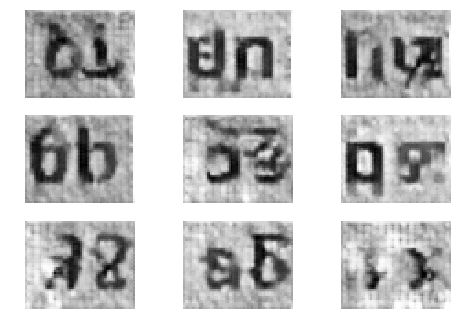

3551 [D loss: 0.680543] [G loss: 1.262571]
3552 [D loss: 0.548518] [G loss: 1.681176]
3553 [D loss: 0.607383] [G loss: 1.461379]
3554 [D loss: 0.521932] [G loss: 1.650831]
3555 [D loss: 0.550585] [G loss: 1.560468]
3556 [D loss: 0.453892] [G loss: 1.719327]
3557 [D loss: 0.724713] [G loss: 1.784541]
3558 [D loss: 0.548170] [G loss: 1.512419]
3559 [D loss: 0.640862] [G loss: 1.680812]
3560 [D loss: 0.673723] [G loss: 1.851432]
3561 [D loss: 0.523202] [G loss: 1.948276]
3562 [D loss: 0.620288] [G loss: 1.566001]
3563 [D loss: 0.685696] [G loss: 1.793560]
3564 [D loss: 0.455934] [G loss: 1.459370]
3565 [D loss: 0.499015] [G loss: 1.820899]
3566 [D loss: 0.708779] [G loss: 1.594064]
3567 [D loss: 0.466567] [G loss: 1.694857]
3568 [D loss: 0.806800] [G loss: 1.730785]
3569 [D loss: 0.782765] [G loss: 1.545431]
3570 [D loss: 0.410892] [G loss: 1.683483]
3571 [D loss: 0.781777] [G loss: 1.687099]
3572 [D loss: 0.431162] [G loss: 1.831304]
3573 [D loss: 0.513769] [G loss: 1.796699]
3574 [D los

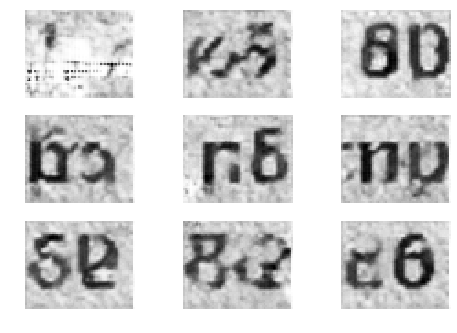

3601 [D loss: 0.631971] [G loss: 1.459183]
3602 [D loss: 0.546145] [G loss: 1.486739]
3603 [D loss: 0.521825] [G loss: 1.631894]
3604 [D loss: 0.594496] [G loss: 1.381773]
3605 [D loss: 0.584142] [G loss: 1.861047]
3606 [D loss: 0.572929] [G loss: 1.699910]
3607 [D loss: 0.590509] [G loss: 1.499853]
3608 [D loss: 0.663783] [G loss: 1.348776]
3609 [D loss: 0.470196] [G loss: 1.343306]
3610 [D loss: 0.515085] [G loss: 1.621452]
3611 [D loss: 0.622180] [G loss: 1.375160]
3612 [D loss: 0.743160] [G loss: 1.623625]
3613 [D loss: 0.614810] [G loss: 1.729722]
3614 [D loss: 0.651923] [G loss: 1.673483]
3615 [D loss: 0.510535] [G loss: 1.320932]
3616 [D loss: 0.779576] [G loss: 1.220442]
3617 [D loss: 0.726081] [G loss: 1.668659]
3618 [D loss: 0.657892] [G loss: 1.637580]
3619 [D loss: 0.578439] [G loss: 1.289605]
3620 [D loss: 0.552358] [G loss: 1.313193]
3621 [D loss: 0.899042] [G loss: 1.566738]
3622 [D loss: 0.644014] [G loss: 1.728205]
3623 [D loss: 0.675613] [G loss: 1.638055]
3624 [D los

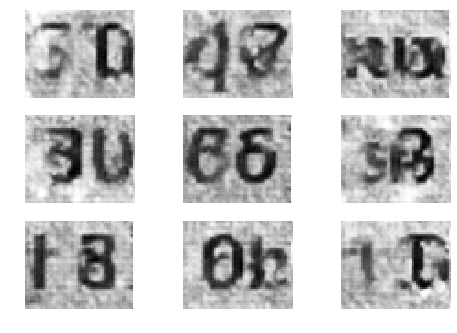

3651 [D loss: 0.595144] [G loss: 1.286292]
3652 [D loss: 0.682082] [G loss: 1.135178]
3653 [D loss: 0.469161] [G loss: 1.650744]
3654 [D loss: 0.553577] [G loss: 1.891688]
3655 [D loss: 0.582553] [G loss: 1.609545]
3656 [D loss: 0.601129] [G loss: 1.334146]
3657 [D loss: 0.616690] [G loss: 1.440347]
3658 [D loss: 0.582125] [G loss: 1.371469]
3659 [D loss: 0.551476] [G loss: 1.635693]
3660 [D loss: 0.399311] [G loss: 1.703846]
3661 [D loss: 0.415611] [G loss: 1.879930]
3662 [D loss: 0.509104] [G loss: 1.538093]
3663 [D loss: 0.626409] [G loss: 1.650509]
3664 [D loss: 0.543651] [G loss: 1.952146]
3665 [D loss: 0.523900] [G loss: 1.567084]
3666 [D loss: 0.479104] [G loss: 2.099636]
3667 [D loss: 0.876053] [G loss: 1.608875]
3668 [D loss: 0.485487] [G loss: 2.002317]
3669 [D loss: 0.366312] [G loss: 1.587801]
3670 [D loss: 0.568222] [G loss: 1.855020]
3671 [D loss: 0.621079] [G loss: 1.391473]
3672 [D loss: 0.651303] [G loss: 1.434776]
3673 [D loss: 0.551280] [G loss: 1.404950]
3674 [D los

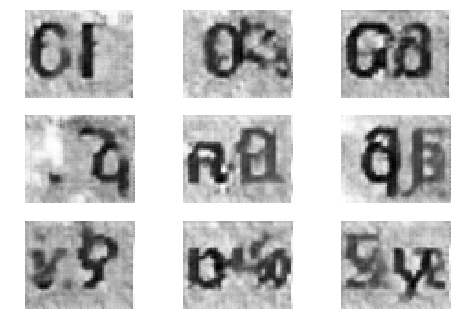

3701 [D loss: 0.429216] [G loss: 1.576089]
3702 [D loss: 0.720941] [G loss: 1.566927]
3703 [D loss: 0.498317] [G loss: 1.763245]
3704 [D loss: 0.608450] [G loss: 1.890491]
3705 [D loss: 0.567599] [G loss: 1.592255]
3706 [D loss: 0.758004] [G loss: 1.256797]
3707 [D loss: 0.429692] [G loss: 1.797260]
3708 [D loss: 0.649621] [G loss: 1.429522]
3709 [D loss: 0.751812] [G loss: 1.561642]
3710 [D loss: 0.606728] [G loss: 1.527183]
3711 [D loss: 0.628489] [G loss: 1.376623]
3712 [D loss: 0.596401] [G loss: 1.811682]
3713 [D loss: 0.634629] [G loss: 1.574044]
3714 [D loss: 0.455184] [G loss: 1.941025]
3715 [D loss: 0.615623] [G loss: 1.732772]
3716 [D loss: 0.727333] [G loss: 1.411025]
3717 [D loss: 0.518743] [G loss: 1.454287]
3718 [D loss: 0.751505] [G loss: 1.436941]
3719 [D loss: 0.519377] [G loss: 1.747600]
3720 [D loss: 0.511581] [G loss: 1.509501]
3721 [D loss: 0.606092] [G loss: 1.486597]
3722 [D loss: 0.737086] [G loss: 1.556227]
3723 [D loss: 0.470158] [G loss: 1.934863]
3724 [D los

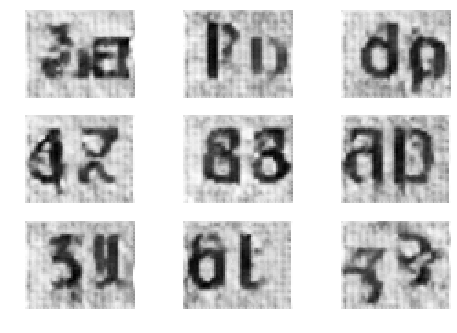

3751 [D loss: 0.518801] [G loss: 1.791844]
3752 [D loss: 0.482163] [G loss: 2.211397]
3753 [D loss: 0.589884] [G loss: 1.973042]
3754 [D loss: 0.622482] [G loss: 2.198546]
3755 [D loss: 0.423676] [G loss: 2.011439]
3756 [D loss: 0.555309] [G loss: 1.795930]
3757 [D loss: 0.505750] [G loss: 1.991955]
3758 [D loss: 0.439651] [G loss: 1.580200]
3759 [D loss: 0.422736] [G loss: 1.933574]
3760 [D loss: 0.353784] [G loss: 2.086785]
3761 [D loss: 0.732018] [G loss: 1.405530]
3762 [D loss: 0.349581] [G loss: 1.973281]
3763 [D loss: 0.481601] [G loss: 1.330473]
3764 [D loss: 0.833657] [G loss: 1.431167]
3765 [D loss: 0.335629] [G loss: 2.098763]
3766 [D loss: 0.536624] [G loss: 1.759908]
3767 [D loss: 0.711352] [G loss: 1.670638]
3768 [D loss: 0.571463] [G loss: 2.238875]
3769 [D loss: 0.531436] [G loss: 1.812222]
3770 [D loss: 0.807467] [G loss: 1.497857]
3771 [D loss: 0.686610] [G loss: 1.461551]
3772 [D loss: 0.415097] [G loss: 2.074627]
3773 [D loss: 0.260483] [G loss: 2.047101]
3774 [D los

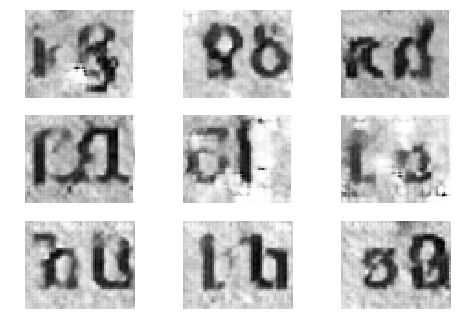

3801 [D loss: 0.677234] [G loss: 1.845292]
3802 [D loss: 0.536458] [G loss: 1.427987]
3803 [D loss: 0.544958] [G loss: 1.476732]
3804 [D loss: 0.812397] [G loss: 1.750969]
3805 [D loss: 0.554066] [G loss: 1.635647]
3806 [D loss: 0.596934] [G loss: 1.547390]
3807 [D loss: 0.695420] [G loss: 1.369457]
3808 [D loss: 0.537435] [G loss: 1.809281]
3809 [D loss: 0.641544] [G loss: 1.489851]
3810 [D loss: 0.638573] [G loss: 1.838964]
3811 [D loss: 0.653489] [G loss: 2.226747]
3812 [D loss: 0.744907] [G loss: 2.307332]
3813 [D loss: 0.664847] [G loss: 1.748585]
3814 [D loss: 0.555444] [G loss: 1.557034]
3815 [D loss: 0.554261] [G loss: 1.848311]
3816 [D loss: 0.658426] [G loss: 1.816269]
3817 [D loss: 0.689674] [G loss: 1.677993]
3818 [D loss: 0.550148] [G loss: 1.805714]
3819 [D loss: 0.552533] [G loss: 1.867558]
3820 [D loss: 0.462067] [G loss: 1.847780]
3821 [D loss: 0.612747] [G loss: 1.819948]
3822 [D loss: 0.402121] [G loss: 1.701984]
3823 [D loss: 0.860306] [G loss: 1.417560]
3824 [D los

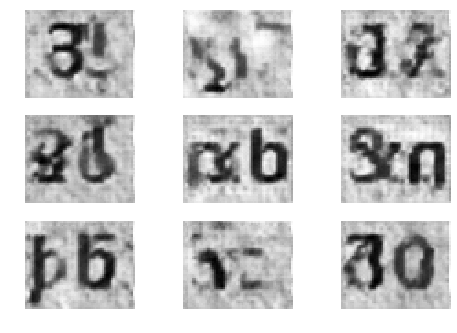

3851 [D loss: 0.739998] [G loss: 1.584440]
3852 [D loss: 0.469930] [G loss: 1.672339]
3853 [D loss: 0.472668] [G loss: 2.093944]
3854 [D loss: 0.626691] [G loss: 1.555974]
3855 [D loss: 0.730553] [G loss: 1.614256]
3856 [D loss: 0.670724] [G loss: 1.513108]
3857 [D loss: 0.257092] [G loss: 1.840579]
3858 [D loss: 0.347396] [G loss: 1.912884]
3859 [D loss: 0.578710] [G loss: 1.261486]
3860 [D loss: 0.434995] [G loss: 1.257966]
3861 [D loss: 0.521939] [G loss: 1.484802]
3862 [D loss: 0.785326] [G loss: 1.717224]
3863 [D loss: 0.465199] [G loss: 1.947715]
3864 [D loss: 0.776133] [G loss: 1.829998]
3865 [D loss: 0.520790] [G loss: 1.948921]
3866 [D loss: 0.722591] [G loss: 1.738683]
3867 [D loss: 0.362163] [G loss: 2.312002]
3868 [D loss: 0.838111] [G loss: 1.750571]
3869 [D loss: 0.649545] [G loss: 1.694046]
3870 [D loss: 0.315504] [G loss: 1.680476]
3871 [D loss: 0.310942] [G loss: 1.741308]
3872 [D loss: 0.419470] [G loss: 2.592524]
3873 [D loss: 0.837023] [G loss: 1.771869]
3874 [D los

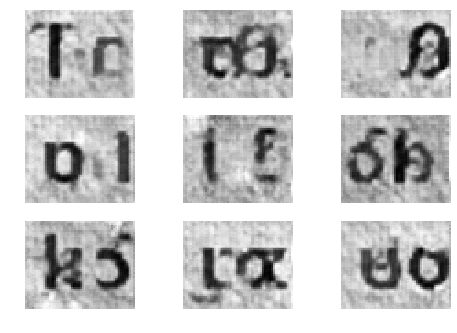

3901 [D loss: 0.674687] [G loss: 1.760260]
3902 [D loss: 0.729929] [G loss: 1.705778]
3903 [D loss: 0.611081] [G loss: 1.430972]
3904 [D loss: 0.863921] [G loss: 1.399924]
3905 [D loss: 0.690396] [G loss: 1.468836]
3906 [D loss: 0.514033] [G loss: 1.961877]
3907 [D loss: 0.623031] [G loss: 2.048103]
3908 [D loss: 0.589191] [G loss: 1.530984]
3909 [D loss: 0.685609] [G loss: 1.558315]
3910 [D loss: 0.366699] [G loss: 1.610910]
3911 [D loss: 0.623133] [G loss: 1.883394]
3912 [D loss: 0.757944] [G loss: 1.736836]
3913 [D loss: 0.722793] [G loss: 1.914817]
3914 [D loss: 0.771550] [G loss: 1.423531]
3915 [D loss: 0.553900] [G loss: 1.957052]
3916 [D loss: 0.407811] [G loss: 1.781350]
3917 [D loss: 0.692280] [G loss: 1.475769]
3918 [D loss: 0.495032] [G loss: 1.622934]
3919 [D loss: 0.505859] [G loss: 2.258235]
3920 [D loss: 0.668812] [G loss: 1.493476]
3921 [D loss: 0.477518] [G loss: 1.611984]
3922 [D loss: 0.525967] [G loss: 1.836632]
3923 [D loss: 0.485433] [G loss: 1.899740]
3924 [D los

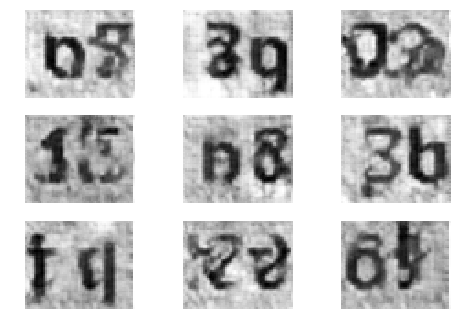

3951 [D loss: 0.799898] [G loss: 1.503105]
3952 [D loss: 0.652731] [G loss: 1.574318]
3953 [D loss: 0.650805] [G loss: 1.532071]
3954 [D loss: 0.557112] [G loss: 1.800471]
3955 [D loss: 0.713211] [G loss: 1.703931]
3956 [D loss: 0.459183] [G loss: 1.719536]
3957 [D loss: 0.724838] [G loss: 1.705551]
3958 [D loss: 0.410088] [G loss: 1.895799]
3959 [D loss: 0.329896] [G loss: 2.047130]
3960 [D loss: 0.741234] [G loss: 1.933934]
3961 [D loss: 0.393259] [G loss: 1.843653]
3962 [D loss: 0.690564] [G loss: 1.545673]
3963 [D loss: 0.762647] [G loss: 1.508120]
3964 [D loss: 0.465777] [G loss: 1.333493]
3965 [D loss: 0.467143] [G loss: 1.510461]
3966 [D loss: 0.627434] [G loss: 1.761770]
3967 [D loss: 0.507328] [G loss: 1.574863]
3968 [D loss: 0.603369] [G loss: 1.470644]
3969 [D loss: 0.607784] [G loss: 1.574496]
3970 [D loss: 0.486699] [G loss: 1.875922]
3971 [D loss: 0.616151] [G loss: 1.602827]
3972 [D loss: 0.524244] [G loss: 1.315577]
3973 [D loss: 0.607989] [G loss: 1.574169]
3974 [D los

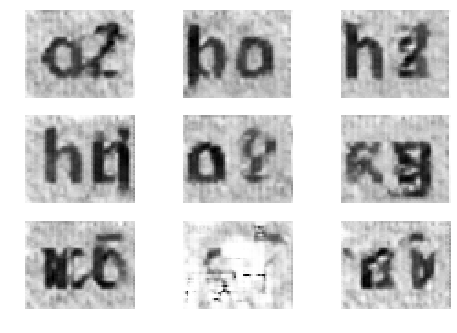

4001 [D loss: 0.502062] [G loss: 1.567407]
4002 [D loss: 0.599606] [G loss: 1.662211]
4003 [D loss: 0.565402] [G loss: 1.748613]
4004 [D loss: 0.513605] [G loss: 2.091778]
4005 [D loss: 0.516221] [G loss: 1.549060]
4006 [D loss: 0.743778] [G loss: 1.913208]
4007 [D loss: 0.513133] [G loss: 1.986617]
4008 [D loss: 0.549271] [G loss: 1.434480]
4009 [D loss: 0.550853] [G loss: 1.609479]
4010 [D loss: 0.456556] [G loss: 1.743537]
4011 [D loss: 0.582587] [G loss: 1.748486]
4012 [D loss: 0.649864] [G loss: 1.535973]
4013 [D loss: 0.585833] [G loss: 1.625096]
4014 [D loss: 0.555503] [G loss: 1.437366]
4015 [D loss: 0.511142] [G loss: 1.722410]
4016 [D loss: 0.544555] [G loss: 1.437669]
4017 [D loss: 0.607677] [G loss: 1.814046]
4018 [D loss: 0.570540] [G loss: 1.827545]
4019 [D loss: 0.630908] [G loss: 1.921968]
4020 [D loss: 0.615802] [G loss: 2.012663]
4021 [D loss: 0.512578] [G loss: 1.585740]
4022 [D loss: 0.613544] [G loss: 1.573309]
4023 [D loss: 0.537894] [G loss: 1.486245]
4024 [D los

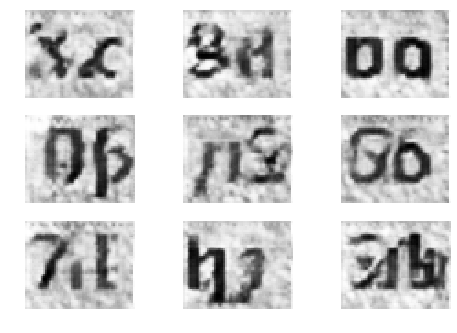

4051 [D loss: 0.595069] [G loss: 1.655369]
4052 [D loss: 0.279448] [G loss: 1.833425]
4053 [D loss: 0.609500] [G loss: 1.886697]
4054 [D loss: 0.466139] [G loss: 1.977438]
4055 [D loss: 0.665851] [G loss: 1.879133]
4056 [D loss: 0.540668] [G loss: 1.557048]
4057 [D loss: 0.627622] [G loss: 1.612993]
4058 [D loss: 0.549392] [G loss: 1.679172]
4059 [D loss: 0.672465] [G loss: 1.646718]
4060 [D loss: 0.449516] [G loss: 1.635508]
4061 [D loss: 0.664012] [G loss: 1.661870]
4062 [D loss: 0.428878] [G loss: 1.791628]
4063 [D loss: 0.655927] [G loss: 2.067798]
4064 [D loss: 0.593314] [G loss: 1.698521]
4065 [D loss: 0.665283] [G loss: 1.648722]
4066 [D loss: 0.487531] [G loss: 2.251233]
4067 [D loss: 0.411504] [G loss: 2.260766]
4068 [D loss: 0.585438] [G loss: 1.857919]
4069 [D loss: 0.542288] [G loss: 1.713282]
4070 [D loss: 0.619183] [G loss: 1.554486]
4071 [D loss: 0.453811] [G loss: 1.522598]
4072 [D loss: 0.645086] [G loss: 1.536990]
4073 [D loss: 0.435476] [G loss: 1.765975]
4074 [D los

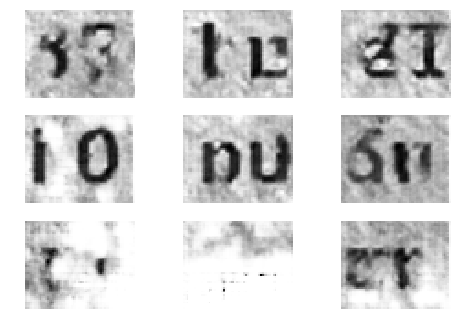

4101 [D loss: 0.684256] [G loss: 1.752869]
4102 [D loss: 0.505183] [G loss: 1.894688]
4103 [D loss: 0.753861] [G loss: 1.638138]
4104 [D loss: 0.433490] [G loss: 1.622584]
4105 [D loss: 0.530300] [G loss: 2.009637]
4106 [D loss: 0.505297] [G loss: 1.921173]
4107 [D loss: 0.579014] [G loss: 1.626505]
4108 [D loss: 0.457670] [G loss: 1.718811]
4109 [D loss: 0.730172] [G loss: 1.088275]
4110 [D loss: 0.715540] [G loss: 1.504926]
4111 [D loss: 0.506943] [G loss: 1.758268]
4112 [D loss: 0.653215] [G loss: 1.697323]
4113 [D loss: 0.545502] [G loss: 1.795668]
4114 [D loss: 0.527203] [G loss: 1.721534]
4115 [D loss: 0.445999] [G loss: 1.978515]
4116 [D loss: 0.657561] [G loss: 1.894928]
4117 [D loss: 0.404076] [G loss: 2.078929]
4118 [D loss: 0.482500] [G loss: 1.892860]
4119 [D loss: 0.395525] [G loss: 1.783965]
4120 [D loss: 0.708541] [G loss: 1.674708]
4121 [D loss: 0.505534] [G loss: 2.058693]
4122 [D loss: 0.441171] [G loss: 2.247130]
4123 [D loss: 0.550579] [G loss: 1.611180]
4124 [D los

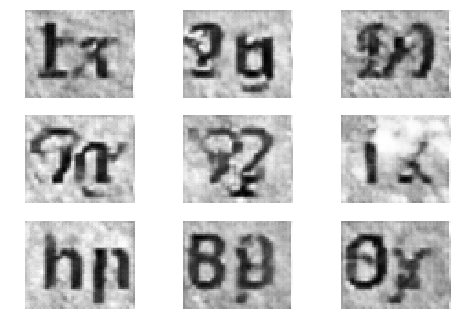

4151 [D loss: 0.371328] [G loss: 2.377614]
4152 [D loss: 0.552371] [G loss: 1.683174]
4153 [D loss: 0.384334] [G loss: 1.965111]
4154 [D loss: 0.241966] [G loss: 2.665701]
4155 [D loss: 0.560646] [G loss: 1.985803]
4156 [D loss: 0.342974] [G loss: 2.157406]
4157 [D loss: 0.773071] [G loss: 1.813797]
4158 [D loss: 0.602429] [G loss: 1.496832]
4159 [D loss: 0.282681] [G loss: 1.823191]
4160 [D loss: 0.629052] [G loss: 1.618840]
4161 [D loss: 0.338547] [G loss: 2.074188]
4162 [D loss: 0.740547] [G loss: 1.839436]
4163 [D loss: 0.236535] [G loss: 1.995126]
4164 [D loss: 0.715906] [G loss: 1.942776]
4165 [D loss: 0.427939] [G loss: 1.709348]
4166 [D loss: 0.749852] [G loss: 1.685231]
4167 [D loss: 0.309908] [G loss: 1.842602]
4168 [D loss: 0.213821] [G loss: 2.352057]
4169 [D loss: 0.770391] [G loss: 1.728419]
4170 [D loss: 0.480135] [G loss: 1.786583]
4171 [D loss: 0.626455] [G loss: 2.174985]
4172 [D loss: 0.299548] [G loss: 2.163889]
4173 [D loss: 0.659115] [G loss: 1.854991]
4174 [D los

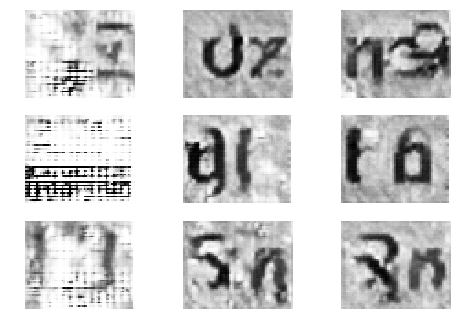

4201 [D loss: 0.426273] [G loss: 1.772255]
4202 [D loss: 0.572522] [G loss: 1.684277]
4203 [D loss: 0.686340] [G loss: 1.427410]
4204 [D loss: 0.722652] [G loss: 1.503685]
4205 [D loss: 0.584605] [G loss: 1.713690]
4206 [D loss: 0.513610] [G loss: 1.552201]
4207 [D loss: 0.533129] [G loss: 1.886928]
4208 [D loss: 0.659292] [G loss: 1.330585]
4209 [D loss: 0.516265] [G loss: 2.248856]
4210 [D loss: 0.657574] [G loss: 1.941685]
4211 [D loss: 0.379496] [G loss: 1.922348]
4212 [D loss: 0.493860] [G loss: 1.724898]
4213 [D loss: 0.645140] [G loss: 1.603260]
4214 [D loss: 0.474907] [G loss: 2.039634]
4215 [D loss: 0.585503] [G loss: 1.489015]
4216 [D loss: 0.635074] [G loss: 1.993956]
4217 [D loss: 0.583057] [G loss: 1.872717]
4218 [D loss: 0.573616] [G loss: 1.697445]
4219 [D loss: 0.465943] [G loss: 1.422316]
4220 [D loss: 0.384172] [G loss: 2.004822]
4221 [D loss: 0.431467] [G loss: 2.003231]
4222 [D loss: 0.678509] [G loss: 1.716914]
4223 [D loss: 0.547336] [G loss: 1.690149]
4224 [D los

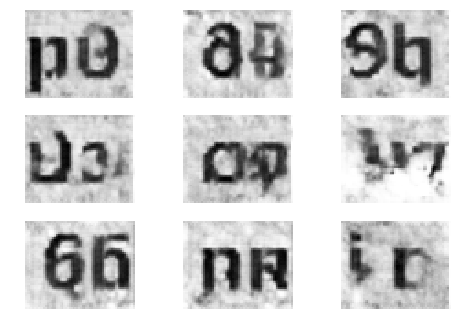

4251 [D loss: 0.355243] [G loss: 1.928717]
4252 [D loss: 0.717266] [G loss: 1.357605]
4253 [D loss: 0.505488] [G loss: 1.865623]
4254 [D loss: 0.576512] [G loss: 1.790664]
4255 [D loss: 0.307963] [G loss: 2.163509]
4256 [D loss: 0.641106] [G loss: 2.017139]
4257 [D loss: 0.342762] [G loss: 1.802647]
4258 [D loss: 0.279212] [G loss: 2.282679]
4259 [D loss: 0.379570] [G loss: 1.948081]
4260 [D loss: 0.477930] [G loss: 1.701744]
4261 [D loss: 0.614089] [G loss: 1.246322]
4262 [D loss: 0.659540] [G loss: 1.710268]
4263 [D loss: 0.458938] [G loss: 1.807997]
4264 [D loss: 0.342454] [G loss: 2.832760]
4265 [D loss: 0.741766] [G loss: 1.710611]
4266 [D loss: 0.334377] [G loss: 2.496989]
4267 [D loss: 0.201427] [G loss: 2.142966]
4268 [D loss: 0.692473] [G loss: 1.885876]
4269 [D loss: 0.641973] [G loss: 1.923062]
4270 [D loss: 0.627752] [G loss: 1.808197]
4271 [D loss: 0.576350] [G loss: 1.836916]
4272 [D loss: 0.323097] [G loss: 2.234294]
4273 [D loss: 0.520833] [G loss: 2.193160]
4274 [D los

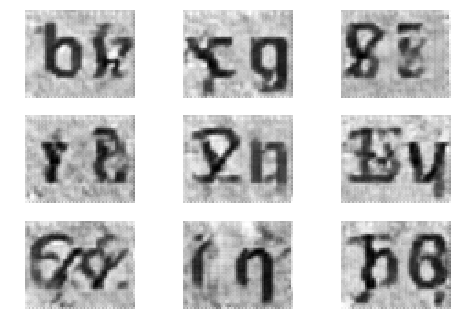

4301 [D loss: 0.364569] [G loss: 1.703385]
4302 [D loss: 0.508330] [G loss: 2.105210]
4303 [D loss: 0.366048] [G loss: 1.641409]
4304 [D loss: 0.502704] [G loss: 2.267156]
4305 [D loss: 0.609595] [G loss: 1.915943]
4306 [D loss: 0.477641] [G loss: 1.365679]
4307 [D loss: 0.451285] [G loss: 1.816782]
4308 [D loss: 0.429827] [G loss: 2.059500]
4309 [D loss: 0.666562] [G loss: 1.733576]
4310 [D loss: 0.567150] [G loss: 1.734455]
4311 [D loss: 0.566721] [G loss: 1.830689]
4312 [D loss: 0.473936] [G loss: 2.345655]
4313 [D loss: 0.826252] [G loss: 1.887970]
4314 [D loss: 0.623163] [G loss: 1.651697]
4315 [D loss: 0.504146] [G loss: 1.946354]
4316 [D loss: 0.390512] [G loss: 2.012963]
4317 [D loss: 0.586431] [G loss: 1.829611]
4318 [D loss: 0.654078] [G loss: 1.690764]
4319 [D loss: 0.565519] [G loss: 1.787672]
4320 [D loss: 0.578407] [G loss: 1.671563]
4321 [D loss: 0.685466] [G loss: 1.810238]
4322 [D loss: 0.409714] [G loss: 1.945986]
4323 [D loss: 0.639443] [G loss: 1.610291]
4324 [D los

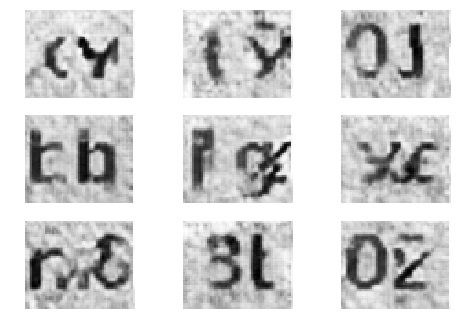

4351 [D loss: 0.368168] [G loss: 2.224920]
4352 [D loss: 0.705878] [G loss: 1.505709]
4353 [D loss: 0.599010] [G loss: 1.477138]
4354 [D loss: 0.377028] [G loss: 2.066147]
4355 [D loss: 0.515249] [G loss: 2.159671]
4356 [D loss: 0.558212] [G loss: 1.805740]
4357 [D loss: 0.274605] [G loss: 1.867163]
4358 [D loss: 0.555473] [G loss: 1.746276]
4359 [D loss: 0.532378] [G loss: 1.735594]
4360 [D loss: 0.687391] [G loss: 1.281344]
4361 [D loss: 0.375457] [G loss: 2.179715]
4362 [D loss: 0.224298] [G loss: 2.398995]
4363 [D loss: 0.635198] [G loss: 2.037949]
4364 [D loss: 0.575721] [G loss: 1.305012]
4365 [D loss: 0.348931] [G loss: 1.919378]
4366 [D loss: 0.455463] [G loss: 1.951467]
4367 [D loss: 0.436808] [G loss: 2.366129]
4368 [D loss: 0.529777] [G loss: 2.457541]
4369 [D loss: 0.427319] [G loss: 1.748253]
4370 [D loss: 0.640380] [G loss: 1.622865]
4371 [D loss: 0.712207] [G loss: 1.525399]
4372 [D loss: 0.785956] [G loss: 1.944769]
4373 [D loss: 0.475721] [G loss: 1.938683]
4374 [D los

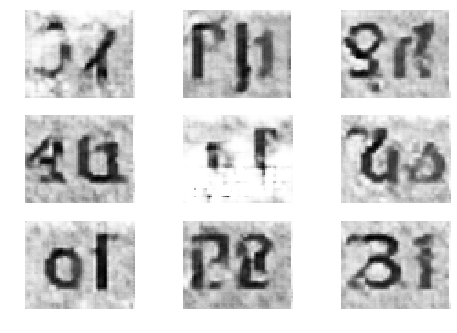

4401 [D loss: 0.603072] [G loss: 1.720721]
4402 [D loss: 0.524274] [G loss: 1.865510]
4403 [D loss: 0.639997] [G loss: 1.515037]
4404 [D loss: 0.584301] [G loss: 1.849934]
4405 [D loss: 0.436647] [G loss: 1.646633]
4406 [D loss: 0.486152] [G loss: 2.210218]
4407 [D loss: 0.468275] [G loss: 2.228079]
4408 [D loss: 0.499033] [G loss: 1.960795]
4409 [D loss: 0.463647] [G loss: 1.971295]
4410 [D loss: 0.501351] [G loss: 1.777277]
4411 [D loss: 0.505121] [G loss: 2.099263]
4412 [D loss: 0.503560] [G loss: 1.892483]
4413 [D loss: 0.550780] [G loss: 1.855332]
4414 [D loss: 0.519996] [G loss: 1.492297]
4415 [D loss: 0.617994] [G loss: 1.911026]
4416 [D loss: 0.671030] [G loss: 1.886251]
4417 [D loss: 0.525195] [G loss: 1.960684]
4418 [D loss: 0.672935] [G loss: 1.600694]
4419 [D loss: 0.522860] [G loss: 1.816407]
4420 [D loss: 0.683444] [G loss: 2.008347]
4421 [D loss: 0.405653] [G loss: 2.193363]
4422 [D loss: 0.517005] [G loss: 1.992182]
4423 [D loss: 0.508638] [G loss: 1.971955]
4424 [D los

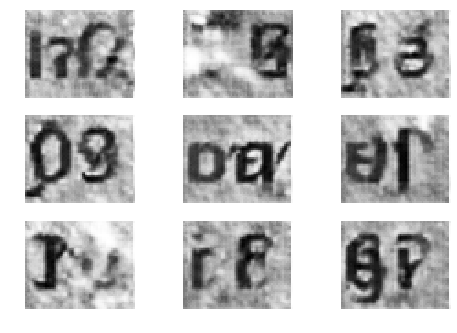

4451 [D loss: 0.631048] [G loss: 1.434147]
4452 [D loss: 0.506224] [G loss: 2.396806]
4453 [D loss: 0.647344] [G loss: 1.717486]
4454 [D loss: 0.277235] [G loss: 2.023285]
4455 [D loss: 0.538791] [G loss: 1.853807]
4456 [D loss: 0.342540] [G loss: 2.700231]
4457 [D loss: 0.671374] [G loss: 1.850994]
4458 [D loss: 0.602049] [G loss: 2.037605]
4459 [D loss: 0.408650] [G loss: 2.060731]
4460 [D loss: 0.248096] [G loss: 2.487243]
4461 [D loss: 0.300961] [G loss: 2.559135]
4462 [D loss: 0.911964] [G loss: 1.712828]
4463 [D loss: 0.358646] [G loss: 1.616589]
4464 [D loss: 0.316426] [G loss: 2.733085]
4465 [D loss: 0.749905] [G loss: 1.947513]
4466 [D loss: 0.260121] [G loss: 2.426919]
4467 [D loss: 0.295680] [G loss: 2.345745]
4468 [D loss: 0.676635] [G loss: 2.202196]
4469 [D loss: 0.208184] [G loss: 2.062522]
4470 [D loss: 0.192554] [G loss: 2.640177]
4471 [D loss: 0.865472] [G loss: 1.776263]
4472 [D loss: 0.834901] [G loss: 2.026790]
4473 [D loss: 0.462964] [G loss: 1.961515]
4474 [D los

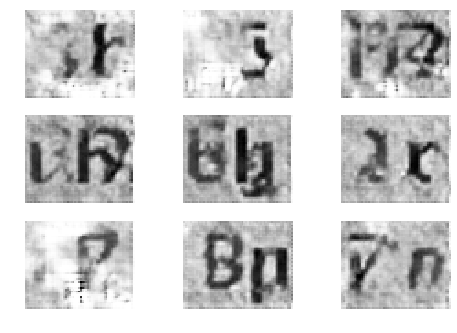

4501 [D loss: 0.593001] [G loss: 1.648106]
4502 [D loss: 0.536906] [G loss: 2.009602]
4503 [D loss: 0.491424] [G loss: 1.928514]
4504 [D loss: 0.511172] [G loss: 1.806938]
4505 [D loss: 0.645974] [G loss: 1.737897]
4506 [D loss: 0.541453] [G loss: 2.031602]
4507 [D loss: 0.462482] [G loss: 1.648442]
4508 [D loss: 0.727509] [G loss: 1.783656]
4509 [D loss: 0.663666] [G loss: 1.665052]
4510 [D loss: 0.520726] [G loss: 1.827960]
4511 [D loss: 0.583548] [G loss: 1.792940]
4512 [D loss: 0.563143] [G loss: 2.329985]
4513 [D loss: 0.651125] [G loss: 1.948047]
4514 [D loss: 0.771208] [G loss: 2.013529]
4515 [D loss: 0.478626] [G loss: 2.283179]
4516 [D loss: 0.554529] [G loss: 1.730776]
4517 [D loss: 0.577237] [G loss: 2.076696]
4518 [D loss: 0.552936] [G loss: 1.931779]
4519 [D loss: 0.668458] [G loss: 1.612154]
4520 [D loss: 0.721222] [G loss: 1.597074]
4521 [D loss: 0.475426] [G loss: 2.316324]
4522 [D loss: 0.647496] [G loss: 1.680190]
4523 [D loss: 0.621294] [G loss: 1.830334]
4524 [D los

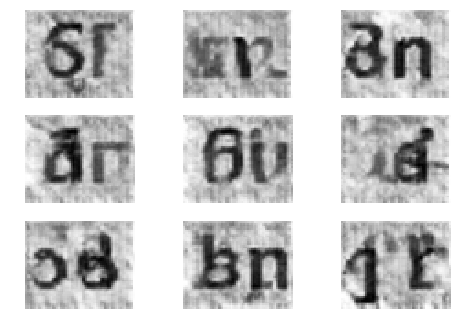

4551 [D loss: 0.537567] [G loss: 2.005422]
4552 [D loss: 0.619226] [G loss: 1.737795]
4553 [D loss: 0.511285] [G loss: 1.783264]
4554 [D loss: 0.444460] [G loss: 1.883153]
4555 [D loss: 0.678332] [G loss: 1.643276]
4556 [D loss: 0.646311] [G loss: 1.306702]
4557 [D loss: 0.448363] [G loss: 1.928703]
4558 [D loss: 0.692282] [G loss: 2.157905]
4559 [D loss: 0.558613] [G loss: 1.597200]
4560 [D loss: 0.626145] [G loss: 1.625064]
4561 [D loss: 0.485570] [G loss: 1.758120]
4562 [D loss: 0.431437] [G loss: 2.013132]
4563 [D loss: 0.660655] [G loss: 1.668391]
4564 [D loss: 0.435099] [G loss: 1.697183]
4565 [D loss: 0.521838] [G loss: 2.317551]
4566 [D loss: 0.301066] [G loss: 2.365921]
4567 [D loss: 0.776379] [G loss: 1.649773]
4568 [D loss: 0.375289] [G loss: 2.097425]
4569 [D loss: 0.280242] [G loss: 2.377663]
4570 [D loss: 0.514262] [G loss: 1.889216]
4571 [D loss: 0.460744] [G loss: 1.662066]
4572 [D loss: 0.330846] [G loss: 1.911690]
4573 [D loss: 0.344100] [G loss: 1.901065]
4574 [D los

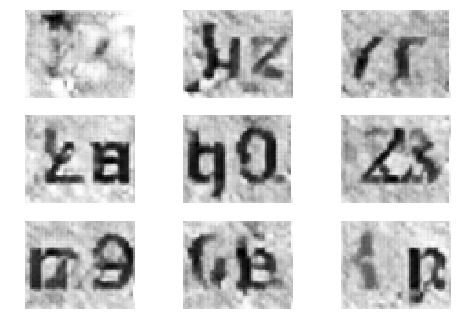

4601 [D loss: 0.656449] [G loss: 1.990677]
4602 [D loss: 0.555606] [G loss: 1.729274]
4603 [D loss: 0.635226] [G loss: 1.847976]
4604 [D loss: 0.608818] [G loss: 1.807494]
4605 [D loss: 0.588850] [G loss: 1.634354]
4606 [D loss: 0.333232] [G loss: 2.092132]
4607 [D loss: 0.549365] [G loss: 1.903743]
4608 [D loss: 0.323375] [G loss: 2.045177]
4609 [D loss: 0.275181] [G loss: 2.017564]
4610 [D loss: 0.289034] [G loss: 2.494904]
4611 [D loss: 0.561711] [G loss: 1.796434]
4612 [D loss: 0.551376] [G loss: 2.026721]
4613 [D loss: 0.414061] [G loss: 1.822465]
4614 [D loss: 0.449856] [G loss: 2.080479]
4615 [D loss: 0.547188] [G loss: 2.312075]
4616 [D loss: 0.712609] [G loss: 1.990705]
4617 [D loss: 0.307376] [G loss: 2.560357]
4618 [D loss: 0.525105] [G loss: 2.241972]
4619 [D loss: 0.611382] [G loss: 2.268841]
4620 [D loss: 0.655743] [G loss: 1.589390]
4621 [D loss: 0.580255] [G loss: 1.666315]
4622 [D loss: 0.278490] [G loss: 1.945937]
4623 [D loss: 0.306399] [G loss: 2.347036]
4624 [D los

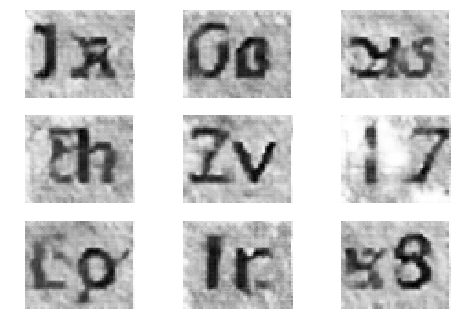

4651 [D loss: 0.263360] [G loss: 2.785663]
4652 [D loss: 0.613065] [G loss: 2.111546]
4653 [D loss: 0.594197] [G loss: 1.718806]
4654 [D loss: 0.484244] [G loss: 1.740978]
4655 [D loss: 0.646318] [G loss: 1.304760]
4656 [D loss: 0.297440] [G loss: 2.454556]
4657 [D loss: 0.534269] [G loss: 1.992439]
4658 [D loss: 0.586972] [G loss: 1.683197]
4659 [D loss: 0.762839] [G loss: 1.503230]
4660 [D loss: 0.367871] [G loss: 1.925971]
4661 [D loss: 0.600928] [G loss: 2.251837]
4662 [D loss: 0.286693] [G loss: 3.043365]
4663 [D loss: 0.598171] [G loss: 1.545270]
4664 [D loss: 0.226026] [G loss: 2.409374]
4665 [D loss: 0.622194] [G loss: 1.902622]
4666 [D loss: 0.556877] [G loss: 1.749767]
4667 [D loss: 0.960049] [G loss: 1.151920]
4668 [D loss: 0.357891] [G loss: 1.860514]
4669 [D loss: 1.022028] [G loss: 1.302994]
4670 [D loss: 0.918123] [G loss: 1.531335]
4671 [D loss: 0.412524] [G loss: 1.652277]
4672 [D loss: 0.666865] [G loss: 2.545970]
4673 [D loss: 0.516287] [G loss: 1.776144]
4674 [D los

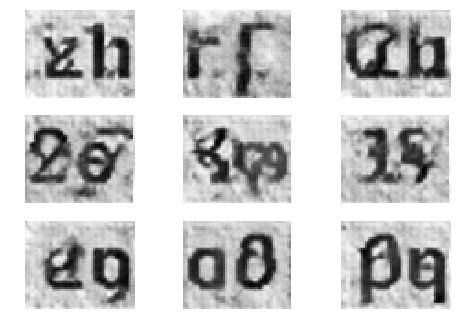

4701 [D loss: 0.530762] [G loss: 1.871993]
4702 [D loss: 0.785228] [G loss: 1.514498]
4703 [D loss: 0.306894] [G loss: 1.938665]
4704 [D loss: 0.549955] [G loss: 1.737467]
4705 [D loss: 0.773737] [G loss: 1.849258]
4706 [D loss: 0.606384] [G loss: 2.381820]
4707 [D loss: 0.463627] [G loss: 2.105779]
4708 [D loss: 0.353534] [G loss: 1.679987]
4709 [D loss: 0.707253] [G loss: 1.761659]
4710 [D loss: 0.472621] [G loss: 1.897818]
4711 [D loss: 0.521975] [G loss: 1.793143]
4712 [D loss: 0.488783] [G loss: 2.034963]
4713 [D loss: 0.576893] [G loss: 1.565845]
4714 [D loss: 0.628936] [G loss: 1.785642]
4715 [D loss: 0.615201] [G loss: 1.665502]
4716 [D loss: 0.438271] [G loss: 2.096150]
4717 [D loss: 0.599902] [G loss: 2.026401]
4718 [D loss: 0.675885] [G loss: 2.017598]
4719 [D loss: 0.566326] [G loss: 1.607613]
4720 [D loss: 0.624728] [G loss: 2.212348]
4721 [D loss: 0.495989] [G loss: 2.021476]
4722 [D loss: 0.694308] [G loss: 1.146949]
4723 [D loss: 0.383467] [G loss: 2.337792]
4724 [D los

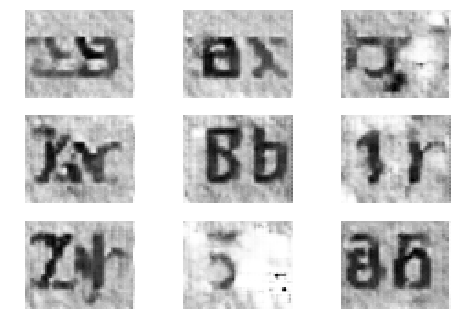

4751 [D loss: 0.712235] [G loss: 1.624552]
4752 [D loss: 0.444745] [G loss: 1.719947]
4753 [D loss: 0.507390] [G loss: 1.737319]
4754 [D loss: 0.616839] [G loss: 2.052919]
4755 [D loss: 0.464654] [G loss: 2.439537]
4756 [D loss: 0.576078] [G loss: 2.221372]
4757 [D loss: 0.521345] [G loss: 2.267143]
4758 [D loss: 0.554209] [G loss: 1.828159]
4759 [D loss: 0.568406] [G loss: 2.002359]
4760 [D loss: 0.678907] [G loss: 1.782359]
4761 [D loss: 0.688192] [G loss: 1.775927]
4762 [D loss: 0.645677] [G loss: 1.610566]
4763 [D loss: 0.553405] [G loss: 2.068980]
4764 [D loss: 0.390292] [G loss: 2.082617]
4765 [D loss: 0.489979] [G loss: 1.779980]
4766 [D loss: 0.762919] [G loss: 1.473044]
4767 [D loss: 0.483939] [G loss: 1.884524]
4768 [D loss: 0.511223] [G loss: 1.419611]
4769 [D loss: 0.355420] [G loss: 2.282108]
4770 [D loss: 0.757146] [G loss: 1.907283]
4771 [D loss: 0.471313] [G loss: 1.869343]
4772 [D loss: 0.741206] [G loss: 1.876835]
4773 [D loss: 0.574710] [G loss: 1.807602]
4774 [D los

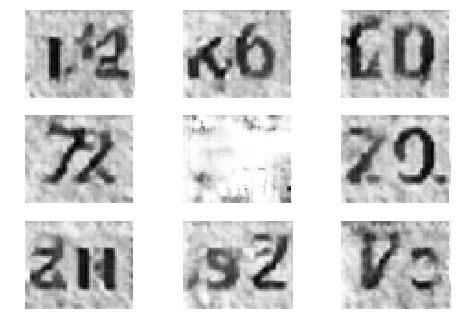

4801 [D loss: 0.529226] [G loss: 2.128702]
4802 [D loss: 0.731235] [G loss: 2.148194]
4803 [D loss: 0.524992] [G loss: 2.305519]
4804 [D loss: 0.563170] [G loss: 1.753932]
4805 [D loss: 0.685120] [G loss: 1.232039]
4806 [D loss: 0.478180] [G loss: 1.528889]
4807 [D loss: 0.400670] [G loss: 1.869963]
4808 [D loss: 0.694092] [G loss: 1.864637]
4809 [D loss: 0.600534] [G loss: 2.073067]
4810 [D loss: 0.573094] [G loss: 2.315572]
4811 [D loss: 0.629195] [G loss: 1.930727]
4812 [D loss: 0.379119] [G loss: 2.290309]
4813 [D loss: 0.521698] [G loss: 2.166998]
4814 [D loss: 0.482217] [G loss: 1.840786]
4815 [D loss: 0.449122] [G loss: 1.801982]
4816 [D loss: 0.606448] [G loss: 1.821243]
4817 [D loss: 0.689391] [G loss: 1.905968]
4818 [D loss: 0.652938] [G loss: 2.305426]
4819 [D loss: 0.564913] [G loss: 2.061412]
4820 [D loss: 0.440018] [G loss: 2.159546]
4821 [D loss: 0.375172] [G loss: 2.402535]
4822 [D loss: 0.619822] [G loss: 1.766384]
4823 [D loss: 0.580482] [G loss: 1.970087]
4824 [D los

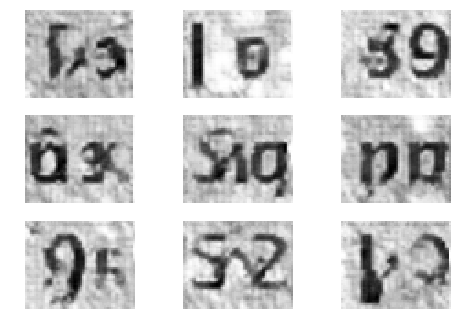

4851 [D loss: 0.603832] [G loss: 1.668075]
4852 [D loss: 0.433202] [G loss: 1.957221]
4853 [D loss: 0.226217] [G loss: 2.482059]
4854 [D loss: 0.730557] [G loss: 1.627581]
4855 [D loss: 0.324868] [G loss: 2.399332]
4856 [D loss: 0.192264] [G loss: 3.163595]
4857 [D loss: 0.759170] [G loss: 1.810745]
4858 [D loss: 0.537163] [G loss: 1.879926]
4859 [D loss: 0.520619] [G loss: 1.761654]
4860 [D loss: 0.572419] [G loss: 1.995827]
4861 [D loss: 0.258555] [G loss: 1.909602]
4862 [D loss: 0.559604] [G loss: 1.996837]
4863 [D loss: 0.568693] [G loss: 2.134647]
4864 [D loss: 0.292050] [G loss: 2.035113]
4865 [D loss: 0.206315] [G loss: 2.757564]
4866 [D loss: 0.237615] [G loss: 2.796964]
4867 [D loss: 0.661054] [G loss: 2.159016]
4868 [D loss: 0.599979] [G loss: 1.740339]
4869 [D loss: 0.516955] [G loss: 2.209545]
4870 [D loss: 0.300571] [G loss: 2.152193]
4871 [D loss: 0.643986] [G loss: 1.965807]
4872 [D loss: 0.328875] [G loss: 1.985342]
4873 [D loss: 0.701187] [G loss: 1.765086]
4874 [D los

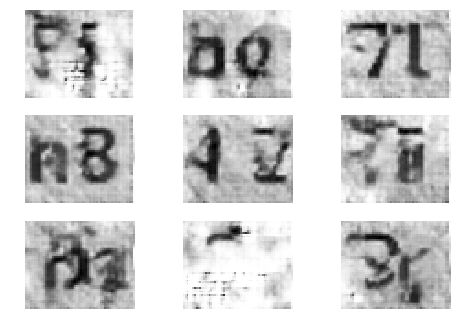

4901 [D loss: 0.650079] [G loss: 2.160589]
4902 [D loss: 0.482903] [G loss: 2.401703]
4903 [D loss: 0.522296] [G loss: 1.763849]
4904 [D loss: 0.468088] [G loss: 1.779176]
4905 [D loss: 0.479951] [G loss: 2.338161]
4906 [D loss: 0.346831] [G loss: 2.108654]
4907 [D loss: 0.690065] [G loss: 2.294155]
4908 [D loss: 0.529433] [G loss: 2.071393]
4909 [D loss: 0.472005] [G loss: 2.090367]
4910 [D loss: 0.522676] [G loss: 1.940676]
4911 [D loss: 0.605217] [G loss: 1.983273]
4912 [D loss: 0.634513] [G loss: 2.239476]
4913 [D loss: 0.542479] [G loss: 1.867616]
4914 [D loss: 0.631637] [G loss: 1.972240]
4915 [D loss: 0.587346] [G loss: 2.292233]
4916 [D loss: 0.410766] [G loss: 2.654010]
4917 [D loss: 0.499909] [G loss: 2.167076]
4918 [D loss: 0.579516] [G loss: 1.340612]
4919 [D loss: 0.535758] [G loss: 1.928764]
4920 [D loss: 0.454992] [G loss: 1.893328]
4921 [D loss: 0.495947] [G loss: 1.715843]
4922 [D loss: 0.576664] [G loss: 2.166398]
4923 [D loss: 0.598392] [G loss: 2.015545]
4924 [D los

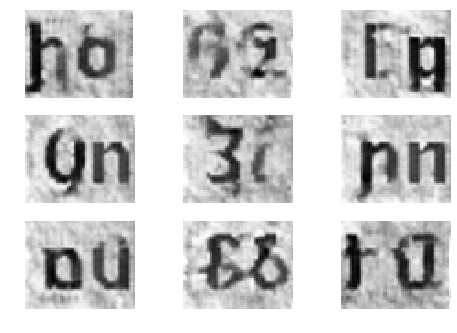

4951 [D loss: 0.276172] [G loss: 3.103686]
4952 [D loss: 0.851196] [G loss: 2.040586]
4953 [D loss: 0.455258] [G loss: 1.619359]
4954 [D loss: 0.376466] [G loss: 2.104691]
4955 [D loss: 0.399689] [G loss: 2.445394]
4956 [D loss: 0.432992] [G loss: 2.142518]
4957 [D loss: 0.442153] [G loss: 1.867796]
4958 [D loss: 0.427979] [G loss: 2.155403]
4959 [D loss: 0.678423] [G loss: 2.470537]
4960 [D loss: 0.554681] [G loss: 1.841208]
4961 [D loss: 0.423559] [G loss: 2.051493]
4962 [D loss: 0.659119] [G loss: 2.084805]
4963 [D loss: 0.410336] [G loss: 1.684378]
4964 [D loss: 0.540776] [G loss: 2.030397]
4965 [D loss: 0.573691] [G loss: 1.734908]
4966 [D loss: 0.427337] [G loss: 1.793373]
4967 [D loss: 0.364767] [G loss: 2.275423]
4968 [D loss: 0.541266] [G loss: 2.271883]
4969 [D loss: 0.539146] [G loss: 1.909774]
4970 [D loss: 0.560236] [G loss: 1.716958]
4971 [D loss: 0.584399] [G loss: 2.070589]
4972 [D loss: 0.556991] [G loss: 1.882373]
4973 [D loss: 0.604399] [G loss: 2.059231]
4974 [D los

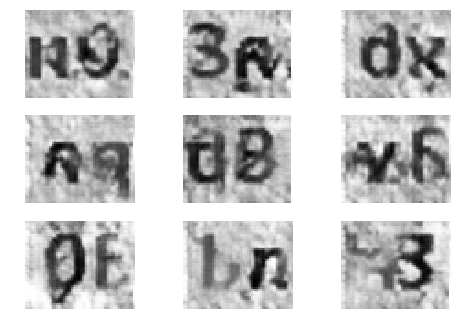

5001 [D loss: 0.612822] [G loss: 1.913338]
5002 [D loss: 0.471440] [G loss: 1.559540]
5003 [D loss: 0.199433] [G loss: 2.441408]
5004 [D loss: 0.422253] [G loss: 2.138888]
5005 [D loss: 0.545056] [G loss: 1.805819]
5006 [D loss: 0.330207] [G loss: 2.464543]
5007 [D loss: 0.465338] [G loss: 2.010447]
5008 [D loss: 0.451760] [G loss: 2.547207]
5009 [D loss: 0.454466] [G loss: 2.017689]
5010 [D loss: 0.317665] [G loss: 2.223939]
5011 [D loss: 0.570305] [G loss: 2.540255]
5012 [D loss: 0.438981] [G loss: 2.184219]
5013 [D loss: 0.385485] [G loss: 2.590767]
5014 [D loss: 0.823055] [G loss: 2.268616]
5015 [D loss: 0.225284] [G loss: 2.423965]
5016 [D loss: 0.495564] [G loss: 1.952480]
5017 [D loss: 0.401681] [G loss: 1.480253]
5018 [D loss: 0.293649] [G loss: 2.200855]
5019 [D loss: 0.919830] [G loss: 1.301630]
5020 [D loss: 0.587679] [G loss: 2.197756]
5021 [D loss: 0.642500] [G loss: 1.455984]
5022 [D loss: 0.527532] [G loss: 1.656880]
5023 [D loss: 0.466520] [G loss: 1.966905]
5024 [D los

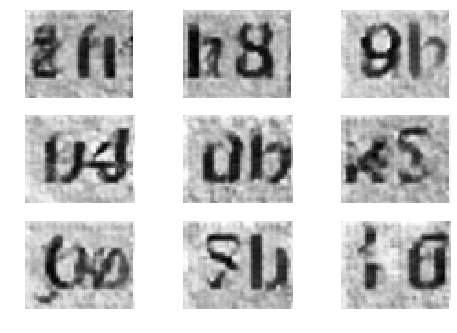

5051 [D loss: 0.609487] [G loss: 1.663247]
5052 [D loss: 0.462959] [G loss: 2.350641]
5053 [D loss: 0.312878] [G loss: 2.784837]
5054 [D loss: 0.585220] [G loss: 1.840632]
5055 [D loss: 0.250577] [G loss: 2.450362]
5056 [D loss: 0.504293] [G loss: 2.601195]
5057 [D loss: 0.455538] [G loss: 1.789743]
5058 [D loss: 0.370284] [G loss: 2.135755]
5059 [D loss: 0.230086] [G loss: 2.475883]
5060 [D loss: 0.546092] [G loss: 1.661667]
5061 [D loss: 0.719462] [G loss: 1.580354]
5062 [D loss: 0.594249] [G loss: 2.106400]
5063 [D loss: 0.236943] [G loss: 2.495594]
5064 [D loss: 0.346417] [G loss: 2.606607]
5065 [D loss: 0.644541] [G loss: 2.278941]
5066 [D loss: 0.548922] [G loss: 1.815631]
5067 [D loss: 0.308430] [G loss: 2.062635]
5068 [D loss: 0.509067] [G loss: 2.250809]
5069 [D loss: 0.753839] [G loss: 1.720024]
5070 [D loss: 0.237252] [G loss: 1.927327]
5071 [D loss: 0.553735] [G loss: 1.905166]
5072 [D loss: 0.573435] [G loss: 2.024179]
5073 [D loss: 0.594458] [G loss: 1.864815]
5074 [D los

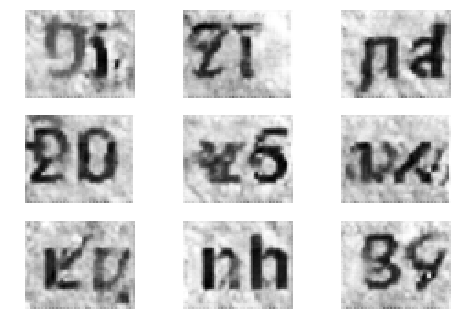

5101 [D loss: 0.477923] [G loss: 2.255962]
5102 [D loss: 0.628899] [G loss: 1.754565]
5103 [D loss: 0.626023] [G loss: 1.960708]
5104 [D loss: 0.307470] [G loss: 2.391969]
5105 [D loss: 0.608103] [G loss: 1.624573]
5106 [D loss: 0.453993] [G loss: 2.224699]
5107 [D loss: 0.212147] [G loss: 2.759164]
5108 [D loss: 0.356679] [G loss: 1.629842]
5109 [D loss: 0.771326] [G loss: 1.664461]
5110 [D loss: 0.202183] [G loss: 2.550122]
5111 [D loss: 0.360011] [G loss: 2.705534]
5112 [D loss: 0.613433] [G loss: 1.900041]
5113 [D loss: 0.546985] [G loss: 1.561991]
5114 [D loss: 0.475886] [G loss: 1.744574]
5115 [D loss: 0.241346] [G loss: 3.072042]
5116 [D loss: 0.559080] [G loss: 2.319217]
5117 [D loss: 0.769314] [G loss: 1.587501]
5118 [D loss: 0.723663] [G loss: 1.669534]
5119 [D loss: 0.499970] [G loss: 2.403380]
5120 [D loss: 0.647804] [G loss: 1.366463]
5121 [D loss: 0.623144] [G loss: 1.276723]
5122 [D loss: 0.413298] [G loss: 2.064989]
5123 [D loss: 0.715033] [G loss: 2.106478]
5124 [D los

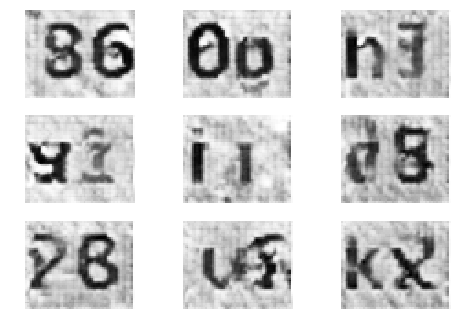

5151 [D loss: 0.548517] [G loss: 2.167025]
5152 [D loss: 0.475375] [G loss: 1.916714]
5153 [D loss: 0.494654] [G loss: 2.070225]
5154 [D loss: 0.544084] [G loss: 1.775047]
5155 [D loss: 0.405567] [G loss: 2.559113]
5156 [D loss: 0.703517] [G loss: 2.234118]
5157 [D loss: 0.310497] [G loss: 2.459190]
5158 [D loss: 0.346145] [G loss: 2.505802]
5159 [D loss: 0.630795] [G loss: 1.909670]
5160 [D loss: 0.555462] [G loss: 1.247909]
5161 [D loss: 0.323695] [G loss: 2.450593]
5162 [D loss: 0.339570] [G loss: 2.581592]
5163 [D loss: 0.567303] [G loss: 1.918285]
5164 [D loss: 0.385712] [G loss: 1.650825]
5165 [D loss: 0.508777] [G loss: 1.785719]
5166 [D loss: 0.331730] [G loss: 2.297980]
5167 [D loss: 0.447106] [G loss: 2.512050]
5168 [D loss: 0.443617] [G loss: 1.641473]
5169 [D loss: 0.387808] [G loss: 2.240744]
5170 [D loss: 0.643442] [G loss: 2.072110]
5171 [D loss: 0.303940] [G loss: 2.736873]
5172 [D loss: 0.706340] [G loss: 2.614243]
5173 [D loss: 0.578400] [G loss: 1.796295]
5174 [D los

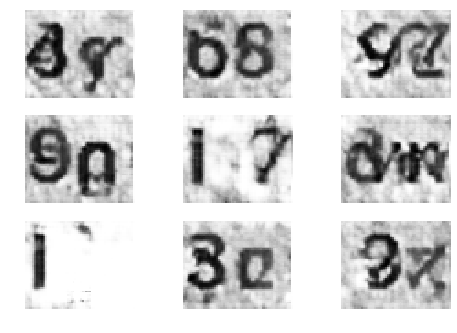

5201 [D loss: 0.485163] [G loss: 2.012949]
5202 [D loss: 0.584339] [G loss: 1.885998]
5203 [D loss: 0.460599] [G loss: 1.967449]
5204 [D loss: 0.453301] [G loss: 1.847102]
5205 [D loss: 0.512562] [G loss: 1.965106]
5206 [D loss: 0.156412] [G loss: 2.730643]
5207 [D loss: 0.735769] [G loss: 1.937720]
5208 [D loss: 0.426958] [G loss: 1.750619]
5209 [D loss: 0.458672] [G loss: 2.215677]
5210 [D loss: 0.706645] [G loss: 2.439120]
5211 [D loss: 0.259271] [G loss: 2.205046]
5212 [D loss: 0.250900] [G loss: 3.052282]
5213 [D loss: 0.558202] [G loss: 1.691890]
5214 [D loss: 0.494269] [G loss: 2.013538]
5215 [D loss: 0.572507] [G loss: 1.824726]
5216 [D loss: 0.483388] [G loss: 1.919270]
5217 [D loss: 0.558090] [G loss: 2.113968]
5218 [D loss: 0.373167] [G loss: 2.348529]
5219 [D loss: 0.496846] [G loss: 2.225266]
5220 [D loss: 0.360961] [G loss: 2.349598]
5221 [D loss: 0.659549] [G loss: 1.729493]
5222 [D loss: 0.492843] [G loss: 2.152096]
5223 [D loss: 0.419889] [G loss: 1.595899]
5224 [D los

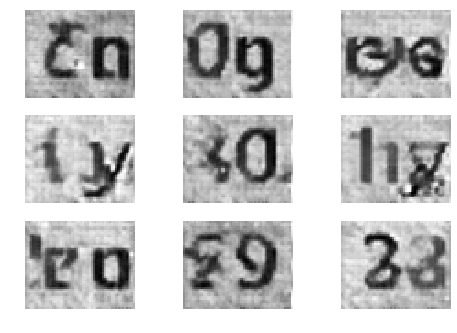

5251 [D loss: 0.661938] [G loss: 2.471361]
5252 [D loss: 0.424344] [G loss: 2.335939]
5253 [D loss: 0.470418] [G loss: 2.041645]
5254 [D loss: 0.662239] [G loss: 1.371011]
5255 [D loss: 0.686547] [G loss: 1.645406]
5256 [D loss: 0.635693] [G loss: 2.403898]
5257 [D loss: 0.471534] [G loss: 2.614989]
5258 [D loss: 0.409952] [G loss: 2.024339]
5259 [D loss: 0.330035] [G loss: 1.887835]
5260 [D loss: 0.330437] [G loss: 1.371376]
5261 [D loss: 0.535115] [G loss: 1.477554]
5262 [D loss: 0.545378] [G loss: 1.905326]
5263 [D loss: 0.379331] [G loss: 1.719821]
5264 [D loss: 0.602614] [G loss: 2.613228]
5265 [D loss: 0.440950] [G loss: 2.613728]
5266 [D loss: 0.591249] [G loss: 1.972345]
5267 [D loss: 0.575035] [G loss: 1.777568]
5268 [D loss: 0.545786] [G loss: 2.165782]
5269 [D loss: 0.527083] [G loss: 2.165699]
5270 [D loss: 0.705142] [G loss: 2.064724]
5271 [D loss: 0.304583] [G loss: 2.783477]
5272 [D loss: 0.425579] [G loss: 2.283532]
5273 [D loss: 0.546139] [G loss: 2.484078]
5274 [D los

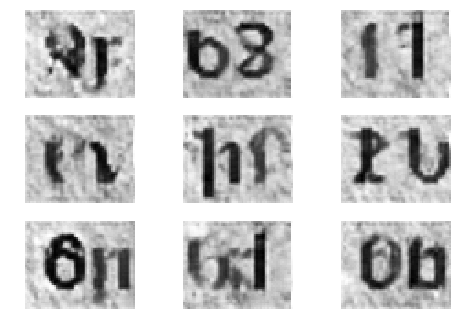

5301 [D loss: 0.556748] [G loss: 2.296402]
5302 [D loss: 0.599464] [G loss: 1.564190]
5303 [D loss: 0.568748] [G loss: 1.228816]
5304 [D loss: 0.508239] [G loss: 2.134329]
5305 [D loss: 0.286949] [G loss: 2.530049]
5306 [D loss: 0.530233] [G loss: 1.915756]
5307 [D loss: 0.479639] [G loss: 1.936102]
5308 [D loss: 0.582418] [G loss: 2.264370]
5309 [D loss: 0.362962] [G loss: 2.065727]
5310 [D loss: 0.602359] [G loss: 2.337904]
5311 [D loss: 0.536568] [G loss: 2.566057]
5312 [D loss: 0.447831] [G loss: 1.689940]
5313 [D loss: 0.521668] [G loss: 2.324310]
5314 [D loss: 0.401476] [G loss: 2.484853]
5315 [D loss: 0.459091] [G loss: 2.449114]
5316 [D loss: 0.696337] [G loss: 2.091504]
5317 [D loss: 0.332024] [G loss: 2.037508]
5318 [D loss: 0.483389] [G loss: 2.179668]
5319 [D loss: 0.309661] [G loss: 2.066564]
5320 [D loss: 0.834129] [G loss: 1.579339]
5321 [D loss: 0.562115] [G loss: 1.937010]
5322 [D loss: 0.280790] [G loss: 2.795786]
5323 [D loss: 0.537939] [G loss: 1.796495]
5324 [D los

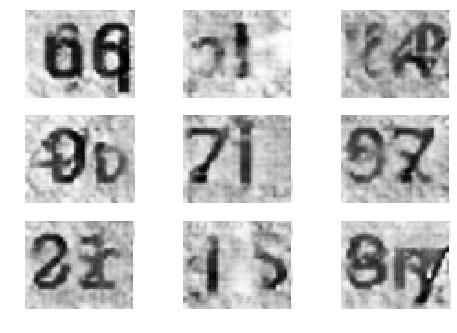

5351 [D loss: 0.804295] [G loss: 2.292691]
5352 [D loss: 0.440384] [G loss: 2.203238]
5353 [D loss: 0.409033] [G loss: 2.065536]
5354 [D loss: 0.167402] [G loss: 2.691382]
5355 [D loss: 0.588831] [G loss: 2.020271]
5356 [D loss: 0.677027] [G loss: 2.051515]
5357 [D loss: 0.175815] [G loss: 2.837118]
5358 [D loss: 0.203288] [G loss: 2.481139]
5359 [D loss: 0.311177] [G loss: 2.733853]
5360 [D loss: 0.682296] [G loss: 2.205234]
5361 [D loss: 0.512883] [G loss: 1.839300]
5362 [D loss: 0.299331] [G loss: 2.465520]
5363 [D loss: 0.845391] [G loss: 1.852926]
5364 [D loss: 0.171816] [G loss: 2.688081]
5365 [D loss: 0.526500] [G loss: 2.229988]
5366 [D loss: 0.543744] [G loss: 1.734210]
5367 [D loss: 0.487930] [G loss: 1.942540]
5368 [D loss: 0.414624] [G loss: 2.246773]
5369 [D loss: 0.355157] [G loss: 3.165246]
5370 [D loss: 0.679554] [G loss: 2.448523]
5371 [D loss: 0.559705] [G loss: 1.967400]
5372 [D loss: 0.486492] [G loss: 1.477971]
5373 [D loss: 0.811661] [G loss: 1.838949]
5374 [D los

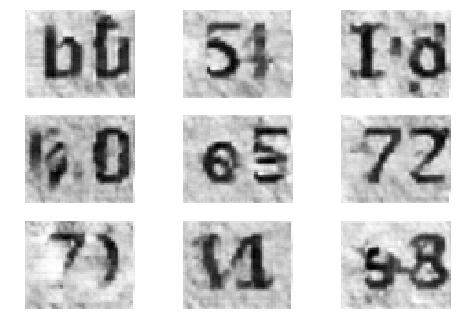

5401 [D loss: 0.533543] [G loss: 2.231339]
5402 [D loss: 0.517617] [G loss: 2.216843]
5403 [D loss: 0.498793] [G loss: 2.089724]
5404 [D loss: 0.551939] [G loss: 2.185487]
5405 [D loss: 0.433778] [G loss: 1.612933]
5406 [D loss: 0.737823] [G loss: 2.118718]
5407 [D loss: 0.463206] [G loss: 2.012880]
5408 [D loss: 0.667916] [G loss: 1.864967]
5409 [D loss: 0.284115] [G loss: 2.628827]
5410 [D loss: 0.486396] [G loss: 2.107166]
5411 [D loss: 0.595155] [G loss: 2.349721]
5412 [D loss: 0.593475] [G loss: 2.099925]
5413 [D loss: 0.386878] [G loss: 1.899144]
5414 [D loss: 0.554231] [G loss: 1.933536]
5415 [D loss: 0.443885] [G loss: 1.724058]
5416 [D loss: 0.518643] [G loss: 2.011427]
5417 [D loss: 0.528088] [G loss: 1.464310]
5418 [D loss: 0.575893] [G loss: 1.655569]
5419 [D loss: 0.457338] [G loss: 2.377482]
5420 [D loss: 0.621553] [G loss: 2.671175]
5421 [D loss: 0.792962] [G loss: 2.407410]
5422 [D loss: 0.426276] [G loss: 1.840974]
5423 [D loss: 0.713099] [G loss: 1.828789]
5424 [D los

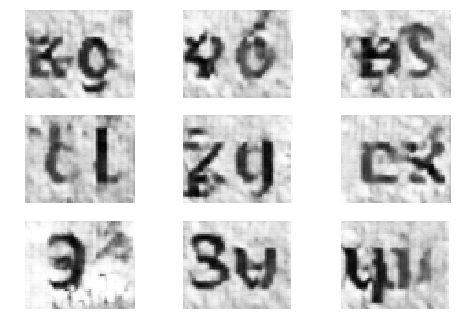

5451 [D loss: 0.491231] [G loss: 1.909394]
5452 [D loss: 0.600897] [G loss: 1.835889]
5453 [D loss: 0.327735] [G loss: 2.586555]
5454 [D loss: 0.279070] [G loss: 2.869599]
5455 [D loss: 0.269250] [G loss: 3.299138]
5456 [D loss: 0.811251] [G loss: 1.883318]
5457 [D loss: 0.519789] [G loss: 2.052497]
5458 [D loss: 0.592753] [G loss: 2.630072]
5459 [D loss: 0.305544] [G loss: 2.711866]
5460 [D loss: 0.342311] [G loss: 2.529722]
5461 [D loss: 0.342578] [G loss: 3.032977]
5462 [D loss: 0.377976] [G loss: 2.199902]
5463 [D loss: 0.740634] [G loss: 2.186017]
5464 [D loss: 0.602196] [G loss: 1.429722]
5465 [D loss: 0.425373] [G loss: 2.226312]
5466 [D loss: 0.580939] [G loss: 2.194280]
5467 [D loss: 0.445175] [G loss: 1.884032]
5468 [D loss: 0.574416] [G loss: 2.080270]
5469 [D loss: 0.310652] [G loss: 2.567119]
5470 [D loss: 0.251402] [G loss: 2.568871]
5471 [D loss: 0.152777] [G loss: 3.261732]
5472 [D loss: 0.565672] [G loss: 2.579662]
5473 [D loss: 0.657682] [G loss: 2.143446]
5474 [D los

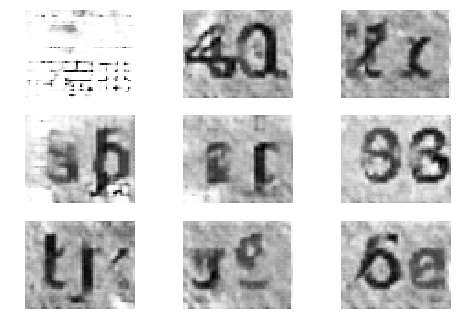

5501 [D loss: 0.796476] [G loss: 2.258496]
5502 [D loss: 0.806435] [G loss: 1.512508]
5503 [D loss: 0.539072] [G loss: 1.427530]
5504 [D loss: 0.690692] [G loss: 1.579756]
5505 [D loss: 0.756557] [G loss: 2.233840]
5506 [D loss: 0.327347] [G loss: 1.957735]
5507 [D loss: 0.439380] [G loss: 1.541308]
5508 [D loss: 0.573846] [G loss: 2.443168]
5509 [D loss: 0.477116] [G loss: 1.987470]
5510 [D loss: 0.474428] [G loss: 1.939975]
5511 [D loss: 0.492206] [G loss: 1.821199]
5512 [D loss: 0.434665] [G loss: 2.201746]
5513 [D loss: 0.451191] [G loss: 2.020752]
5514 [D loss: 0.397762] [G loss: 2.102633]
5515 [D loss: 0.419364] [G loss: 2.148592]
5516 [D loss: 0.533020] [G loss: 2.011210]
5517 [D loss: 0.492007] [G loss: 1.919396]
5518 [D loss: 0.356799] [G loss: 2.507801]
5519 [D loss: 0.480263] [G loss: 2.435498]
5520 [D loss: 0.538620] [G loss: 1.878569]
5521 [D loss: 0.313938] [G loss: 2.574139]
5522 [D loss: 0.448340] [G loss: 2.954455]
5523 [D loss: 0.468447] [G loss: 2.869557]
5524 [D los

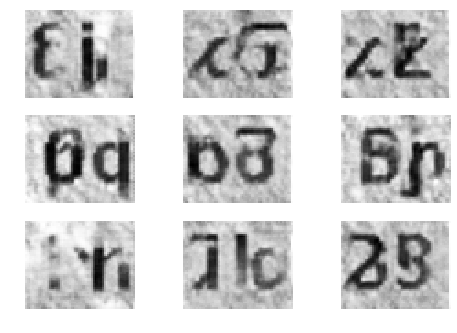

5551 [D loss: 0.441233] [G loss: 2.414948]
5552 [D loss: 0.466868] [G loss: 2.754856]
5553 [D loss: 0.655015] [G loss: 1.585196]
5554 [D loss: 0.341426] [G loss: 2.430412]
5555 [D loss: 0.423535] [G loss: 2.303528]
5556 [D loss: 0.467903] [G loss: 1.880584]
5557 [D loss: 0.512959] [G loss: 2.731510]
5558 [D loss: 0.586691] [G loss: 2.271260]
5559 [D loss: 0.550446] [G loss: 1.846320]
5560 [D loss: 0.517174] [G loss: 2.002260]
5561 [D loss: 0.568426] [G loss: 2.040849]
5562 [D loss: 0.485126] [G loss: 2.612711]
5563 [D loss: 0.450419] [G loss: 2.162644]
5564 [D loss: 0.580242] [G loss: 2.287480]
5565 [D loss: 0.457349] [G loss: 2.092025]
5566 [D loss: 0.439004] [G loss: 1.995317]
5567 [D loss: 0.708338] [G loss: 1.864832]
5568 [D loss: 0.500459] [G loss: 1.797515]
5569 [D loss: 0.496360] [G loss: 2.425524]
5570 [D loss: 0.504435] [G loss: 2.008614]
5571 [D loss: 0.413281] [G loss: 2.337209]
5572 [D loss: 0.373426] [G loss: 2.369648]
5573 [D loss: 0.672539] [G loss: 2.432519]
5574 [D los

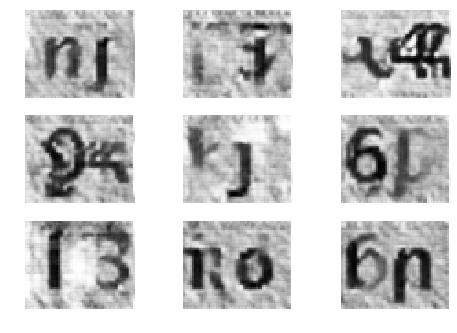

5601 [D loss: 0.519527] [G loss: 2.396413]
5602 [D loss: 0.266062] [G loss: 2.791416]
5603 [D loss: 0.640036] [G loss: 2.107780]
5604 [D loss: 0.345204] [G loss: 3.029416]
5605 [D loss: 0.586874] [G loss: 2.517616]
5606 [D loss: 0.183226] [G loss: 3.031569]
5607 [D loss: 0.181359] [G loss: 2.791729]
5608 [D loss: 0.847038] [G loss: 1.469644]
5609 [D loss: 0.612710] [G loss: 2.155782]
5610 [D loss: 0.377251] [G loss: 2.073140]
5611 [D loss: 0.207382] [G loss: 2.618567]
5612 [D loss: 0.638383] [G loss: 2.150714]
5613 [D loss: 0.505012] [G loss: 2.603491]
5614 [D loss: 0.487825] [G loss: 2.330416]
5615 [D loss: 0.426283] [G loss: 2.191399]
5616 [D loss: 0.468815] [G loss: 2.518579]
5617 [D loss: 0.209222] [G loss: 2.661562]
5618 [D loss: 0.730209] [G loss: 1.798361]
5619 [D loss: 0.568868] [G loss: 2.036149]
5620 [D loss: 0.183856] [G loss: 2.587991]
5621 [D loss: 0.599062] [G loss: 1.824084]
5622 [D loss: 0.458441] [G loss: 1.926150]
5623 [D loss: 0.599716] [G loss: 2.531662]
5624 [D los

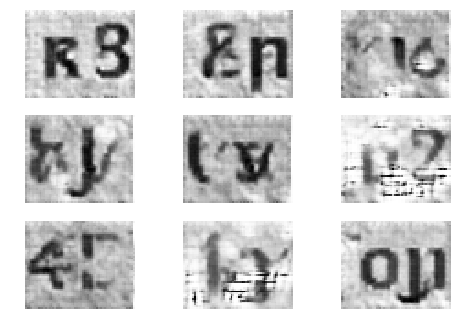

5651 [D loss: 0.409004] [G loss: 1.806234]
5652 [D loss: 0.641036] [G loss: 2.376626]
5653 [D loss: 0.458907] [G loss: 2.911170]
5654 [D loss: 0.606902] [G loss: 1.825666]
5655 [D loss: 0.583036] [G loss: 1.795386]
5656 [D loss: 0.595321] [G loss: 2.300140]
5657 [D loss: 0.475351] [G loss: 2.644192]
5658 [D loss: 0.465809] [G loss: 2.050514]
5659 [D loss: 0.336588] [G loss: 2.288813]
5660 [D loss: 0.391467] [G loss: 1.917216]
5661 [D loss: 0.558778] [G loss: 2.296142]
5662 [D loss: 0.555556] [G loss: 1.442301]
5663 [D loss: 0.517748] [G loss: 2.092469]
5664 [D loss: 0.481041] [G loss: 2.178373]
5665 [D loss: 0.878327] [G loss: 2.335191]
5666 [D loss: 0.433150] [G loss: 1.726078]
5667 [D loss: 0.526354] [G loss: 1.726068]
5668 [D loss: 0.391891] [G loss: 1.336917]
5669 [D loss: 0.693271] [G loss: 2.433898]
5670 [D loss: 0.560732] [G loss: 2.569705]
5671 [D loss: 0.513603] [G loss: 2.466687]
5672 [D loss: 0.377040] [G loss: 3.036886]
5673 [D loss: 0.492862] [G loss: 1.606646]
5674 [D los

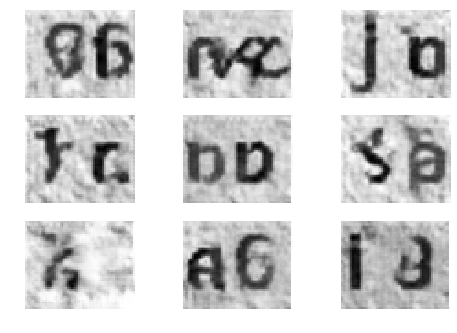

5701 [D loss: 0.784224] [G loss: 1.943565]
5702 [D loss: 0.430809] [G loss: 2.612023]
5703 [D loss: 0.442389] [G loss: 1.897996]
5704 [D loss: 0.289921] [G loss: 2.004819]
5705 [D loss: 0.530007] [G loss: 1.364640]
5706 [D loss: 0.688418] [G loss: 2.054800]
5707 [D loss: 0.426474] [G loss: 2.241790]
5708 [D loss: 0.454567] [G loss: 2.341460]
5709 [D loss: 0.910458] [G loss: 1.388261]
5710 [D loss: 0.619545] [G loss: 2.234554]
5711 [D loss: 0.221966] [G loss: 3.503300]
5712 [D loss: 0.463581] [G loss: 2.270156]
5713 [D loss: 0.429413] [G loss: 2.256845]
5714 [D loss: 0.552206] [G loss: 2.020197]
5715 [D loss: 0.497497] [G loss: 2.122342]
5716 [D loss: 0.330658] [G loss: 2.379706]
5717 [D loss: 0.519911] [G loss: 1.988426]
5718 [D loss: 0.432853] [G loss: 2.017075]
5719 [D loss: 0.275803] [G loss: 2.148002]
5720 [D loss: 0.532842] [G loss: 1.960764]
5721 [D loss: 0.429389] [G loss: 2.018817]
5722 [D loss: 0.532869] [G loss: 2.679398]
5723 [D loss: 0.460221] [G loss: 2.512486]
5724 [D los

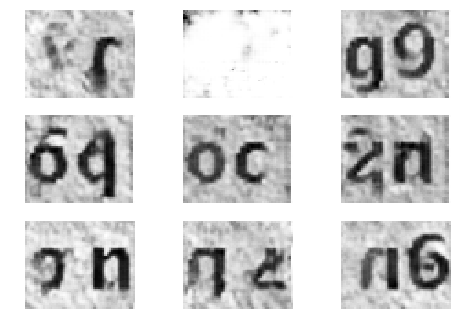

5751 [D loss: 0.212250] [G loss: 3.098128]
5752 [D loss: 0.595279] [G loss: 1.986747]
5753 [D loss: 0.503104] [G loss: 2.169769]
5754 [D loss: 0.657568] [G loss: 2.388046]
5755 [D loss: 0.188565] [G loss: 2.963855]
5756 [D loss: 0.424665] [G loss: 2.040557]
5757 [D loss: 0.548671] [G loss: 1.837151]
5758 [D loss: 0.474668] [G loss: 2.497779]
5759 [D loss: 0.413403] [G loss: 2.069512]
5760 [D loss: 0.187524] [G loss: 2.455062]
5761 [D loss: 0.674945] [G loss: 2.062853]
5762 [D loss: 0.482240] [G loss: 1.955644]
5763 [D loss: 0.452175] [G loss: 2.179899]
5764 [D loss: 0.294119] [G loss: 2.451451]
5765 [D loss: 0.632162] [G loss: 2.499002]
5766 [D loss: 0.295330] [G loss: 2.411146]
5767 [D loss: 0.607730] [G loss: 2.128468]
5768 [D loss: 0.387435] [G loss: 1.871396]
5769 [D loss: 0.670723] [G loss: 1.936153]
5770 [D loss: 0.544427] [G loss: 2.075423]
5771 [D loss: 0.314005] [G loss: 1.992691]
5772 [D loss: 0.222184] [G loss: 2.668171]
5773 [D loss: 0.784683] [G loss: 1.753793]
5774 [D los

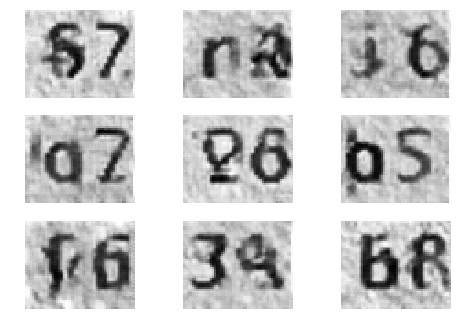

5801 [D loss: 0.623673] [G loss: 2.054547]
5802 [D loss: 0.321612] [G loss: 2.628541]
5803 [D loss: 0.552880] [G loss: 2.276735]
5804 [D loss: 0.420743] [G loss: 2.310651]
5805 [D loss: 0.509262] [G loss: 1.372076]
5806 [D loss: 0.403210] [G loss: 2.125732]
5807 [D loss: 0.360652] [G loss: 2.324500]
5808 [D loss: 0.314920] [G loss: 2.506986]
5809 [D loss: 0.633794] [G loss: 2.283297]
5810 [D loss: 0.418167] [G loss: 2.101667]
5811 [D loss: 0.567659] [G loss: 2.396787]
5812 [D loss: 0.537253] [G loss: 1.935934]
5813 [D loss: 0.370870] [G loss: 2.281390]
5814 [D loss: 0.695721] [G loss: 2.086876]
5815 [D loss: 0.366811] [G loss: 1.880067]
5816 [D loss: 0.490056] [G loss: 2.151831]
5817 [D loss: 0.534976] [G loss: 1.967331]
5818 [D loss: 0.427378] [G loss: 1.880331]
5819 [D loss: 0.813466] [G loss: 2.300658]
5820 [D loss: 0.543583] [G loss: 2.129863]
5821 [D loss: 0.355736] [G loss: 2.553298]
5822 [D loss: 0.571641] [G loss: 2.187274]
5823 [D loss: 0.301443] [G loss: 2.036859]
5824 [D los

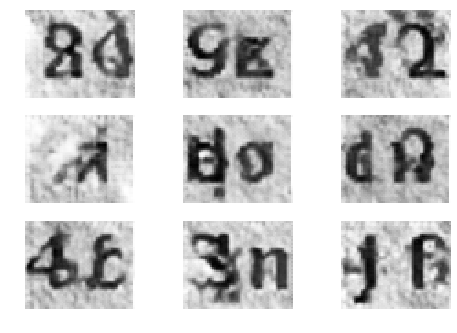

5851 [D loss: 0.397740] [G loss: 2.364912]
5852 [D loss: 0.552981] [G loss: 2.665111]
5853 [D loss: 0.645014] [G loss: 2.439557]
5854 [D loss: 0.559142] [G loss: 2.628378]
5855 [D loss: 0.433965] [G loss: 2.717959]
5856 [D loss: 0.533301] [G loss: 2.154015]
5857 [D loss: 0.237164] [G loss: 2.334799]
5858 [D loss: 0.563425] [G loss: 1.593254]
5859 [D loss: 0.550585] [G loss: 1.963940]
5860 [D loss: 0.382045] [G loss: 1.938409]
5861 [D loss: 0.485493] [G loss: 2.350031]
5862 [D loss: 0.619314] [G loss: 1.776996]
5863 [D loss: 0.806630] [G loss: 1.178378]
5864 [D loss: 0.487435] [G loss: 2.703397]
5865 [D loss: 0.716618] [G loss: 2.339527]
5866 [D loss: 0.389748] [G loss: 1.933682]
5867 [D loss: 0.427173] [G loss: 2.435262]
5868 [D loss: 0.726069] [G loss: 2.273615]
5869 [D loss: 0.501981] [G loss: 2.083668]
5870 [D loss: 0.675163] [G loss: 2.306271]
5871 [D loss: 0.573152] [G loss: 1.946794]
5872 [D loss: 0.410062] [G loss: 2.397168]
5873 [D loss: 0.448736] [G loss: 2.001620]
5874 [D los

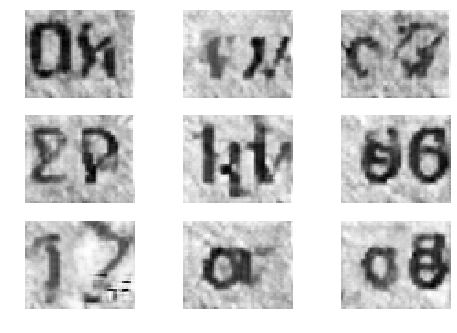

5901 [D loss: 0.463751] [G loss: 2.361198]
5902 [D loss: 0.591593] [G loss: 1.716043]
5903 [D loss: 0.344132] [G loss: 2.277358]
5904 [D loss: 0.397442] [G loss: 2.330080]
5905 [D loss: 0.581343] [G loss: 2.326680]
5906 [D loss: 0.328373] [G loss: 2.771937]
5907 [D loss: 0.552600] [G loss: 1.796070]
5908 [D loss: 0.300802] [G loss: 1.813910]
5909 [D loss: 0.579127] [G loss: 2.292437]
5910 [D loss: 0.506929] [G loss: 1.863418]
5911 [D loss: 0.601529] [G loss: 1.988319]
5912 [D loss: 0.363644] [G loss: 1.883733]
5913 [D loss: 0.501334] [G loss: 2.520454]
5914 [D loss: 0.463690] [G loss: 2.809515]
5915 [D loss: 0.391084] [G loss: 2.236729]
5916 [D loss: 0.487978] [G loss: 2.734886]
5917 [D loss: 0.534955] [G loss: 2.656688]
5918 [D loss: 0.340865] [G loss: 2.601230]
5919 [D loss: 0.583760] [G loss: 1.805959]
5920 [D loss: 0.407330] [G loss: 2.516827]
5921 [D loss: 0.536220] [G loss: 2.137089]
5922 [D loss: 0.319345] [G loss: 2.877343]
5923 [D loss: 0.373015] [G loss: 2.001965]
5924 [D los

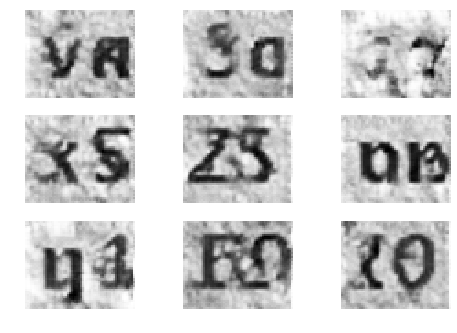

5951 [D loss: 0.387516] [G loss: 2.524224]
5952 [D loss: 0.609041] [G loss: 2.087974]
5953 [D loss: 0.493318] [G loss: 2.215021]
5954 [D loss: 0.467946] [G loss: 2.202693]
5955 [D loss: 0.518152] [G loss: 2.437810]
5956 [D loss: 0.500326] [G loss: 1.863817]
5957 [D loss: 0.608396] [G loss: 1.937776]
5958 [D loss: 0.411724] [G loss: 2.213546]
5959 [D loss: 0.444671] [G loss: 2.053466]
5960 [D loss: 0.384659] [G loss: 1.363732]
5961 [D loss: 0.617664] [G loss: 1.293912]
5962 [D loss: 0.638397] [G loss: 2.534177]
5963 [D loss: 0.344563] [G loss: 2.480987]
5964 [D loss: 0.431203] [G loss: 2.528634]
5965 [D loss: 0.469328] [G loss: 2.843358]
5966 [D loss: 0.428424] [G loss: 2.354424]
5967 [D loss: 0.241175] [G loss: 2.514534]
5968 [D loss: 0.504173] [G loss: 2.072919]
5969 [D loss: 0.441057] [G loss: 2.721637]
5970 [D loss: 0.408647] [G loss: 2.416497]
5971 [D loss: 0.476460] [G loss: 1.920643]
5972 [D loss: 0.504634] [G loss: 2.128633]
5973 [D loss: 0.466054] [G loss: 2.590436]
5974 [D los

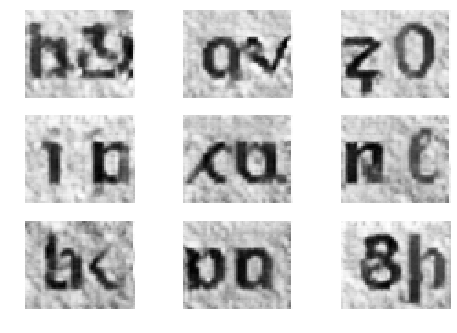

6001 [D loss: 0.518307] [G loss: 2.826061]
6002 [D loss: 0.652468] [G loss: 1.806484]
6003 [D loss: 0.621400] [G loss: 1.750338]
6004 [D loss: 0.443226] [G loss: 2.500962]
6005 [D loss: 0.541255] [G loss: 2.227845]
6006 [D loss: 0.515027] [G loss: 2.321009]
6007 [D loss: 0.827792] [G loss: 2.660190]
6008 [D loss: 0.428720] [G loss: 2.727999]
6009 [D loss: 0.533841] [G loss: 2.460834]
6010 [D loss: 0.514084] [G loss: 2.191512]
6011 [D loss: 0.464749] [G loss: 1.956215]
6012 [D loss: 0.509964] [G loss: 1.675360]
6013 [D loss: 0.485632] [G loss: 2.517188]
6014 [D loss: 0.368536] [G loss: 2.226971]
6015 [D loss: 0.397526] [G loss: 2.740448]
6016 [D loss: 0.313791] [G loss: 2.461324]
6017 [D loss: 0.361187] [G loss: 2.865510]
6018 [D loss: 0.428676] [G loss: 2.105632]
6019 [D loss: 0.469250] [G loss: 1.847870]
6020 [D loss: 0.455012] [G loss: 1.962833]
6021 [D loss: 0.359784] [G loss: 3.189300]
6022 [D loss: 0.360391] [G loss: 3.144071]
6023 [D loss: 0.587530] [G loss: 2.042254]
6024 [D los

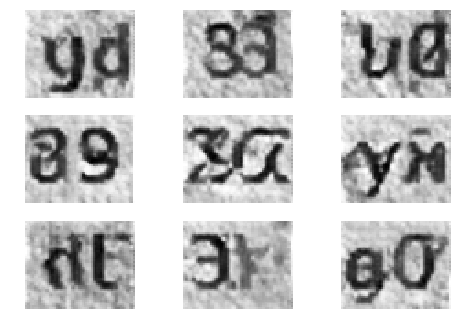

6051 [D loss: 0.627698] [G loss: 1.879024]
6052 [D loss: 0.862904] [G loss: 2.309498]
6053 [D loss: 0.529903] [G loss: 1.966048]
6054 [D loss: 0.575532] [G loss: 2.334293]
6055 [D loss: 0.484416] [G loss: 2.468645]
6056 [D loss: 0.484827] [G loss: 2.022559]
6057 [D loss: 0.517257] [G loss: 1.953169]
6058 [D loss: 0.558395] [G loss: 2.063284]
6059 [D loss: 0.224051] [G loss: 2.676367]
6060 [D loss: 0.273920] [G loss: 3.072515]
6061 [D loss: 0.509042] [G loss: 2.013680]
6062 [D loss: 0.497280] [G loss: 1.795745]
6063 [D loss: 0.310154] [G loss: 2.271830]
6064 [D loss: 0.439129] [G loss: 2.113970]
6065 [D loss: 0.524546] [G loss: 2.005156]
6066 [D loss: 0.624449] [G loss: 1.693254]
6067 [D loss: 0.586674] [G loss: 2.878354]
6068 [D loss: 0.423808] [G loss: 1.944016]
6069 [D loss: 0.507704] [G loss: 2.017129]
6070 [D loss: 0.267228] [G loss: 1.921166]
6071 [D loss: 0.409650] [G loss: 1.807892]
6072 [D loss: 0.547637] [G loss: 2.103198]
6073 [D loss: 0.542730] [G loss: 1.612854]
6074 [D los

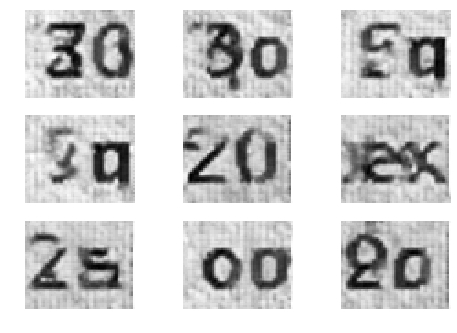

6101 [D loss: 0.571550] [G loss: 2.390268]
6102 [D loss: 0.319782] [G loss: 2.179131]
6103 [D loss: 0.425815] [G loss: 2.113606]
6104 [D loss: 0.548176] [G loss: 2.623411]
6105 [D loss: 0.440991] [G loss: 2.541799]
6106 [D loss: 0.389644] [G loss: 2.423591]
6107 [D loss: 0.534192] [G loss: 1.920031]
6108 [D loss: 0.375660] [G loss: 2.255680]
6109 [D loss: 0.302297] [G loss: 2.325784]
6110 [D loss: 0.564727] [G loss: 2.080262]
6111 [D loss: 0.393062] [G loss: 2.688199]
6112 [D loss: 0.545325] [G loss: 1.818702]
6113 [D loss: 0.342642] [G loss: 2.556270]
6114 [D loss: 0.488186] [G loss: 2.444236]
6115 [D loss: 0.310174] [G loss: 3.130552]
6116 [D loss: 0.438510] [G loss: 3.011078]
6117 [D loss: 0.847401] [G loss: 1.948464]
6118 [D loss: 0.358064] [G loss: 2.358953]
6119 [D loss: 0.260623] [G loss: 2.572896]
6120 [D loss: 0.561042] [G loss: 2.062455]
6121 [D loss: 0.261200] [G loss: 1.996348]
6122 [D loss: 0.597676] [G loss: 2.299552]
6123 [D loss: 0.528902] [G loss: 2.569512]
6124 [D los

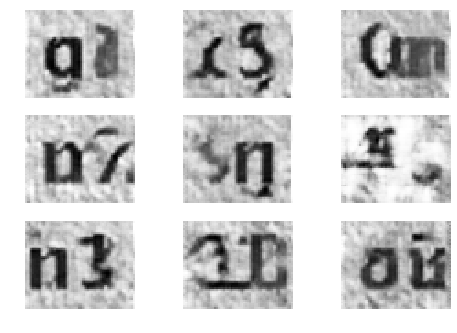

6151 [D loss: 0.578541] [G loss: 2.384251]
6152 [D loss: 0.349080] [G loss: 2.962325]
6153 [D loss: 0.707571] [G loss: 2.220652]
6154 [D loss: 0.557829] [G loss: 1.887524]
6155 [D loss: 0.592835] [G loss: 2.428028]
6156 [D loss: 0.656513] [G loss: 2.116679]
6157 [D loss: 0.342027] [G loss: 2.387702]
6158 [D loss: 0.354210] [G loss: 2.458267]
6159 [D loss: 0.632900] [G loss: 2.648745]
6160 [D loss: 0.391803] [G loss: 2.787609]
6161 [D loss: 0.474984] [G loss: 1.930417]
6162 [D loss: 0.395274] [G loss: 2.361562]
6163 [D loss: 0.481631] [G loss: 1.781603]
6164 [D loss: 0.432833] [G loss: 1.623261]
6165 [D loss: 0.436501] [G loss: 2.392297]
6166 [D loss: 0.509935] [G loss: 2.192255]
6167 [D loss: 0.279905] [G loss: 2.939885]
6168 [D loss: 0.207266] [G loss: 3.076276]
6169 [D loss: 0.701899] [G loss: 1.886842]
6170 [D loss: 0.383000] [G loss: 2.780123]
6171 [D loss: 0.515059] [G loss: 2.208857]
6172 [D loss: 0.520606] [G loss: 3.055069]
6173 [D loss: 0.344888] [G loss: 2.583026]
6174 [D los

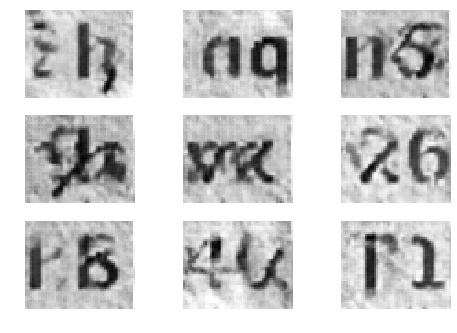

6201 [D loss: 0.489067] [G loss: 1.790307]
6202 [D loss: 0.438363] [G loss: 2.327971]
6203 [D loss: 0.428927] [G loss: 2.538413]
6204 [D loss: 0.432545] [G loss: 2.451024]
6205 [D loss: 0.375877] [G loss: 2.824339]
6206 [D loss: 0.497356] [G loss: 2.076352]
6207 [D loss: 0.455939] [G loss: 2.551312]
6208 [D loss: 0.525917] [G loss: 1.730625]
6209 [D loss: 0.408350] [G loss: 2.274282]
6210 [D loss: 0.611266] [G loss: 1.758926]
6211 [D loss: 0.634644] [G loss: 2.301792]
6212 [D loss: 0.403881] [G loss: 2.841041]
6213 [D loss: 0.498375] [G loss: 2.929562]
6214 [D loss: 0.454869] [G loss: 2.349893]
6215 [D loss: 0.405674] [G loss: 2.068435]
6216 [D loss: 0.530910] [G loss: 1.987705]
6217 [D loss: 0.472747] [G loss: 1.886295]
6218 [D loss: 0.411244] [G loss: 1.926196]
6219 [D loss: 0.461738] [G loss: 1.890191]
6220 [D loss: 0.515689] [G loss: 2.347265]
6221 [D loss: 0.313456] [G loss: 3.028709]
6222 [D loss: 0.433137] [G loss: 2.906683]
6223 [D loss: 0.341441] [G loss: 2.790815]
6224 [D los

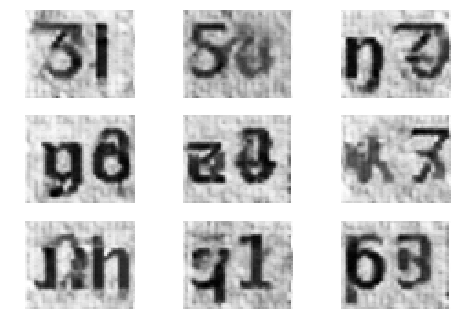

6251 [D loss: 0.470547] [G loss: 2.741572]
6252 [D loss: 0.344451] [G loss: 2.145813]
6253 [D loss: 0.231274] [G loss: 2.602075]
6254 [D loss: 0.536531] [G loss: 2.394392]
6255 [D loss: 0.631635] [G loss: 2.166922]
6256 [D loss: 0.430159] [G loss: 1.798200]
6257 [D loss: 0.256175] [G loss: 2.999091]
6258 [D loss: 0.468902] [G loss: 2.754551]
6259 [D loss: 0.371497] [G loss: 3.058501]
6260 [D loss: 0.908818] [G loss: 3.213995]
6261 [D loss: 0.663917] [G loss: 2.292871]
6262 [D loss: 0.264065] [G loss: 2.806756]
6263 [D loss: 0.479610] [G loss: 2.101890]
6264 [D loss: 0.430134] [G loss: 2.310162]
6265 [D loss: 0.602183] [G loss: 2.873495]
6266 [D loss: 0.429221] [G loss: 2.770149]
6267 [D loss: 0.485765] [G loss: 2.788785]
6268 [D loss: 0.572065] [G loss: 2.125896]
6269 [D loss: 0.390632] [G loss: 2.255461]
6270 [D loss: 0.461586] [G loss: 1.798366]
6271 [D loss: 0.334015] [G loss: 2.716002]
6272 [D loss: 0.213552] [G loss: 2.706341]
6273 [D loss: 0.526326] [G loss: 1.690622]
6274 [D los

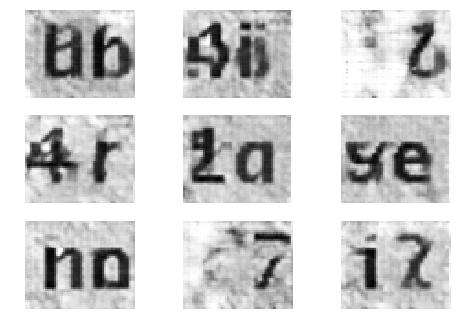

6301 [D loss: 0.345943] [G loss: 2.071856]
6302 [D loss: 0.361199] [G loss: 2.442881]
6303 [D loss: 0.385781] [G loss: 1.642191]
6304 [D loss: 0.315072] [G loss: 2.716417]
6305 [D loss: 0.583946] [G loss: 2.243380]
6306 [D loss: 0.458434] [G loss: 3.233920]
6307 [D loss: 0.518893] [G loss: 1.693915]
6308 [D loss: 0.596997] [G loss: 1.987154]
6309 [D loss: 0.399000] [G loss: 2.259307]
6310 [D loss: 0.503752] [G loss: 1.823931]
6311 [D loss: 0.690168] [G loss: 1.472290]
6312 [D loss: 0.417391] [G loss: 2.217641]
6313 [D loss: 0.456410] [G loss: 2.179113]
6314 [D loss: 0.389057] [G loss: 2.486283]
6315 [D loss: 0.447060] [G loss: 2.534215]
6316 [D loss: 0.415025] [G loss: 2.474457]
6317 [D loss: 0.277019] [G loss: 2.378258]
6318 [D loss: 0.450240] [G loss: 2.413795]
6319 [D loss: 0.590488] [G loss: 2.251613]
6320 [D loss: 0.479906] [G loss: 2.410000]
6321 [D loss: 0.347745] [G loss: 2.146259]
6322 [D loss: 0.535307] [G loss: 2.317377]
6323 [D loss: 0.511815] [G loss: 2.123842]
6324 [D los

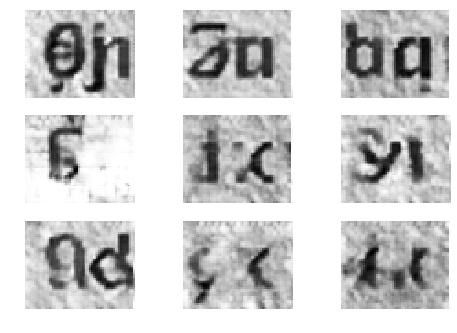

6351 [D loss: 0.537438] [G loss: 2.189904]
6352 [D loss: 0.642639] [G loss: 2.984102]
6353 [D loss: 0.437420] [G loss: 2.466736]
6354 [D loss: 0.510067] [G loss: 2.801152]
6355 [D loss: 0.481446] [G loss: 2.808310]
6356 [D loss: 0.381082] [G loss: 2.378423]
6357 [D loss: 0.366269] [G loss: 2.380891]
6358 [D loss: 0.505365] [G loss: 2.531098]
6359 [D loss: 0.435407] [G loss: 2.119807]
6360 [D loss: 0.437892] [G loss: 2.227230]
6361 [D loss: 0.365750] [G loss: 2.543906]
6362 [D loss: 0.593392] [G loss: 2.014972]
6363 [D loss: 0.396162] [G loss: 2.671591]
6364 [D loss: 0.464034] [G loss: 2.329346]
6365 [D loss: 0.370506] [G loss: 2.406841]
6366 [D loss: 0.372138] [G loss: 2.369313]
6367 [D loss: 0.573078] [G loss: 2.162557]
6368 [D loss: 0.517510] [G loss: 1.950963]
6369 [D loss: 0.620700] [G loss: 2.276347]
6370 [D loss: 0.542161] [G loss: 2.099985]
6371 [D loss: 0.379081] [G loss: 2.545063]
6372 [D loss: 0.399648] [G loss: 3.042158]
6373 [D loss: 0.586588] [G loss: 1.945190]
6374 [D los

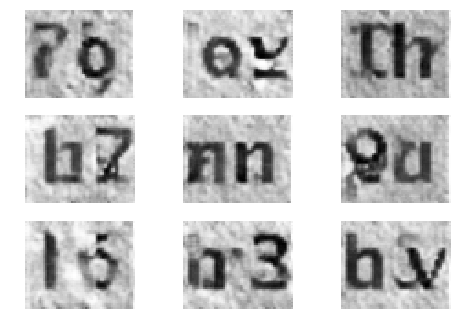

6401 [D loss: 0.430268] [G loss: 2.726832]
6402 [D loss: 0.516890] [G loss: 2.921755]
6403 [D loss: 0.722555] [G loss: 2.724517]
6404 [D loss: 0.486868] [G loss: 2.621248]
6405 [D loss: 0.490471] [G loss: 2.265437]
6406 [D loss: 0.519587] [G loss: 2.190069]
6407 [D loss: 0.407939] [G loss: 1.301684]
6408 [D loss: 0.296808] [G loss: 2.695561]
6409 [D loss: 0.561570] [G loss: 2.123510]
6410 [D loss: 0.195494] [G loss: 2.909474]
6411 [D loss: 0.489275] [G loss: 2.337812]
6412 [D loss: 0.205575] [G loss: 2.154290]
6413 [D loss: 0.565169] [G loss: 2.067410]
6414 [D loss: 0.335152] [G loss: 2.387316]
6415 [D loss: 0.507349] [G loss: 2.396835]
6416 [D loss: 0.276749] [G loss: 3.092644]
6417 [D loss: 0.520438] [G loss: 2.009508]
6418 [D loss: 0.233438] [G loss: 2.174953]
6419 [D loss: 0.527863] [G loss: 2.290738]
6420 [D loss: 0.344744] [G loss: 1.928759]
6421 [D loss: 0.365581] [G loss: 2.220917]
6422 [D loss: 0.577017] [G loss: 1.935471]
6423 [D loss: 0.211358] [G loss: 3.400171]
6424 [D los

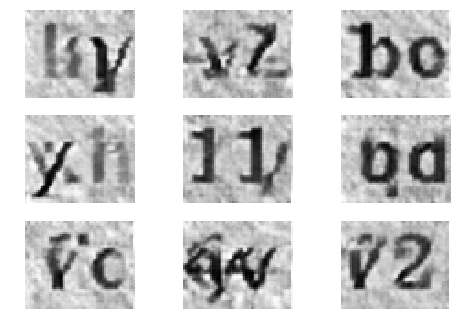

6451 [D loss: 0.624841] [G loss: 2.219830]
6452 [D loss: 0.520651] [G loss: 2.137566]
6453 [D loss: 0.625809] [G loss: 1.572439]
6454 [D loss: 0.504443] [G loss: 1.783279]
6455 [D loss: 0.162772] [G loss: 3.176385]
6456 [D loss: 0.097135] [G loss: 3.588858]
6457 [D loss: 0.564813] [G loss: 2.690830]
6458 [D loss: 0.806463] [G loss: 2.165034]
6459 [D loss: 0.391472] [G loss: 2.512752]
6460 [D loss: 0.589269] [G loss: 2.405521]
6461 [D loss: 0.373564] [G loss: 2.437162]
6462 [D loss: 0.330910] [G loss: 2.318748]
6463 [D loss: 0.536444] [G loss: 2.858415]
6464 [D loss: 0.728486] [G loss: 2.164613]
6465 [D loss: 0.674693] [G loss: 2.055749]
6466 [D loss: 0.448732] [G loss: 2.500059]
6467 [D loss: 0.369039] [G loss: 1.916376]
6468 [D loss: 0.761184] [G loss: 2.633621]
6469 [D loss: 0.540821] [G loss: 2.612159]
6470 [D loss: 0.185023] [G loss: 3.338445]
6471 [D loss: 0.129175] [G loss: 3.024584]
6472 [D loss: 0.696451] [G loss: 1.936378]
6473 [D loss: 0.210690] [G loss: 2.114938]
6474 [D los

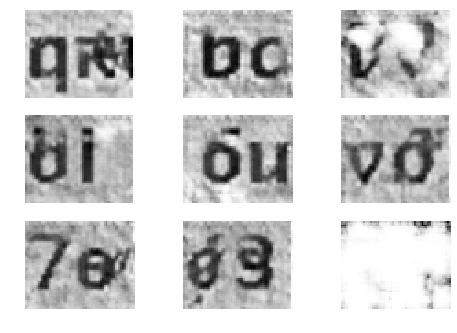

6501 [D loss: 0.646090] [G loss: 3.264616]
6502 [D loss: 0.595257] [G loss: 1.724074]
6503 [D loss: 0.366038] [G loss: 3.039027]
6504 [D loss: 0.553623] [G loss: 2.601086]
6505 [D loss: 0.131140] [G loss: 3.173203]
6506 [D loss: 0.583390] [G loss: 3.143254]
6507 [D loss: 0.141609] [G loss: 3.418171]
6508 [D loss: 0.757482] [G loss: 1.943399]
6509 [D loss: 0.246687] [G loss: 2.653074]
6510 [D loss: 0.138755] [G loss: 3.256404]
6511 [D loss: 0.384254] [G loss: 2.726187]
6512 [D loss: 0.189013] [G loss: 3.256273]
6513 [D loss: 0.810286] [G loss: 2.347551]
6514 [D loss: 0.611062] [G loss: 1.505167]
6515 [D loss: 0.434759] [G loss: 2.345169]
6516 [D loss: 0.324470] [G loss: 2.502688]
6517 [D loss: 0.129945] [G loss: 3.504735]
6518 [D loss: 0.789912] [G loss: 2.032080]
6519 [D loss: 0.254994] [G loss: 2.847413]
6520 [D loss: 0.552489] [G loss: 2.161321]
6521 [D loss: 0.353289] [G loss: 2.432069]
6522 [D loss: 0.355019] [G loss: 2.432397]
6523 [D loss: 0.198589] [G loss: 2.392045]
6524 [D los

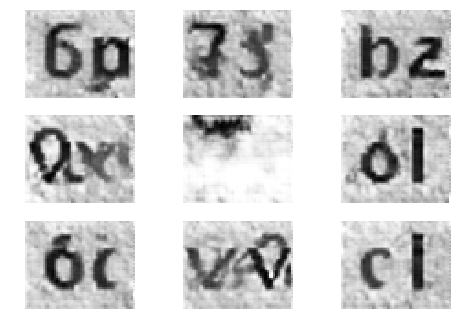

6551 [D loss: 0.544141] [G loss: 2.435861]
6552 [D loss: 0.513629] [G loss: 2.859147]
6553 [D loss: 0.339161] [G loss: 2.266310]
6554 [D loss: 0.470904] [G loss: 2.279783]
6555 [D loss: 0.267228] [G loss: 2.416534]
6556 [D loss: 0.563155] [G loss: 1.252201]
6557 [D loss: 0.176220] [G loss: 2.465386]
6558 [D loss: 0.394643] [G loss: 2.685482]
6559 [D loss: 0.641125] [G loss: 2.117910]
6560 [D loss: 0.437456] [G loss: 2.485713]
6561 [D loss: 0.738023] [G loss: 2.071524]
6562 [D loss: 0.188878] [G loss: 3.227129]
6563 [D loss: 0.676605] [G loss: 3.437249]
6564 [D loss: 0.300259] [G loss: 2.906289]
6565 [D loss: 0.237548] [G loss: 3.146278]
6566 [D loss: 0.650866] [G loss: 2.518523]
6567 [D loss: 0.631090] [G loss: 2.793951]
6568 [D loss: 0.221478] [G loss: 3.031059]
6569 [D loss: 0.736020] [G loss: 2.358514]
6570 [D loss: 0.223789] [G loss: 2.637225]
6571 [D loss: 0.504364] [G loss: 1.953899]
6572 [D loss: 0.602704] [G loss: 2.308722]
6573 [D loss: 0.368058] [G loss: 2.340405]
6574 [D los

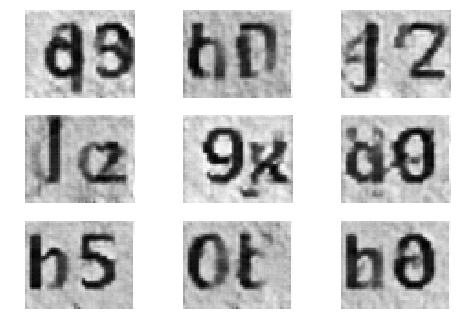

6601 [D loss: 0.446822] [G loss: 2.680953]
6602 [D loss: 0.306558] [G loss: 1.922309]
6603 [D loss: 0.427552] [G loss: 2.227787]
6604 [D loss: 0.638206] [G loss: 2.096996]
6605 [D loss: 0.406602] [G loss: 2.650192]
6606 [D loss: 0.435335] [G loss: 2.390667]
6607 [D loss: 0.377236] [G loss: 3.089393]
6608 [D loss: 0.420503] [G loss: 2.140772]
6609 [D loss: 0.504295] [G loss: 1.795503]
6610 [D loss: 0.430360] [G loss: 2.557523]
6611 [D loss: 0.346920] [G loss: 2.685697]
6612 [D loss: 0.681392] [G loss: 2.295434]
6613 [D loss: 0.480577] [G loss: 2.726358]
6614 [D loss: 0.412589] [G loss: 2.737176]
6615 [D loss: 0.339323] [G loss: 2.630901]
6616 [D loss: 0.404353] [G loss: 2.519856]
6617 [D loss: 0.827815] [G loss: 2.676465]
6618 [D loss: 0.404411] [G loss: 2.605880]
6619 [D loss: 0.513553] [G loss: 2.244518]
6620 [D loss: 0.415906] [G loss: 2.722958]
6621 [D loss: 0.621443] [G loss: 2.290594]
6622 [D loss: 0.291912] [G loss: 3.020427]
6623 [D loss: 0.205320] [G loss: 3.261234]
6624 [D los

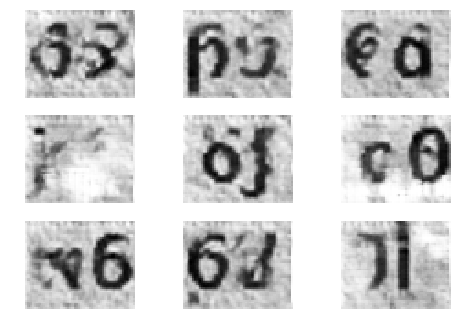

6651 [D loss: 0.435228] [G loss: 2.068142]
6652 [D loss: 0.562865] [G loss: 2.638388]
6653 [D loss: 0.357812] [G loss: 2.781199]
6654 [D loss: 0.513154] [G loss: 2.154005]
6655 [D loss: 0.508429] [G loss: 2.182593]
6656 [D loss: 0.392839] [G loss: 1.751815]
6657 [D loss: 0.615771] [G loss: 2.197956]
6658 [D loss: 0.557793] [G loss: 2.045288]
6659 [D loss: 0.341610] [G loss: 2.365191]
6660 [D loss: 0.448882] [G loss: 2.600313]
6661 [D loss: 0.382992] [G loss: 2.212388]
6662 [D loss: 0.432497] [G loss: 2.130910]
6663 [D loss: 0.441589] [G loss: 2.334301]
6664 [D loss: 0.494649] [G loss: 2.324276]
6665 [D loss: 0.392398] [G loss: 2.515749]
6666 [D loss: 0.510540] [G loss: 2.219798]
6667 [D loss: 0.647927] [G loss: 2.622911]
6668 [D loss: 0.247847] [G loss: 2.727189]
6669 [D loss: 0.507893] [G loss: 2.847224]
6670 [D loss: 0.539744] [G loss: 2.070911]
6671 [D loss: 0.352001] [G loss: 2.454504]
6672 [D loss: 0.400445] [G loss: 2.434493]
6673 [D loss: 0.406047] [G loss: 3.030846]
6674 [D los

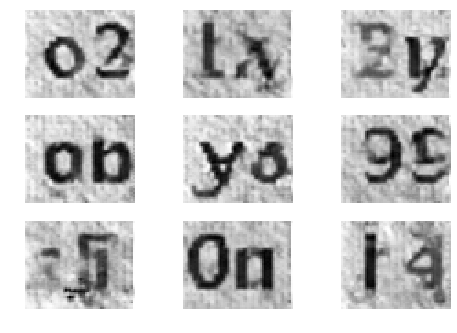

6701 [D loss: 0.579298] [G loss: 2.059350]
6702 [D loss: 0.334723] [G loss: 2.192776]
6703 [D loss: 0.370756] [G loss: 2.070277]
6704 [D loss: 0.261225] [G loss: 2.452428]
6705 [D loss: 0.347058] [G loss: 3.107379]
6706 [D loss: 0.816330] [G loss: 1.979699]
6707 [D loss: 0.200034] [G loss: 2.955160]
6708 [D loss: 0.511587] [G loss: 2.108852]
6709 [D loss: 0.654667] [G loss: 1.966309]
6710 [D loss: 0.291890] [G loss: 2.456260]
6711 [D loss: 0.494728] [G loss: 2.208107]
6712 [D loss: 0.711818] [G loss: 2.114636]
6713 [D loss: 0.382402] [G loss: 2.662433]
6714 [D loss: 0.362810] [G loss: 2.749475]
6715 [D loss: 0.373247] [G loss: 2.200945]
6716 [D loss: 0.477906] [G loss: 3.297403]
6717 [D loss: 0.293965] [G loss: 2.392390]
6718 [D loss: 0.445678] [G loss: 2.457250]
6719 [D loss: 0.865265] [G loss: 2.140765]
6720 [D loss: 0.449695] [G loss: 2.366978]
6721 [D loss: 0.388869] [G loss: 2.617707]
6722 [D loss: 0.590964] [G loss: 3.253342]
6723 [D loss: 0.368018] [G loss: 2.452246]
6724 [D los

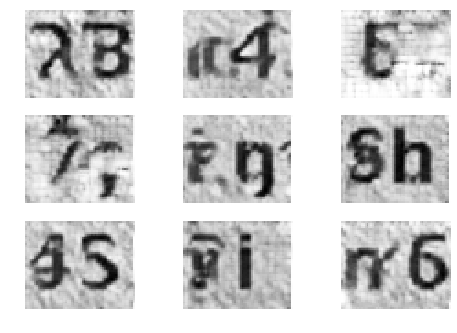

6751 [D loss: 0.429159] [G loss: 2.495250]
6752 [D loss: 0.381194] [G loss: 1.878075]
6753 [D loss: 0.480585] [G loss: 2.581303]
6754 [D loss: 0.420585] [G loss: 2.101666]
6755 [D loss: 0.579775] [G loss: 2.643535]
6756 [D loss: 0.404794] [G loss: 2.787964]
6757 [D loss: 0.429734] [G loss: 2.385782]
6758 [D loss: 0.342043] [G loss: 2.354311]
6759 [D loss: 0.335891] [G loss: 2.097136]
6760 [D loss: 0.352432] [G loss: 2.386243]
6761 [D loss: 0.359439] [G loss: 1.992768]
6762 [D loss: 0.312685] [G loss: 2.216862]
6763 [D loss: 0.484177] [G loss: 2.295975]
6764 [D loss: 0.271255] [G loss: 2.190151]
6765 [D loss: 0.301141] [G loss: 2.656891]
6766 [D loss: 0.429789] [G loss: 2.260448]
6767 [D loss: 0.350552] [G loss: 2.188214]
6768 [D loss: 0.496932] [G loss: 2.656952]
6769 [D loss: 0.402880] [G loss: 2.862119]
6770 [D loss: 0.444001] [G loss: 3.609851]
6771 [D loss: 0.338052] [G loss: 2.812778]
6772 [D loss: 0.406380] [G loss: 2.023663]
6773 [D loss: 0.419075] [G loss: 2.240025]
6774 [D los

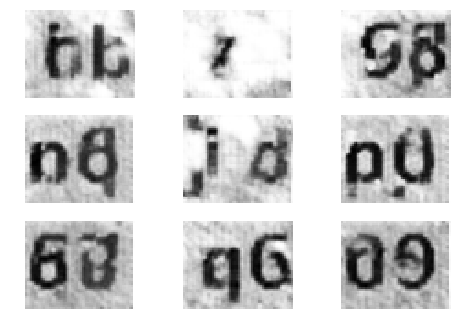

6801 [D loss: 0.320008] [G loss: 2.565012]
6802 [D loss: 0.509899] [G loss: 2.443972]
6803 [D loss: 0.294656] [G loss: 3.077582]
6804 [D loss: 0.609239] [G loss: 2.883253]
6805 [D loss: 0.324611] [G loss: 2.528370]
6806 [D loss: 0.419395] [G loss: 2.153701]
6807 [D loss: 0.463969] [G loss: 1.870480]
6808 [D loss: 0.472017] [G loss: 1.882146]
6809 [D loss: 0.342522] [G loss: 2.592901]
6810 [D loss: 0.222193] [G loss: 3.139191]
6811 [D loss: 0.497532] [G loss: 2.630546]
6812 [D loss: 0.245379] [G loss: 2.988145]
6813 [D loss: 0.527739] [G loss: 2.784196]
6814 [D loss: 0.559711] [G loss: 2.867794]
6815 [D loss: 0.253336] [G loss: 3.409852]
6816 [D loss: 0.183307] [G loss: 3.134695]
6817 [D loss: 0.156796] [G loss: 3.182491]
6818 [D loss: 0.864466] [G loss: 1.919028]
6819 [D loss: 0.272668] [G loss: 2.687047]
6820 [D loss: 0.207556] [G loss: 3.388363]
6821 [D loss: 0.572435] [G loss: 2.598536]
6822 [D loss: 0.224494] [G loss: 2.258563]
6823 [D loss: 0.255036] [G loss: 2.679711]
6824 [D los

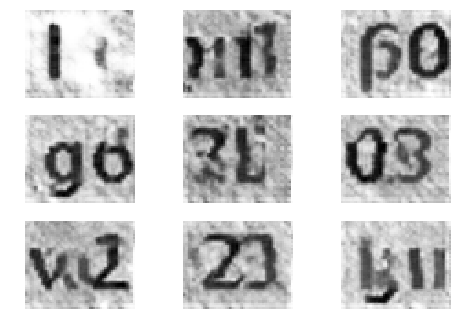

6851 [D loss: 0.248688] [G loss: 3.797595]
6852 [D loss: 0.497593] [G loss: 3.062132]
6853 [D loss: 0.316183] [G loss: 2.356250]
6854 [D loss: 0.672175] [G loss: 2.150914]
6855 [D loss: 0.519644] [G loss: 3.473134]
6856 [D loss: 0.546607] [G loss: 2.603471]
6857 [D loss: 0.722179] [G loss: 2.257219]
6858 [D loss: 0.483570] [G loss: 2.186563]
6859 [D loss: 0.447071] [G loss: 1.933797]
6860 [D loss: 0.474452] [G loss: 2.169948]
6861 [D loss: 0.114820] [G loss: 3.055916]
6862 [D loss: 0.730226] [G loss: 2.897975]
6863 [D loss: 0.335990] [G loss: 2.330054]
6864 [D loss: 0.567032] [G loss: 2.424499]
6865 [D loss: 0.448444] [G loss: 2.678410]
6866 [D loss: 0.677154] [G loss: 2.592428]
6867 [D loss: 0.543120] [G loss: 2.750482]
6868 [D loss: 0.434773] [G loss: 3.064456]
6869 [D loss: 0.435331] [G loss: 2.549449]
6870 [D loss: 0.568632] [G loss: 2.371233]
6871 [D loss: 0.125763] [G loss: 3.748946]
6872 [D loss: 0.587784] [G loss: 2.190859]
6873 [D loss: 0.376044] [G loss: 2.581084]
6874 [D los

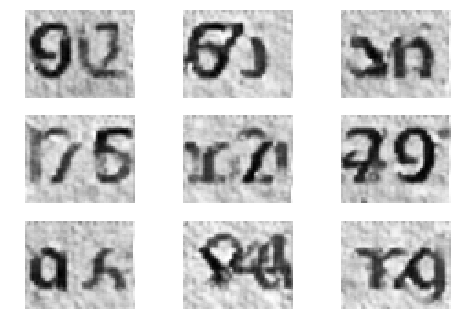

6901 [D loss: 0.263789] [G loss: 2.355609]
6902 [D loss: 0.690696] [G loss: 2.792804]
6903 [D loss: 0.384955] [G loss: 2.976823]
6904 [D loss: 0.595913] [G loss: 2.982278]
6905 [D loss: 0.468759] [G loss: 2.451417]
6906 [D loss: 0.379680] [G loss: 2.395589]
6907 [D loss: 0.534429] [G loss: 2.117522]
6908 [D loss: 0.543453] [G loss: 2.253962]
6909 [D loss: 0.364986] [G loss: 2.033122]
6910 [D loss: 0.523538] [G loss: 2.341335]
6911 [D loss: 0.414197] [G loss: 2.784911]
6912 [D loss: 0.779192] [G loss: 1.929229]
6913 [D loss: 0.548493] [G loss: 1.898572]
6914 [D loss: 0.440782] [G loss: 2.142303]
6915 [D loss: 0.281180] [G loss: 2.319582]
6916 [D loss: 0.515111] [G loss: 2.112320]
6917 [D loss: 0.645192] [G loss: 2.164083]
6918 [D loss: 0.503681] [G loss: 3.033129]
6919 [D loss: 0.335851] [G loss: 2.940212]
6920 [D loss: 0.357297] [G loss: 2.184786]
6921 [D loss: 0.471910] [G loss: 2.656706]
6922 [D loss: 0.352617] [G loss: 2.915880]
6923 [D loss: 0.575098] [G loss: 2.805330]
6924 [D los

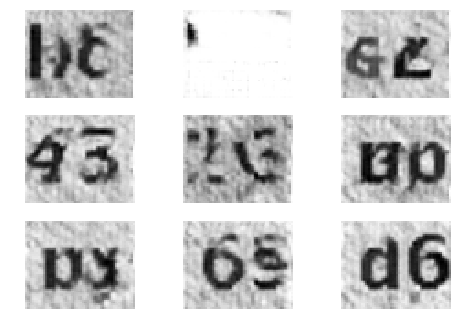

6951 [D loss: 0.486519] [G loss: 3.264149]
6952 [D loss: 0.564222] [G loss: 3.175850]
6953 [D loss: 0.566749] [G loss: 2.521198]
6954 [D loss: 0.504049] [G loss: 2.904063]
6955 [D loss: 0.441917] [G loss: 2.994607]
6956 [D loss: 0.527801] [G loss: 2.504053]
6957 [D loss: 0.268663] [G loss: 2.419305]
6958 [D loss: 0.951508] [G loss: 1.849103]
6959 [D loss: 0.383131] [G loss: 2.398346]
6960 [D loss: 0.726014] [G loss: 2.794955]
6961 [D loss: 0.371521] [G loss: 2.777449]
6962 [D loss: 0.351730] [G loss: 3.147773]
6963 [D loss: 0.594574] [G loss: 2.359842]
6964 [D loss: 0.238515] [G loss: 3.098752]
6965 [D loss: 0.219693] [G loss: 3.058866]
6966 [D loss: 0.336440] [G loss: 2.457048]
6967 [D loss: 0.355154] [G loss: 2.086093]
6968 [D loss: 0.431086] [G loss: 2.281549]
6969 [D loss: 0.437761] [G loss: 1.873906]
6970 [D loss: 0.413200] [G loss: 2.286835]
6971 [D loss: 0.454481] [G loss: 2.702222]
6972 [D loss: 0.526329] [G loss: 2.316839]
6973 [D loss: 0.219330] [G loss: 3.190996]
6974 [D los

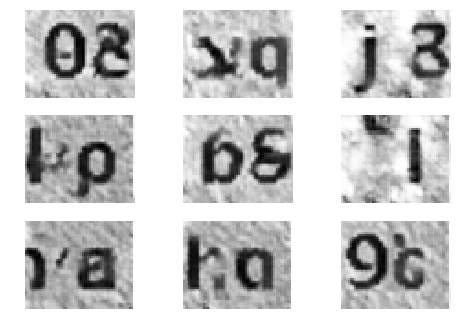

7001 [D loss: 0.413711] [G loss: 3.087644]
7002 [D loss: 0.361774] [G loss: 2.738462]
7003 [D loss: 0.509462] [G loss: 1.697852]
7004 [D loss: 0.419761] [G loss: 2.739801]
7005 [D loss: 0.273195] [G loss: 3.340120]
7006 [D loss: 0.617609] [G loss: 2.799786]
7007 [D loss: 0.237742] [G loss: 2.642512]
7008 [D loss: 0.437510] [G loss: 2.214180]
7009 [D loss: 0.351438] [G loss: 2.786458]
7010 [D loss: 0.580233] [G loss: 2.195474]
7011 [D loss: 0.435177] [G loss: 2.355964]
7012 [D loss: 0.242030] [G loss: 2.984636]
7013 [D loss: 0.694361] [G loss: 2.135038]
7014 [D loss: 0.805289] [G loss: 1.781299]
7015 [D loss: 0.468236] [G loss: 2.205140]
7016 [D loss: 0.307582] [G loss: 2.709338]
7017 [D loss: 0.365710] [G loss: 3.622355]
7018 [D loss: 0.345116] [G loss: 3.371299]
7019 [D loss: 0.677841] [G loss: 2.682723]
7020 [D loss: 0.121795] [G loss: 2.906602]
7021 [D loss: 0.820477] [G loss: 2.106435]
7022 [D loss: 0.457324] [G loss: 2.110762]
7023 [D loss: 0.555539] [G loss: 2.474235]
7024 [D los

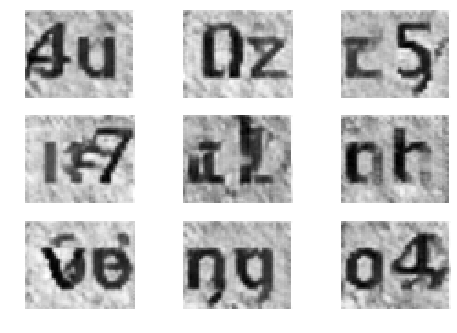

7051 [D loss: 0.541059] [G loss: 2.697090]
7052 [D loss: 0.403714] [G loss: 2.684637]
7053 [D loss: 0.495041] [G loss: 2.253270]
7054 [D loss: 0.386260] [G loss: 2.412835]
7055 [D loss: 0.466740] [G loss: 2.080566]
7056 [D loss: 0.465411] [G loss: 2.879738]
7057 [D loss: 0.471373] [G loss: 2.830981]
7058 [D loss: 0.563849] [G loss: 2.544000]
7059 [D loss: 0.087433] [G loss: 3.524353]
7060 [D loss: 0.242606] [G loss: 3.297449]
7061 [D loss: 0.625207] [G loss: 2.299610]
7062 [D loss: 0.138699] [G loss: 2.939635]
7063 [D loss: 0.316151] [G loss: 3.711135]
7064 [D loss: 0.149047] [G loss: 4.420997]
7065 [D loss: 0.609765] [G loss: 2.541321]
7066 [D loss: 0.398514] [G loss: 1.919417]
7067 [D loss: 0.171983] [G loss: 3.242421]
7068 [D loss: 0.319840] [G loss: 2.518695]
7069 [D loss: 0.631973] [G loss: 1.996111]
7070 [D loss: 0.509445] [G loss: 1.805127]
7071 [D loss: 0.449904] [G loss: 2.159394]
7072 [D loss: 0.172041] [G loss: 2.607707]
7073 [D loss: 0.495304] [G loss: 2.420263]
7074 [D los

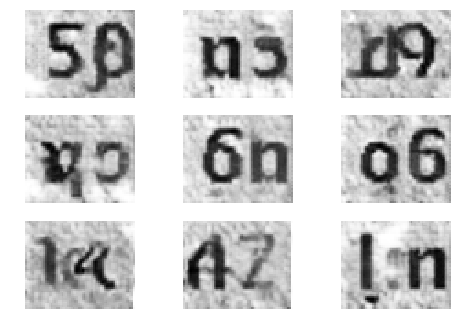

7101 [D loss: 0.177318] [G loss: 3.260275]
7102 [D loss: 0.522909] [G loss: 2.596153]
7103 [D loss: 0.574305] [G loss: 2.019783]
7104 [D loss: 0.186210] [G loss: 3.162327]
7105 [D loss: 0.677617] [G loss: 2.921296]
7106 [D loss: 0.209883] [G loss: 3.011146]
7107 [D loss: 0.688966] [G loss: 2.193854]
7108 [D loss: 0.168377] [G loss: 3.339590]
7109 [D loss: 0.468488] [G loss: 2.093484]
7110 [D loss: 0.423851] [G loss: 2.325880]
7111 [D loss: 0.457117] [G loss: 2.526238]
7112 [D loss: 0.211870] [G loss: 3.253194]
7113 [D loss: 0.099029] [G loss: 3.935394]
7114 [D loss: 0.479748] [G loss: 3.104169]
7115 [D loss: 0.280490] [G loss: 3.289967]
7116 [D loss: 0.506016] [G loss: 2.543954]
7117 [D loss: 0.217242] [G loss: 2.607463]
7118 [D loss: 0.384534] [G loss: 3.026768]
7119 [D loss: 0.555725] [G loss: 2.514984]
7120 [D loss: 0.429619] [G loss: 2.826609]
7121 [D loss: 0.107692] [G loss: 2.874570]
7122 [D loss: 0.608491] [G loss: 2.664220]
7123 [D loss: 0.469215] [G loss: 2.155416]
7124 [D los

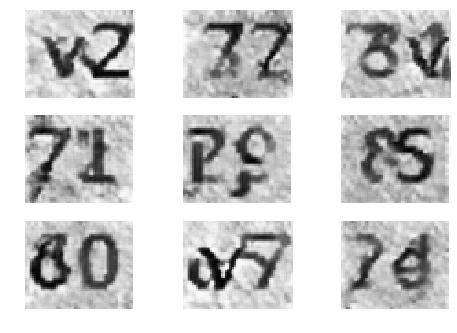

7151 [D loss: 0.216293] [G loss: 3.135880]
7152 [D loss: 0.464451] [G loss: 3.101759]
7153 [D loss: 0.597706] [G loss: 2.612051]
7154 [D loss: 0.186940] [G loss: 3.083492]
7155 [D loss: 0.639700] [G loss: 2.269722]
7156 [D loss: 0.427121] [G loss: 1.750233]
7157 [D loss: 0.194892] [G loss: 2.889642]
7158 [D loss: 0.572273] [G loss: 2.493518]
7159 [D loss: 0.112251] [G loss: 3.106032]
7160 [D loss: 0.613896] [G loss: 2.230457]
7161 [D loss: 0.512656] [G loss: 2.294695]
7162 [D loss: 0.401519] [G loss: 3.211460]
7163 [D loss: 0.087614] [G loss: 4.250274]
7164 [D loss: 0.815669] [G loss: 2.216591]
7165 [D loss: 0.198649] [G loss: 2.627589]
7166 [D loss: 0.336398] [G loss: 3.058353]
7167 [D loss: 0.468588] [G loss: 2.894606]
7168 [D loss: 0.209841] [G loss: 4.002384]
7169 [D loss: 0.558202] [G loss: 2.938668]
7170 [D loss: 0.501371] [G loss: 2.204747]
7171 [D loss: 0.263126] [G loss: 2.153001]
7172 [D loss: 0.568345] [G loss: 2.662953]
7173 [D loss: 0.586120] [G loss: 2.375656]
7174 [D los

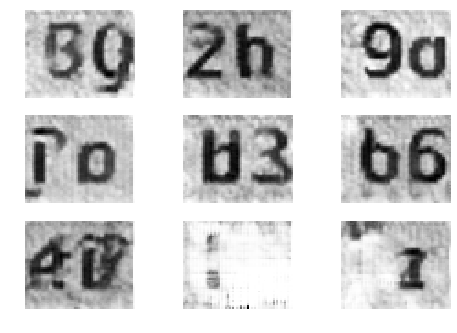

7201 [D loss: 0.450676] [G loss: 2.028044]
7202 [D loss: 0.332287] [G loss: 3.239222]
7203 [D loss: 0.214797] [G loss: 2.785033]
7204 [D loss: 0.328440] [G loss: 2.820740]
7205 [D loss: 0.373540] [G loss: 2.491771]
7206 [D loss: 0.682944] [G loss: 2.154991]
7207 [D loss: 0.579577] [G loss: 1.994444]
7208 [D loss: 0.572858] [G loss: 1.796662]
7209 [D loss: 0.213848] [G loss: 3.117780]
7210 [D loss: 0.792755] [G loss: 1.968284]
7211 [D loss: 0.194024] [G loss: 3.198737]
7212 [D loss: 0.142158] [G loss: 2.458302]
7213 [D loss: 0.426478] [G loss: 3.426205]
7214 [D loss: 0.507892] [G loss: 2.526116]
7215 [D loss: 0.409793] [G loss: 1.593843]
7216 [D loss: 0.416886] [G loss: 1.963267]
7217 [D loss: 0.164787] [G loss: 2.955794]
7218 [D loss: 0.449752] [G loss: 2.695764]
7219 [D loss: 0.466331] [G loss: 2.012533]
7220 [D loss: 0.258749] [G loss: 2.392902]
7221 [D loss: 0.250682] [G loss: 2.870864]
7222 [D loss: 0.374444] [G loss: 3.488076]
7223 [D loss: 0.667769] [G loss: 2.220706]
7224 [D los

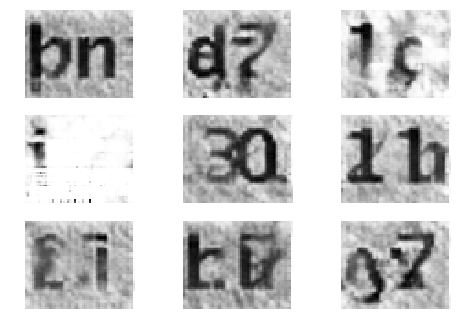

7251 [D loss: 0.482002] [G loss: 2.772905]
7252 [D loss: 0.602458] [G loss: 1.998609]
7253 [D loss: 0.482664] [G loss: 2.350077]
7254 [D loss: 0.412992] [G loss: 2.113703]
7255 [D loss: 0.420675] [G loss: 2.662112]
7256 [D loss: 0.437770] [G loss: 2.926124]
7257 [D loss: 0.176074] [G loss: 2.981695]
7258 [D loss: 0.394973] [G loss: 2.414631]
7259 [D loss: 0.555912] [G loss: 2.242107]
7260 [D loss: 0.330902] [G loss: 1.963207]
7261 [D loss: 0.362480] [G loss: 2.758540]
7262 [D loss: 0.372869] [G loss: 3.084691]
7263 [D loss: 0.443866] [G loss: 2.650875]
7264 [D loss: 0.421236] [G loss: 1.980531]
7265 [D loss: 0.551414] [G loss: 2.517801]
7266 [D loss: 0.432828] [G loss: 2.852341]
7267 [D loss: 0.132992] [G loss: 4.205541]
7268 [D loss: 0.613120] [G loss: 2.707990]
7269 [D loss: 0.539965] [G loss: 2.046324]
7270 [D loss: 0.606740] [G loss: 2.509106]
7271 [D loss: 0.274237] [G loss: 2.107836]
7272 [D loss: 0.596834] [G loss: 2.304917]
7273 [D loss: 0.375844] [G loss: 2.795397]
7274 [D los

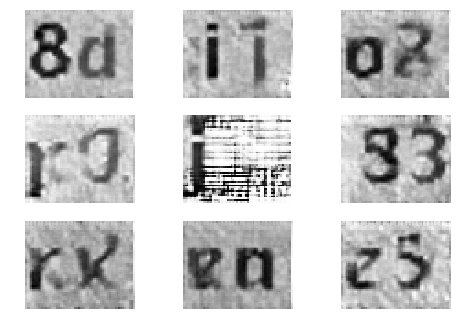

7301 [D loss: 0.772286] [G loss: 2.669144]
7302 [D loss: 0.481896] [G loss: 2.114655]
7303 [D loss: 0.277152] [G loss: 2.979987]
7304 [D loss: 0.397771] [G loss: 2.701225]
7305 [D loss: 0.453309] [G loss: 2.228916]
7306 [D loss: 0.511177] [G loss: 2.732550]
7307 [D loss: 0.318883] [G loss: 3.008802]
7308 [D loss: 0.642059] [G loss: 2.459961]
7309 [D loss: 0.434493] [G loss: 2.649576]
7310 [D loss: 0.440373] [G loss: 2.857601]
7311 [D loss: 0.412046] [G loss: 2.780702]
7312 [D loss: 0.447227] [G loss: 2.779862]
7313 [D loss: 0.333451] [G loss: 2.040990]
7314 [D loss: 0.384062] [G loss: 2.238191]
7315 [D loss: 0.631520] [G loss: 2.028663]
7316 [D loss: 0.376886] [G loss: 3.131680]
7317 [D loss: 0.453913] [G loss: 3.232518]
7318 [D loss: 0.558082] [G loss: 2.570923]
7319 [D loss: 0.444088] [G loss: 2.299842]
7320 [D loss: 0.617212] [G loss: 2.276343]
7321 [D loss: 0.335329] [G loss: 2.755936]
7322 [D loss: 0.419408] [G loss: 2.875922]
7323 [D loss: 0.571485] [G loss: 2.388011]
7324 [D los

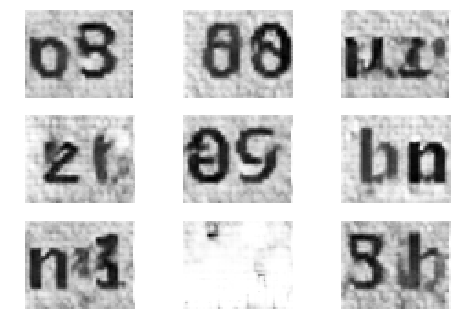

7351 [D loss: 0.222904] [G loss: 3.223001]
7352 [D loss: 0.318682] [G loss: 2.123380]
7353 [D loss: 0.393267] [G loss: 3.094907]
7354 [D loss: 0.201961] [G loss: 2.964546]
7355 [D loss: 0.597783] [G loss: 2.545099]
7356 [D loss: 0.177234] [G loss: 3.047462]
7357 [D loss: 0.393270] [G loss: 2.617561]
7358 [D loss: 0.689170] [G loss: 2.936524]
7359 [D loss: 0.310676] [G loss: 3.626553]
7360 [D loss: 0.523475] [G loss: 2.761423]
7361 [D loss: 0.411590] [G loss: 2.062418]
7362 [D loss: 0.272332] [G loss: 3.079310]
7363 [D loss: 0.303016] [G loss: 2.351857]
7364 [D loss: 0.491524] [G loss: 2.771351]
7365 [D loss: 0.643830] [G loss: 2.125777]
7366 [D loss: 0.425838] [G loss: 3.340436]
7367 [D loss: 0.303313] [G loss: 2.819616]
7368 [D loss: 0.487415] [G loss: 2.127921]
7369 [D loss: 0.197813] [G loss: 2.403795]
7370 [D loss: 0.839189] [G loss: 3.018581]
7371 [D loss: 0.268073] [G loss: 2.873331]
7372 [D loss: 0.430712] [G loss: 1.890460]
7373 [D loss: 0.288884] [G loss: 2.436321]
7374 [D los

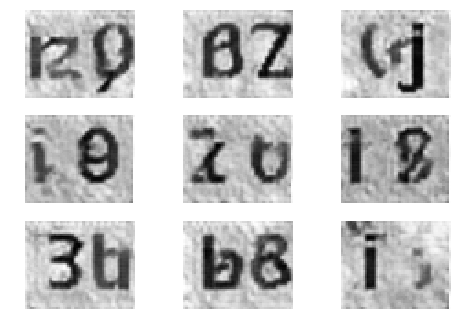

7401 [D loss: 0.196307] [G loss: 2.980340]
7402 [D loss: 0.500568] [G loss: 2.243571]
7403 [D loss: 0.355606] [G loss: 2.961538]
7404 [D loss: 0.183239] [G loss: 3.052929]
7405 [D loss: 0.159170] [G loss: 3.699947]
7406 [D loss: 0.078479] [G loss: 3.864295]
7407 [D loss: 0.506935] [G loss: 2.817437]
7408 [D loss: 0.208554] [G loss: 3.380787]
7409 [D loss: 0.160244] [G loss: 2.915880]
7410 [D loss: 0.411001] [G loss: 2.627994]
7411 [D loss: 0.176943] [G loss: 3.748054]
7412 [D loss: 0.164349] [G loss: 3.627138]
7413 [D loss: 0.788572] [G loss: 3.118348]
7414 [D loss: 0.126476] [G loss: 2.331495]
7415 [D loss: 0.179573] [G loss: 3.549382]
7416 [D loss: 0.650621] [G loss: 1.796983]
7417 [D loss: 0.694719] [G loss: 2.077330]
7418 [D loss: 0.348859] [G loss: 2.677438]
7419 [D loss: 0.141364] [G loss: 2.698151]
7420 [D loss: 0.148931] [G loss: 3.789888]
7421 [D loss: 0.461479] [G loss: 2.771540]
7422 [D loss: 0.514632] [G loss: 2.087758]
7423 [D loss: 0.121897] [G loss: 2.972477]
7424 [D los

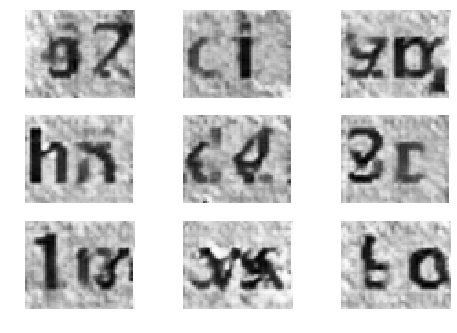

7451 [D loss: 0.381768] [G loss: 3.244478]
7452 [D loss: 0.431781] [G loss: 2.242177]
7453 [D loss: 0.427308] [G loss: 2.053502]
7454 [D loss: 0.359330] [G loss: 2.690705]
7455 [D loss: 0.323632] [G loss: 2.936004]
7456 [D loss: 0.501106] [G loss: 2.441212]
7457 [D loss: 0.378310] [G loss: 2.171967]
7458 [D loss: 0.697334] [G loss: 2.784304]
7459 [D loss: 0.679716] [G loss: 2.409177]
7460 [D loss: 0.205576] [G loss: 3.003141]
7461 [D loss: 0.524030] [G loss: 2.426514]
7462 [D loss: 0.291056] [G loss: 2.964880]
7463 [D loss: 0.272642] [G loss: 2.260316]
7464 [D loss: 0.455493] [G loss: 2.210493]
7465 [D loss: 0.544501] [G loss: 2.360660]
7466 [D loss: 0.505848] [G loss: 1.512290]
7467 [D loss: 0.747690] [G loss: 2.396980]
7468 [D loss: 1.118582] [G loss: 1.016014]
7469 [D loss: 0.796136] [G loss: 1.936369]
7470 [D loss: 0.389355] [G loss: 2.510752]
7471 [D loss: 0.326933] [G loss: 2.870909]
7472 [D loss: 0.382572] [G loss: 2.446116]
7473 [D loss: 0.610515] [G loss: 1.899860]
7474 [D los

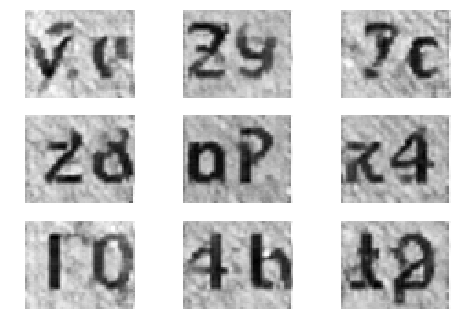

7501 [D loss: 0.702599] [G loss: 2.116060]
7502 [D loss: 0.453471] [G loss: 2.111171]
7503 [D loss: 0.354693] [G loss: 2.725122]
7504 [D loss: 0.477166] [G loss: 2.425590]
7505 [D loss: 0.331802] [G loss: 2.526439]
7506 [D loss: 0.488812] [G loss: 2.108851]
7507 [D loss: 0.469604] [G loss: 2.675354]
7508 [D loss: 0.492409] [G loss: 2.473439]
7509 [D loss: 0.258510] [G loss: 2.783881]
7510 [D loss: 0.513865] [G loss: 2.750729]
7511 [D loss: 0.256597] [G loss: 2.750592]
7512 [D loss: 0.686614] [G loss: 2.977527]
7513 [D loss: 0.266569] [G loss: 2.402007]
7514 [D loss: 0.318523] [G loss: 3.043877]
7515 [D loss: 0.541363] [G loss: 2.194640]
7516 [D loss: 0.537757] [G loss: 2.643488]
7517 [D loss: 0.227888] [G loss: 2.960508]
7518 [D loss: 0.286861] [G loss: 2.906798]
7519 [D loss: 0.676767] [G loss: 3.034871]
7520 [D loss: 0.331765] [G loss: 2.584372]
7521 [D loss: 0.342691] [G loss: 2.910981]
7522 [D loss: 0.272481] [G loss: 3.393067]
7523 [D loss: 0.454901] [G loss: 2.373185]
7524 [D los

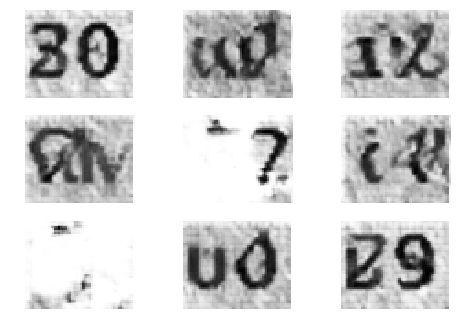

7551 [D loss: 0.467340] [G loss: 3.414671]
7552 [D loss: 0.395648] [G loss: 2.242821]
7553 [D loss: 0.316868] [G loss: 2.596284]
7554 [D loss: 0.157918] [G loss: 3.284671]
7555 [D loss: 0.274757] [G loss: 3.344432]
7556 [D loss: 0.430400] [G loss: 2.776986]
7557 [D loss: 0.337386] [G loss: 2.516821]
7558 [D loss: 0.424015] [G loss: 2.695791]
7559 [D loss: 0.440196] [G loss: 2.859048]
7560 [D loss: 0.402385] [G loss: 2.629942]
7561 [D loss: 0.420815] [G loss: 3.813028]
7562 [D loss: 0.392671] [G loss: 3.831685]
7563 [D loss: 0.476483] [G loss: 3.094858]
7564 [D loss: 0.618978] [G loss: 3.248172]
7565 [D loss: 0.526734] [G loss: 2.324567]
7566 [D loss: 0.612428] [G loss: 2.381104]
7567 [D loss: 0.186701] [G loss: 3.124549]
7568 [D loss: 0.152243] [G loss: 3.415544]
7569 [D loss: 0.701256] [G loss: 1.993852]
7570 [D loss: 0.759624] [G loss: 1.337971]
7571 [D loss: 0.427256] [G loss: 2.436564]
7572 [D loss: 0.629871] [G loss: 2.201488]
7573 [D loss: 0.448226] [G loss: 1.436822]
7574 [D los

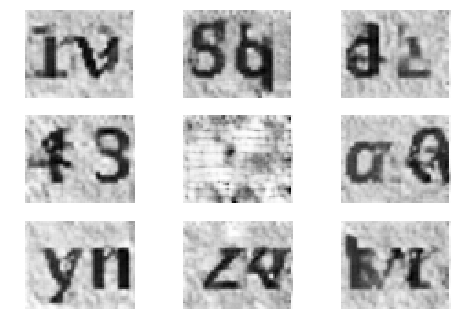

7601 [D loss: 0.399786] [G loss: 2.902308]
7602 [D loss: 0.361165] [G loss: 2.392810]
7603 [D loss: 0.432447] [G loss: 2.629869]
7604 [D loss: 0.546243] [G loss: 2.892240]
7605 [D loss: 0.395282] [G loss: 2.391775]
7606 [D loss: 0.540738] [G loss: 2.982354]
7607 [D loss: 0.584646] [G loss: 2.674078]
7608 [D loss: 0.333251] [G loss: 2.315912]
7609 [D loss: 0.560131] [G loss: 2.034008]
7610 [D loss: 0.391737] [G loss: 2.266725]
7611 [D loss: 0.211533] [G loss: 2.109711]
7612 [D loss: 0.352420] [G loss: 1.847634]
7613 [D loss: 0.455338] [G loss: 2.542338]
7614 [D loss: 0.553472] [G loss: 2.898636]
7615 [D loss: 0.444380] [G loss: 2.082962]
7616 [D loss: 0.543207] [G loss: 2.290504]
7617 [D loss: 0.390018] [G loss: 3.437516]
7618 [D loss: 0.485712] [G loss: 2.909116]
7619 [D loss: 0.413808] [G loss: 2.960328]
7620 [D loss: 0.638089] [G loss: 2.773567]
7621 [D loss: 0.562494] [G loss: 3.143075]
7622 [D loss: 0.403661] [G loss: 3.663490]
7623 [D loss: 0.296055] [G loss: 2.916906]
7624 [D los

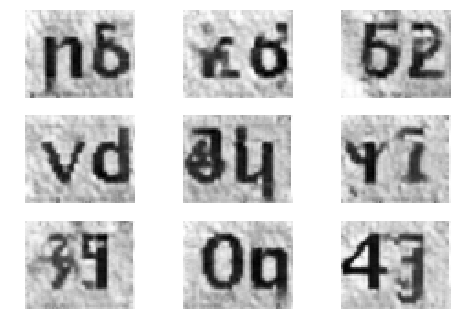

7651 [D loss: 0.407481] [G loss: 2.432529]
7652 [D loss: 0.385015] [G loss: 2.688683]
7653 [D loss: 0.380286] [G loss: 2.278842]
7654 [D loss: 0.592047] [G loss: 2.508523]
7655 [D loss: 0.366633] [G loss: 2.655645]
7656 [D loss: 0.279320] [G loss: 2.817164]
7657 [D loss: 0.360350] [G loss: 3.182185]
7658 [D loss: 0.460890] [G loss: 2.323287]
7659 [D loss: 0.456427] [G loss: 2.434998]
7660 [D loss: 0.628012] [G loss: 2.112436]
7661 [D loss: 0.279385] [G loss: 2.987149]
7662 [D loss: 0.412886] [G loss: 2.706831]
7663 [D loss: 0.586331] [G loss: 2.365181]
7664 [D loss: 0.540751] [G loss: 2.405589]
7665 [D loss: 0.375050] [G loss: 3.096829]
7666 [D loss: 0.442735] [G loss: 2.640933]
7667 [D loss: 0.337780] [G loss: 2.765163]
7668 [D loss: 0.279314] [G loss: 3.457264]
7669 [D loss: 0.328130] [G loss: 3.080253]
7670 [D loss: 0.362122] [G loss: 3.210931]
7671 [D loss: 0.197146] [G loss: 2.943435]
7672 [D loss: 0.551004] [G loss: 1.838853]
7673 [D loss: 0.412320] [G loss: 3.523726]
7674 [D los

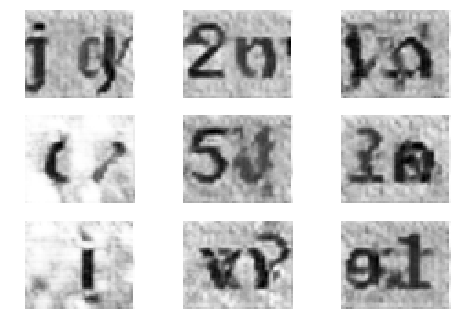

7701 [D loss: 0.174092] [G loss: 3.593552]
7702 [D loss: 0.123987] [G loss: 3.837537]
7703 [D loss: 0.633970] [G loss: 2.226983]
7704 [D loss: 0.489432] [G loss: 2.422547]
7705 [D loss: 0.363984] [G loss: 2.770078]
7706 [D loss: 0.434823] [G loss: 2.474890]
7707 [D loss: 0.470854] [G loss: 2.554457]
7708 [D loss: 0.415075] [G loss: 2.169159]
7709 [D loss: 0.411888] [G loss: 2.606766]
7710 [D loss: 0.144096] [G loss: 3.365507]
7711 [D loss: 0.741238] [G loss: 2.137120]
7712 [D loss: 0.434277] [G loss: 1.736685]
7713 [D loss: 0.294086] [G loss: 2.716005]
7714 [D loss: 0.184041] [G loss: 2.973593]
7715 [D loss: 0.509837] [G loss: 2.018952]
7716 [D loss: 0.894862] [G loss: 2.063970]
7717 [D loss: 0.803839] [G loss: 1.317204]
7718 [D loss: 0.419813] [G loss: 1.651769]
7719 [D loss: 0.711605] [G loss: 2.223299]
7720 [D loss: 0.430446] [G loss: 1.658516]
7721 [D loss: 0.638837] [G loss: 2.104455]
7722 [D loss: 0.463288] [G loss: 2.763626]
7723 [D loss: 0.574969] [G loss: 1.795991]
7724 [D los

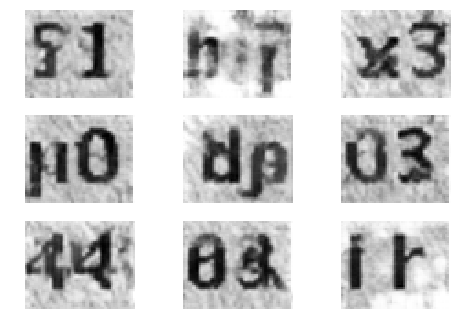

7751 [D loss: 0.428113] [G loss: 2.321372]
7752 [D loss: 0.346509] [G loss: 2.419317]
7753 [D loss: 0.458507] [G loss: 2.270610]
7754 [D loss: 0.542604] [G loss: 3.270829]
7755 [D loss: 0.481023] [G loss: 2.707821]
7756 [D loss: 0.448242] [G loss: 3.000909]
7757 [D loss: 0.218007] [G loss: 2.910172]
7758 [D loss: 0.390195] [G loss: 3.190831]
7759 [D loss: 0.516975] [G loss: 2.225915]
7760 [D loss: 0.337187] [G loss: 3.380183]
7761 [D loss: 0.507268] [G loss: 2.859734]
7762 [D loss: 0.304933] [G loss: 2.400683]
7763 [D loss: 0.447682] [G loss: 2.835857]
7764 [D loss: 0.778699] [G loss: 2.727650]
7765 [D loss: 0.290188] [G loss: 3.364685]
7766 [D loss: 0.727035] [G loss: 1.909420]
7767 [D loss: 0.455871] [G loss: 2.558467]
7768 [D loss: 0.506822] [G loss: 2.439363]
7769 [D loss: 0.543600] [G loss: 2.629766]
7770 [D loss: 0.323799] [G loss: 2.376993]
7771 [D loss: 0.373568] [G loss: 3.109710]
7772 [D loss: 0.301559] [G loss: 2.658310]
7773 [D loss: 0.360166] [G loss: 2.526051]
7774 [D los

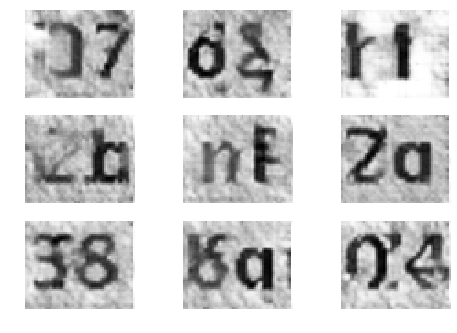

7801 [D loss: 0.164881] [G loss: 3.398269]
7802 [D loss: 0.516924] [G loss: 3.186492]
7803 [D loss: 0.597906] [G loss: 2.567295]
7804 [D loss: 0.573762] [G loss: 1.907835]
7805 [D loss: 0.512600] [G loss: 2.458229]
7806 [D loss: 0.143388] [G loss: 3.461795]
7807 [D loss: 0.308573] [G loss: 2.877371]
7808 [D loss: 0.688248] [G loss: 2.332124]
7809 [D loss: 0.302139] [G loss: 3.426395]
7810 [D loss: 0.147198] [G loss: 3.996613]
7811 [D loss: 0.160435] [G loss: 3.294430]
7812 [D loss: 0.826801] [G loss: 2.379331]
7813 [D loss: 0.472475] [G loss: 2.542752]
7814 [D loss: 0.588110] [G loss: 2.018290]
7815 [D loss: 0.149249] [G loss: 3.379814]
7816 [D loss: 0.589432] [G loss: 2.910717]
7817 [D loss: 0.175318] [G loss: 2.390203]
7818 [D loss: 0.776010] [G loss: 2.074782]
7819 [D loss: 0.482093] [G loss: 1.986851]
7820 [D loss: 0.374523] [G loss: 2.596887]
7821 [D loss: 0.387976] [G loss: 2.718575]
7822 [D loss: 0.544294] [G loss: 1.672135]
7823 [D loss: 0.478015] [G loss: 2.457166]
7824 [D los

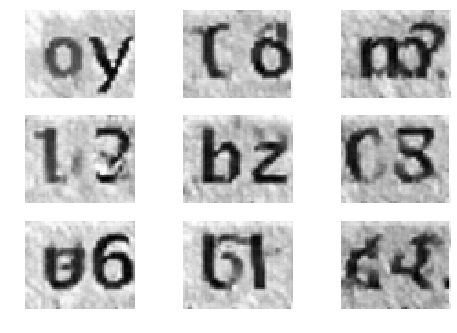

7851 [D loss: 0.430438] [G loss: 2.616359]
7852 [D loss: 0.433352] [G loss: 2.556042]
7853 [D loss: 0.576083] [G loss: 2.296319]
7854 [D loss: 0.493602] [G loss: 2.711767]
7855 [D loss: 0.355851] [G loss: 2.843207]
7856 [D loss: 0.154686] [G loss: 2.560188]
7857 [D loss: 0.486278] [G loss: 2.287349]
7858 [D loss: 0.392332] [G loss: 2.213956]
7859 [D loss: 0.356701] [G loss: 3.006077]
7860 [D loss: 0.503648] [G loss: 2.393455]
7861 [D loss: 0.448556] [G loss: 2.872241]
7862 [D loss: 0.300473] [G loss: 2.395415]
7863 [D loss: 0.563556] [G loss: 2.352392]
7864 [D loss: 0.163442] [G loss: 3.426677]
7865 [D loss: 0.574148] [G loss: 3.651478]
7866 [D loss: 0.164165] [G loss: 2.860759]
7867 [D loss: 0.624633] [G loss: 2.761023]
7868 [D loss: 0.153996] [G loss: 3.641454]
7869 [D loss: 0.547731] [G loss: 2.994520]
7870 [D loss: 0.328209] [G loss: 3.348792]
7871 [D loss: 0.354418] [G loss: 2.484919]
7872 [D loss: 0.553713] [G loss: 2.706717]
7873 [D loss: 0.389678] [G loss: 2.351813]
7874 [D los

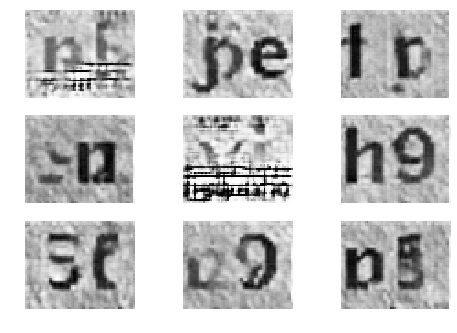

7901 [D loss: 0.286915] [G loss: 3.232152]
7902 [D loss: 0.643413] [G loss: 1.410554]
7903 [D loss: 0.283589] [G loss: 2.852927]
7904 [D loss: 0.547620] [G loss: 2.500069]
7905 [D loss: 0.570545] [G loss: 1.799199]
7906 [D loss: 0.595700] [G loss: 1.937691]
7907 [D loss: 0.411435] [G loss: 2.561866]
7908 [D loss: 0.593830] [G loss: 2.517830]
7909 [D loss: 0.295912] [G loss: 2.170579]
7910 [D loss: 0.235119] [G loss: 2.964859]
7911 [D loss: 0.433465] [G loss: 2.449809]
7912 [D loss: 0.369377] [G loss: 2.502772]
7913 [D loss: 0.342138] [G loss: 2.473181]
7914 [D loss: 0.651129] [G loss: 2.404430]
7915 [D loss: 0.385547] [G loss: 1.753305]
7916 [D loss: 0.521065] [G loss: 1.797718]
7917 [D loss: 0.369589] [G loss: 2.627023]
7918 [D loss: 0.399390] [G loss: 2.929212]
7919 [D loss: 0.624201] [G loss: 2.281764]
7920 [D loss: 0.447564] [G loss: 2.468088]
7921 [D loss: 0.710587] [G loss: 2.482804]
7922 [D loss: 0.494235] [G loss: 3.041255]
7923 [D loss: 0.966159] [G loss: 1.657071]
7924 [D los

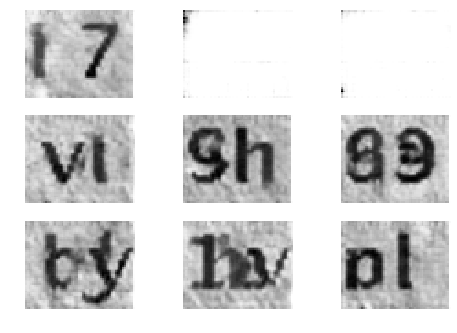

7951 [D loss: 0.290084] [G loss: 3.289236]
7952 [D loss: 0.466960] [G loss: 2.770564]
7953 [D loss: 0.474327] [G loss: 3.255086]
7954 [D loss: 0.565122] [G loss: 2.986405]
7955 [D loss: 0.250890] [G loss: 2.648088]
7956 [D loss: 0.369315] [G loss: 2.715330]
7957 [D loss: 0.559446] [G loss: 2.145433]
7958 [D loss: 0.293965] [G loss: 2.683441]
7959 [D loss: 0.864435] [G loss: 2.400575]
7960 [D loss: 0.241951] [G loss: 2.702494]
7961 [D loss: 0.472533] [G loss: 3.047370]
7962 [D loss: 0.240886] [G loss: 2.085773]
7963 [D loss: 0.270528] [G loss: 2.937203]
7964 [D loss: 0.550197] [G loss: 2.808995]
7965 [D loss: 0.577565] [G loss: 2.164726]
7966 [D loss: 0.546273] [G loss: 2.158935]
7967 [D loss: 0.306249] [G loss: 3.308759]
7968 [D loss: 0.726142] [G loss: 2.641342]
7969 [D loss: 0.424159] [G loss: 2.672538]
7970 [D loss: 0.346513] [G loss: 2.423224]
7971 [D loss: 0.290009] [G loss: 2.834783]
7972 [D loss: 0.409511] [G loss: 2.757892]
7973 [D loss: 0.194541] [G loss: 2.601336]
7974 [D los

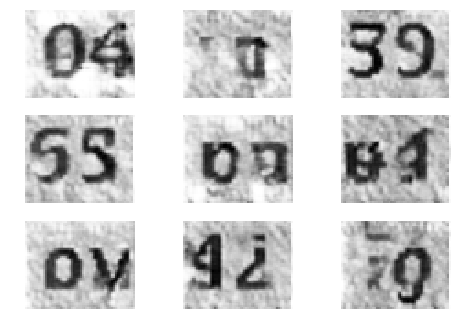

8001 [D loss: 0.166711] [G loss: 3.499416]
8002 [D loss: 0.452494] [G loss: 2.867035]
8003 [D loss: 0.103490] [G loss: 2.591529]
8004 [D loss: 0.137570] [G loss: 3.070875]
8005 [D loss: 0.434298] [G loss: 2.902698]
8006 [D loss: 0.653901] [G loss: 2.075003]
8007 [D loss: 0.408580] [G loss: 2.690716]
8008 [D loss: 0.196113] [G loss: 2.562562]
8009 [D loss: 0.226093] [G loss: 3.485301]
8010 [D loss: 0.676947] [G loss: 2.584855]
8011 [D loss: 0.366475] [G loss: 2.549685]
8012 [D loss: 0.175488] [G loss: 2.878425]
8013 [D loss: 0.417265] [G loss: 2.557170]
8014 [D loss: 0.610417] [G loss: 2.109151]
8015 [D loss: 0.193595] [G loss: 2.734444]
8016 [D loss: 0.599265] [G loss: 2.450229]
8017 [D loss: 0.563528] [G loss: 1.635578]
8018 [D loss: 0.564499] [G loss: 1.807820]
8019 [D loss: 0.541866] [G loss: 1.855272]
8020 [D loss: 0.136606] [G loss: 3.332130]
8021 [D loss: 0.295480] [G loss: 3.478379]
8022 [D loss: 0.685587] [G loss: 2.843588]
8023 [D loss: 0.456594] [G loss: 1.935888]
8024 [D los

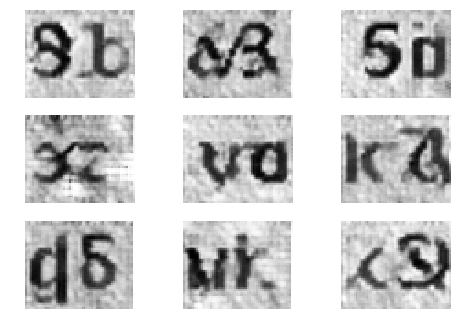

8051 [D loss: 0.302367] [G loss: 1.914641]
8052 [D loss: 0.816448] [G loss: 1.510072]
8053 [D loss: 0.214029] [G loss: 2.733203]
8054 [D loss: 0.366219] [G loss: 2.536581]
8055 [D loss: 0.304830] [G loss: 2.212480]
8056 [D loss: 0.565125] [G loss: 2.521363]
8057 [D loss: 0.713607] [G loss: 2.474092]
8058 [D loss: 0.422621] [G loss: 2.611002]
8059 [D loss: 0.677469] [G loss: 2.250668]
8060 [D loss: 0.358068] [G loss: 3.064825]
8061 [D loss: 0.423694] [G loss: 2.564951]
8062 [D loss: 0.401743] [G loss: 2.357274]
8063 [D loss: 0.431779] [G loss: 2.547773]
8064 [D loss: 0.418060] [G loss: 2.741554]
8065 [D loss: 0.607891] [G loss: 2.524472]
8066 [D loss: 0.264672] [G loss: 2.448658]
8067 [D loss: 0.277307] [G loss: 3.236440]
8068 [D loss: 0.359081] [G loss: 2.940573]
8069 [D loss: 0.687664] [G loss: 1.922827]
8070 [D loss: 0.436982] [G loss: 2.741303]
8071 [D loss: 0.397439] [G loss: 2.442517]
8072 [D loss: 0.389330] [G loss: 2.324533]
8073 [D loss: 0.426036] [G loss: 2.170351]
8074 [D los

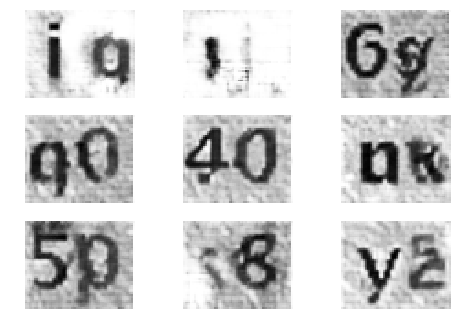

8101 [D loss: 0.372983] [G loss: 2.727067]
8102 [D loss: 0.278490] [G loss: 2.592924]
8103 [D loss: 0.326010] [G loss: 2.814349]
8104 [D loss: 0.248368] [G loss: 3.267472]
8105 [D loss: 0.514741] [G loss: 1.649149]
8106 [D loss: 0.442810] [G loss: 3.446603]
8107 [D loss: 0.165303] [G loss: 3.046545]
8108 [D loss: 0.520924] [G loss: 2.071382]
8109 [D loss: 0.321044] [G loss: 2.110329]
8110 [D loss: 0.467555] [G loss: 2.421305]
8111 [D loss: 0.173156] [G loss: 2.821419]
8112 [D loss: 0.471088] [G loss: 2.461052]
8113 [D loss: 0.340399] [G loss: 2.749992]
8114 [D loss: 0.304709] [G loss: 2.482385]
8115 [D loss: 0.364109] [G loss: 3.106327]
8116 [D loss: 0.288080] [G loss: 3.185713]
8117 [D loss: 0.825985] [G loss: 2.104418]
8118 [D loss: 0.394998] [G loss: 3.188852]
8119 [D loss: 0.405279] [G loss: 1.989179]
8120 [D loss: 0.296205] [G loss: 3.066397]
8121 [D loss: 0.475923] [G loss: 2.937774]
8122 [D loss: 0.365628] [G loss: 3.179492]
8123 [D loss: 0.385320] [G loss: 2.528705]
8124 [D los

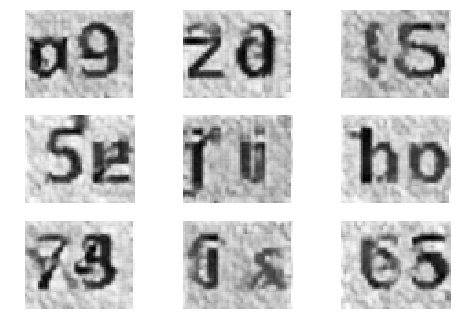

8151 [D loss: 0.259735] [G loss: 2.782300]
8152 [D loss: 0.552196] [G loss: 2.435012]
8153 [D loss: 0.378731] [G loss: 2.200771]
8154 [D loss: 0.510617] [G loss: 2.463506]
8155 [D loss: 0.227691] [G loss: 2.783519]
8156 [D loss: 0.248222] [G loss: 2.668568]
8157 [D loss: 0.468881] [G loss: 1.724995]
8158 [D loss: 0.318580] [G loss: 2.504856]
8159 [D loss: 0.314584] [G loss: 3.222145]
8160 [D loss: 0.342452] [G loss: 2.066063]
8161 [D loss: 0.600777] [G loss: 1.793274]
8162 [D loss: 0.313354] [G loss: 2.258427]
8163 [D loss: 0.425223] [G loss: 2.038618]
8164 [D loss: 0.213718] [G loss: 2.703873]
8165 [D loss: 0.321293] [G loss: 3.209102]
8166 [D loss: 0.551509] [G loss: 2.287810]
8167 [D loss: 0.508421] [G loss: 2.466432]
8168 [D loss: 0.317935] [G loss: 3.058355]
8169 [D loss: 0.304835] [G loss: 2.842097]
8170 [D loss: 0.455041] [G loss: 2.627352]
8171 [D loss: 0.398999] [G loss: 2.734446]
8172 [D loss: 0.364128] [G loss: 3.261887]
8173 [D loss: 0.340678] [G loss: 2.315058]
8174 [D los

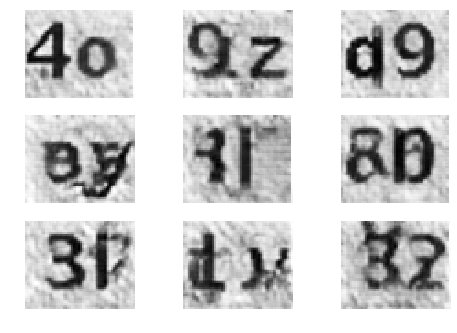

8201 [D loss: 0.694696] [G loss: 2.383543]
8202 [D loss: 0.249477] [G loss: 3.515264]
8203 [D loss: 0.431479] [G loss: 2.223991]
8204 [D loss: 0.585220] [G loss: 2.384972]
8205 [D loss: 0.426083] [G loss: 3.742623]
8206 [D loss: 0.642960] [G loss: 3.080013]
8207 [D loss: 0.338319] [G loss: 2.067918]
8208 [D loss: 0.322300] [G loss: 3.054233]
8209 [D loss: 0.415797] [G loss: 2.391719]
8210 [D loss: 0.262319] [G loss: 3.250789]
8211 [D loss: 0.215743] [G loss: 3.427676]
8212 [D loss: 0.421154] [G loss: 2.643180]
8213 [D loss: 0.341965] [G loss: 2.998801]
8214 [D loss: 0.271543] [G loss: 4.119315]
8215 [D loss: 0.739990] [G loss: 2.223471]
8216 [D loss: 0.570214] [G loss: 2.533214]
8217 [D loss: 0.454365] [G loss: 2.347774]
8218 [D loss: 0.284111] [G loss: 2.497538]
8219 [D loss: 0.403111] [G loss: 2.204236]
8220 [D loss: 0.321102] [G loss: 2.752173]
8221 [D loss: 0.441336] [G loss: 2.007206]
8222 [D loss: 0.283827] [G loss: 2.173631]
8223 [D loss: 0.146033] [G loss: 3.915313]
8224 [D los

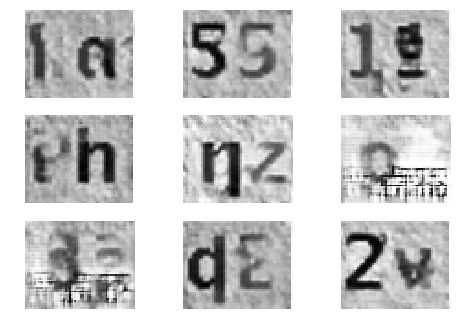

8251 [D loss: 0.365318] [G loss: 2.418496]
8252 [D loss: 0.324739] [G loss: 1.969608]
8253 [D loss: 0.420977] [G loss: 2.170899]
8254 [D loss: 0.501444] [G loss: 2.843810]
8255 [D loss: 0.377708] [G loss: 2.376727]
8256 [D loss: 0.471176] [G loss: 1.609999]
8257 [D loss: 0.487042] [G loss: 2.744355]
8258 [D loss: 0.331564] [G loss: 2.896060]
8259 [D loss: 0.252611] [G loss: 2.192246]
8260 [D loss: 0.511761] [G loss: 2.942098]
8261 [D loss: 0.719602] [G loss: 2.733073]
8262 [D loss: 0.379601] [G loss: 3.266211]
8263 [D loss: 0.628874] [G loss: 2.683388]
8264 [D loss: 0.207753] [G loss: 2.285865]
8265 [D loss: 0.378405] [G loss: 2.931861]
8266 [D loss: 0.482680] [G loss: 3.253259]
8267 [D loss: 0.496396] [G loss: 2.921617]
8268 [D loss: 0.338801] [G loss: 2.484673]
8269 [D loss: 0.542715] [G loss: 2.483822]
8270 [D loss: 0.239089] [G loss: 3.233749]
8271 [D loss: 0.390914] [G loss: 2.086977]
8272 [D loss: 0.517915] [G loss: 2.129319]
8273 [D loss: 0.366133] [G loss: 2.711857]
8274 [D los

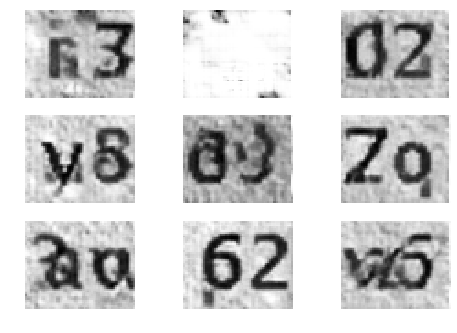

8301 [D loss: 0.517247] [G loss: 2.520984]
8302 [D loss: 0.278809] [G loss: 3.012124]
8303 [D loss: 0.286494] [G loss: 2.637210]
8304 [D loss: 0.348947] [G loss: 3.166576]
8305 [D loss: 0.298627] [G loss: 2.489060]
8306 [D loss: 0.342457] [G loss: 2.423976]
8307 [D loss: 0.354084] [G loss: 2.544235]
8308 [D loss: 0.494928] [G loss: 2.091700]
8309 [D loss: 0.252613] [G loss: 2.849235]
8310 [D loss: 0.386853] [G loss: 3.065818]
8311 [D loss: 0.436204] [G loss: 2.150014]
8312 [D loss: 0.374170] [G loss: 2.079984]
8313 [D loss: 0.386315] [G loss: 1.955920]
8314 [D loss: 0.237092] [G loss: 2.034510]
8315 [D loss: 0.350876] [G loss: 2.565752]
8316 [D loss: 0.448067] [G loss: 2.179415]
8317 [D loss: 0.289408] [G loss: 2.419718]
8318 [D loss: 0.371463] [G loss: 1.976758]
8319 [D loss: 0.484025] [G loss: 2.626799]
8320 [D loss: 0.414714] [G loss: 3.445008]
8321 [D loss: 0.592645] [G loss: 2.326288]
8322 [D loss: 0.447064] [G loss: 2.580750]
8323 [D loss: 0.524091] [G loss: 2.275299]
8324 [D los

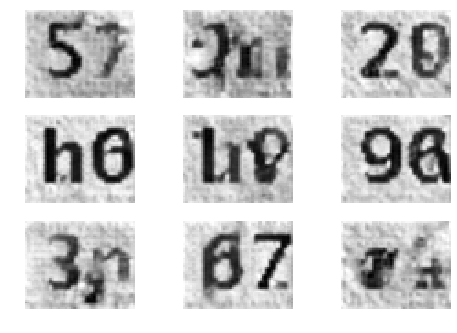

8351 [D loss: 0.404794] [G loss: 1.514896]
8352 [D loss: 0.590719] [G loss: 2.931450]
8353 [D loss: 0.413915] [G loss: 3.180681]
8354 [D loss: 0.694470] [G loss: 2.118279]
8355 [D loss: 0.568676] [G loss: 2.548955]
8356 [D loss: 0.414851] [G loss: 2.798499]
8357 [D loss: 0.478802] [G loss: 3.360714]
8358 [D loss: 0.387953] [G loss: 2.710526]
8359 [D loss: 0.500305] [G loss: 3.315536]
8360 [D loss: 0.412713] [G loss: 2.542227]
8361 [D loss: 0.453763] [G loss: 3.134494]
8362 [D loss: 0.405255] [G loss: 2.840222]
8363 [D loss: 0.331451] [G loss: 2.640238]
8364 [D loss: 0.289719] [G loss: 2.735853]
8365 [D loss: 0.308844] [G loss: 2.925326]
8366 [D loss: 0.237550] [G loss: 2.914575]
8367 [D loss: 0.332499] [G loss: 2.681748]
8368 [D loss: 0.447949] [G loss: 2.454834]
8369 [D loss: 0.540882] [G loss: 2.500936]
8370 [D loss: 0.306802] [G loss: 3.297002]
8371 [D loss: 0.482477] [G loss: 2.245118]
8372 [D loss: 0.276504] [G loss: 2.747829]
8373 [D loss: 0.294188] [G loss: 2.723711]
8374 [D los

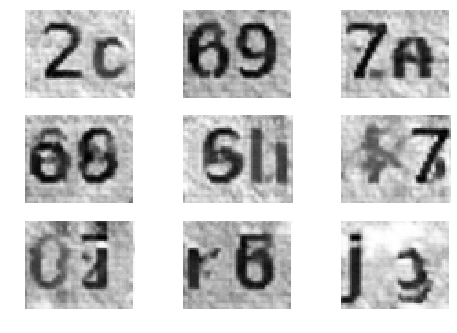

8401 [D loss: 0.437880] [G loss: 3.089200]
8402 [D loss: 0.668393] [G loss: 2.525288]
8403 [D loss: 0.334436] [G loss: 2.046380]
8404 [D loss: 0.428403] [G loss: 2.892490]
8405 [D loss: 0.283010] [G loss: 3.074529]
8406 [D loss: 0.479577] [G loss: 3.006932]
8407 [D loss: 0.469676] [G loss: 2.171485]
8408 [D loss: 0.520820] [G loss: 2.419138]
8409 [D loss: 0.720641] [G loss: 2.221836]
8410 [D loss: 0.267337] [G loss: 2.372343]
8411 [D loss: 0.347214] [G loss: 2.535121]
8412 [D loss: 0.313484] [G loss: 2.248607]
8413 [D loss: 0.468655] [G loss: 2.588078]
8414 [D loss: 0.435022] [G loss: 3.259476]
8415 [D loss: 0.180265] [G loss: 3.780280]
8416 [D loss: 0.257226] [G loss: 3.461197]
8417 [D loss: 0.567886] [G loss: 2.797886]
8418 [D loss: 0.503619] [G loss: 2.258445]
8419 [D loss: 0.203719] [G loss: 2.109251]
8420 [D loss: 0.420548] [G loss: 2.529099]
8421 [D loss: 0.406474] [G loss: 3.137106]
8422 [D loss: 0.669021] [G loss: 2.295256]
8423 [D loss: 0.497769] [G loss: 2.947404]
8424 [D los

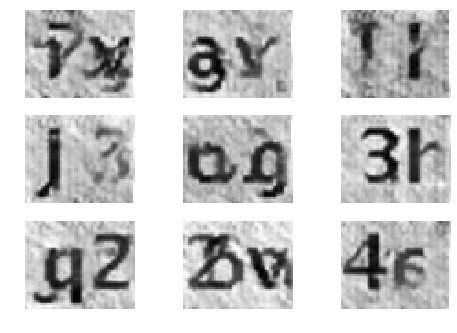

8451 [D loss: 0.624480] [G loss: 3.003329]
8452 [D loss: 0.493211] [G loss: 2.932621]
8453 [D loss: 0.315970] [G loss: 3.437545]
8454 [D loss: 0.382585] [G loss: 2.835268]
8455 [D loss: 0.175970] [G loss: 2.894961]
8456 [D loss: 0.320120] [G loss: 2.840069]
8457 [D loss: 0.188098] [G loss: 3.181371]
8458 [D loss: 0.407134] [G loss: 2.521403]
8459 [D loss: 0.474113] [G loss: 2.509633]
8460 [D loss: 0.417454] [G loss: 2.503137]
8461 [D loss: 0.744725] [G loss: 2.752118]
8462 [D loss: 0.388948] [G loss: 2.293579]
8463 [D loss: 0.426153] [G loss: 2.529933]
8464 [D loss: 0.661987] [G loss: 2.470017]
8465 [D loss: 0.299630] [G loss: 2.579162]
8466 [D loss: 0.484021] [G loss: 2.937062]
8467 [D loss: 0.174771] [G loss: 2.790173]
8468 [D loss: 0.517165] [G loss: 3.007838]
8469 [D loss: 0.748254] [G loss: 2.762686]
8470 [D loss: 0.269689] [G loss: 2.588370]
8471 [D loss: 0.264430] [G loss: 3.482624]
8472 [D loss: 0.120974] [G loss: 3.424314]
8473 [D loss: 0.452024] [G loss: 2.842953]
8474 [D los

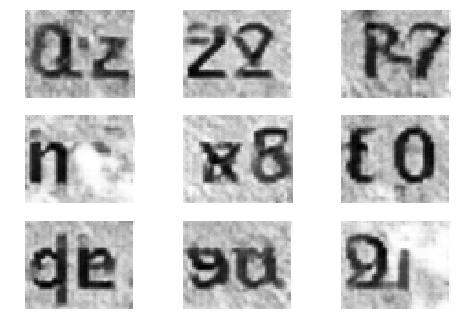

8501 [D loss: 0.169649] [G loss: 3.177543]
8502 [D loss: 0.379604] [G loss: 3.316009]
8503 [D loss: 0.415760] [G loss: 2.312244]
8504 [D loss: 0.444177] [G loss: 2.325786]
8505 [D loss: 0.427550] [G loss: 2.770241]
8506 [D loss: 0.562395] [G loss: 2.276442]
8507 [D loss: 0.446380] [G loss: 2.263727]
8508 [D loss: 0.178855] [G loss: 4.083448]
8509 [D loss: 0.359458] [G loss: 3.406624]
8510 [D loss: 0.728946] [G loss: 2.850684]
8511 [D loss: 0.468885] [G loss: 3.187454]
8512 [D loss: 0.770564] [G loss: 2.631780]
8513 [D loss: 0.220814] [G loss: 3.274802]
8514 [D loss: 0.584064] [G loss: 2.561803]
8515 [D loss: 0.513321] [G loss: 2.380546]
8516 [D loss: 0.268743] [G loss: 2.902553]
8517 [D loss: 0.398167] [G loss: 3.383012]
8518 [D loss: 0.463196] [G loss: 2.017570]
8519 [D loss: 0.471309] [G loss: 2.672470]
8520 [D loss: 0.542783] [G loss: 2.572677]
8521 [D loss: 0.701240] [G loss: 2.544019]
8522 [D loss: 0.165498] [G loss: 2.693265]
8523 [D loss: 0.092192] [G loss: 3.606918]
8524 [D los

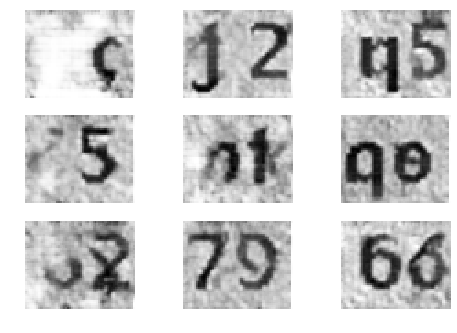

8551 [D loss: 0.191938] [G loss: 2.712624]
8552 [D loss: 0.064027] [G loss: 4.068541]
8553 [D loss: 0.474651] [G loss: 2.919858]
8554 [D loss: 0.487158] [G loss: 2.690288]
8555 [D loss: 0.529918] [G loss: 2.399495]
8556 [D loss: 0.124712] [G loss: 3.751994]
8557 [D loss: 0.512728] [G loss: 2.720097]
8558 [D loss: 0.592497] [G loss: 2.326906]
8559 [D loss: 0.336343] [G loss: 3.081412]
8560 [D loss: 0.261532] [G loss: 3.119370]
8561 [D loss: 0.436891] [G loss: 2.149750]
8562 [D loss: 0.095305] [G loss: 2.899092]
8563 [D loss: 0.638439] [G loss: 2.567629]
8564 [D loss: 0.613550] [G loss: 2.381076]
8565 [D loss: 0.234807] [G loss: 3.231715]
8566 [D loss: 0.872235] [G loss: 2.989785]
8567 [D loss: 0.426998] [G loss: 2.205822]
8568 [D loss: 0.402657] [G loss: 2.822713]
8569 [D loss: 0.130436] [G loss: 3.997220]
8570 [D loss: 0.088352] [G loss: 3.679395]
8571 [D loss: 0.608130] [G loss: 2.377990]
8572 [D loss: 0.214486] [G loss: 3.272735]
8573 [D loss: 0.380925] [G loss: 2.555759]
8574 [D los

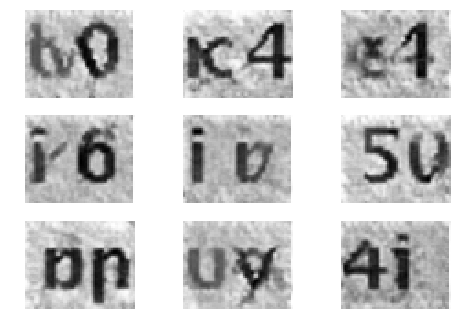

8601 [D loss: 0.197183] [G loss: 3.414931]
8602 [D loss: 0.562727] [G loss: 2.473054]
8603 [D loss: 0.537146] [G loss: 2.928985]
8604 [D loss: 0.202082] [G loss: 3.174600]
8605 [D loss: 0.409214] [G loss: 2.874636]
8606 [D loss: 0.365083] [G loss: 3.310559]
8607 [D loss: 0.662070] [G loss: 3.053951]
8608 [D loss: 0.406358] [G loss: 2.271466]
8609 [D loss: 0.089368] [G loss: 3.577579]
8610 [D loss: 0.138143] [G loss: 3.416005]
8611 [D loss: 0.628420] [G loss: 2.698587]
8612 [D loss: 0.575158] [G loss: 2.142343]
8613 [D loss: 0.323281] [G loss: 3.333070]
8614 [D loss: 0.556559] [G loss: 3.607506]
8615 [D loss: 0.194815] [G loss: 4.210340]
8616 [D loss: 0.745205] [G loss: 2.914185]
8617 [D loss: 0.453666] [G loss: 2.070277]
8618 [D loss: 0.205434] [G loss: 3.205213]
8619 [D loss: 0.532314] [G loss: 1.872987]
8620 [D loss: 0.386208] [G loss: 2.135974]
8621 [D loss: 0.431918] [G loss: 2.330747]
8622 [D loss: 0.550317] [G loss: 2.638312]
8623 [D loss: 0.413621] [G loss: 2.880255]
8624 [D los

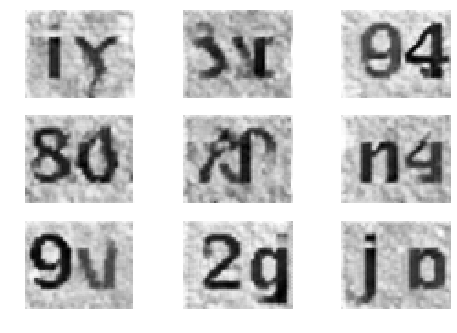

8651 [D loss: 0.638587] [G loss: 2.466672]
8652 [D loss: 0.428957] [G loss: 2.271391]
8653 [D loss: 0.320518] [G loss: 3.462630]
8654 [D loss: 0.697749] [G loss: 2.438233]
8655 [D loss: 0.168360] [G loss: 2.617403]
8656 [D loss: 0.069565] [G loss: 3.898770]
8657 [D loss: 0.582584] [G loss: 2.723539]
8658 [D loss: 0.455260] [G loss: 2.568584]
8659 [D loss: 0.244839] [G loss: 2.283327]
8660 [D loss: 0.542490] [G loss: 2.793902]
8661 [D loss: 0.332246] [G loss: 2.404738]
8662 [D loss: 0.544222] [G loss: 2.569958]
8663 [D loss: 0.675206] [G loss: 2.282444]
8664 [D loss: 0.417834] [G loss: 2.529412]
8665 [D loss: 0.561164] [G loss: 2.434720]
8666 [D loss: 0.406527] [G loss: 2.820185]
8667 [D loss: 0.722018] [G loss: 2.838593]
8668 [D loss: 0.446838] [G loss: 2.306702]
8669 [D loss: 0.591821] [G loss: 2.642592]
8670 [D loss: 0.197620] [G loss: 3.350238]
8671 [D loss: 0.106189] [G loss: 5.412222]
8672 [D loss: 0.726101] [G loss: 3.375773]
8673 [D loss: 0.140193] [G loss: 2.766478]
8674 [D los

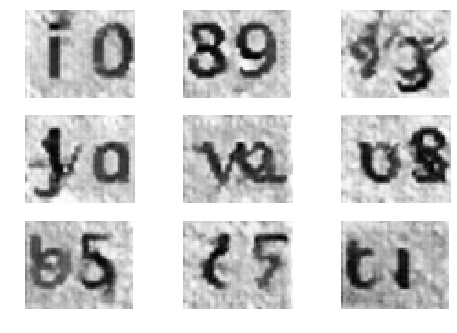

8701 [D loss: 0.488991] [G loss: 2.531866]
8702 [D loss: 0.482395] [G loss: 2.340322]
8703 [D loss: 0.425490] [G loss: 2.588216]
8704 [D loss: 0.391693] [G loss: 2.542291]
8705 [D loss: 0.153042] [G loss: 2.897893]
8706 [D loss: 0.721157] [G loss: 2.338280]
8707 [D loss: 0.451661] [G loss: 2.594779]
8708 [D loss: 0.554781] [G loss: 2.513449]
8709 [D loss: 0.109070] [G loss: 3.046985]
8710 [D loss: 0.402990] [G loss: 2.857516]
8711 [D loss: 0.245303] [G loss: 2.604740]
8712 [D loss: 0.304580] [G loss: 2.421052]
8713 [D loss: 0.450454] [G loss: 1.717723]
8714 [D loss: 0.477589] [G loss: 2.118108]
8715 [D loss: 0.379417] [G loss: 3.029889]
8716 [D loss: 0.198250] [G loss: 3.149078]
8717 [D loss: 0.174367] [G loss: 3.299451]
8718 [D loss: 0.780011] [G loss: 2.345341]
8719 [D loss: 0.460845] [G loss: 2.343588]
8720 [D loss: 0.371100] [G loss: 3.028440]
8721 [D loss: 0.270525] [G loss: 3.697358]
8722 [D loss: 0.518530] [G loss: 3.223327]
8723 [D loss: 0.373608] [G loss: 2.586253]
8724 [D los

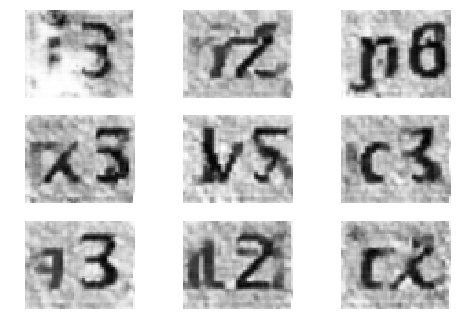

8751 [D loss: 0.297091] [G loss: 2.788163]
8752 [D loss: 0.105196] [G loss: 3.179946]
8753 [D loss: 0.464136] [G loss: 3.009665]
8754 [D loss: 0.087839] [G loss: 4.459309]
8755 [D loss: 0.864072] [G loss: 1.637114]
8756 [D loss: 0.405698] [G loss: 2.155621]
8757 [D loss: 0.574631] [G loss: 2.627878]
8758 [D loss: 0.309971] [G loss: 2.216732]
8759 [D loss: 0.438826] [G loss: 3.051365]
8760 [D loss: 0.497078] [G loss: 2.164668]
8761 [D loss: 0.541695] [G loss: 2.572044]
8762 [D loss: 0.564004] [G loss: 2.387688]
8763 [D loss: 0.518074] [G loss: 2.719363]
8764 [D loss: 0.103842] [G loss: 3.576932]
8765 [D loss: 0.373092] [G loss: 3.867435]
8766 [D loss: 0.079711] [G loss: 4.494745]
8767 [D loss: 0.876827] [G loss: 2.350811]
8768 [D loss: 0.590386] [G loss: 1.952803]
8769 [D loss: 0.431162] [G loss: 3.322331]
8770 [D loss: 0.421660] [G loss: 2.427426]
8771 [D loss: 0.419629] [G loss: 2.698892]
8772 [D loss: 0.097219] [G loss: 3.610317]
8773 [D loss: 0.635252] [G loss: 2.717297]
8774 [D los

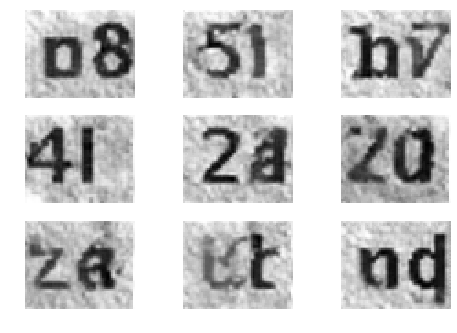

8801 [D loss: 1.005206] [G loss: 2.382412]
8802 [D loss: 0.182710] [G loss: 3.188333]
8803 [D loss: 0.505888] [G loss: 3.033931]
8804 [D loss: 0.550074] [G loss: 2.920100]
8805 [D loss: 0.388470] [G loss: 3.032777]
8806 [D loss: 0.421203] [G loss: 2.326419]
8807 [D loss: 0.409641] [G loss: 3.109118]
8808 [D loss: 0.343931] [G loss: 3.571822]
8809 [D loss: 0.558910] [G loss: 2.652571]
8810 [D loss: 0.461476] [G loss: 2.256424]
8811 [D loss: 0.178579] [G loss: 3.333105]
8812 [D loss: 0.056227] [G loss: 4.234669]
8813 [D loss: 0.526085] [G loss: 2.635271]
8814 [D loss: 0.705008] [G loss: 2.222951]
8815 [D loss: 0.518108] [G loss: 2.646799]
8816 [D loss: 0.562568] [G loss: 1.900008]
8817 [D loss: 0.661658] [G loss: 2.624659]
8818 [D loss: 0.283093] [G loss: 2.477787]
8819 [D loss: 0.516159] [G loss: 2.437902]
8820 [D loss: 0.584458] [G loss: 2.098571]
8821 [D loss: 0.437629] [G loss: 2.804322]
8822 [D loss: 0.562211] [G loss: 2.908601]
8823 [D loss: 0.318991] [G loss: 3.140461]
8824 [D los

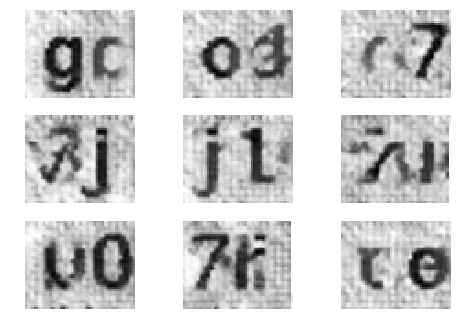

8851 [D loss: 0.209321] [G loss: 2.899015]
8852 [D loss: 0.644963] [G loss: 1.829268]
8853 [D loss: 0.346448] [G loss: 3.031196]
8854 [D loss: 0.342508] [G loss: 3.589861]
8855 [D loss: 0.204667] [G loss: 2.758254]
8856 [D loss: 0.128716] [G loss: 3.371688]
8857 [D loss: 0.558195] [G loss: 2.138330]
8858 [D loss: 0.432130] [G loss: 2.756627]
8859 [D loss: 0.152109] [G loss: 4.302894]
8860 [D loss: 0.839527] [G loss: 3.029781]
8861 [D loss: 0.121532] [G loss: 3.609475]
8862 [D loss: 0.662095] [G loss: 2.937360]
8863 [D loss: 0.176617] [G loss: 3.294424]
8864 [D loss: 0.479837] [G loss: 2.486429]
8865 [D loss: 0.206397] [G loss: 4.264458]
8866 [D loss: 0.042940] [G loss: 4.565979]
8867 [D loss: 0.518170] [G loss: 3.313075]
8868 [D loss: 0.216855] [G loss: 3.028888]
8869 [D loss: 0.465159] [G loss: 2.397330]
8870 [D loss: 0.435677] [G loss: 2.248750]
8871 [D loss: 0.152742] [G loss: 3.228113]
8872 [D loss: 0.417872] [G loss: 2.921719]
8873 [D loss: 0.201488] [G loss: 3.813551]
8874 [D los

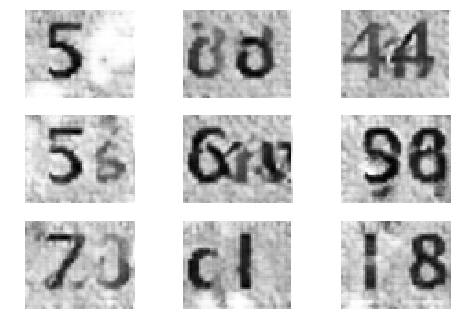

8901 [D loss: 0.408140] [G loss: 2.250796]
8902 [D loss: 0.421042] [G loss: 3.119102]
8903 [D loss: 0.118619] [G loss: 4.128917]
8904 [D loss: 0.551236] [G loss: 3.076565]
8905 [D loss: 0.520833] [G loss: 2.337260]
8906 [D loss: 0.441602] [G loss: 2.341091]
8907 [D loss: 0.359760] [G loss: 3.316420]
8908 [D loss: 0.384381] [G loss: 2.491387]
8909 [D loss: 0.382395] [G loss: 2.484984]
8910 [D loss: 0.670162] [G loss: 2.654049]
8911 [D loss: 0.185037] [G loss: 3.412900]
8912 [D loss: 0.394418] [G loss: 2.805824]
8913 [D loss: 0.136218] [G loss: 3.418200]
8914 [D loss: 0.371140] [G loss: 3.207830]
8915 [D loss: 0.442037] [G loss: 2.516292]
8916 [D loss: 0.480065] [G loss: 2.673046]
8917 [D loss: 0.676962] [G loss: 2.580061]
8918 [D loss: 0.052135] [G loss: 4.183298]
8919 [D loss: 0.504874] [G loss: 2.865139]
8920 [D loss: 0.467389] [G loss: 2.364508]
8921 [D loss: 0.298689] [G loss: 3.575743]
8922 [D loss: 0.451213] [G loss: 3.195146]
8923 [D loss: 0.473095] [G loss: 1.820454]
8924 [D los

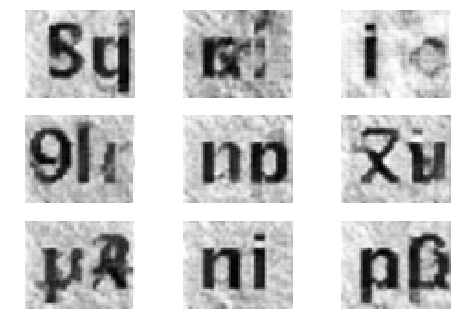

8951 [D loss: 0.359576] [G loss: 3.026312]
8952 [D loss: 0.530709] [G loss: 2.204053]
8953 [D loss: 0.378422] [G loss: 1.783147]
8954 [D loss: 0.524008] [G loss: 2.785606]
8955 [D loss: 0.722078] [G loss: 2.416801]
8956 [D loss: 0.425258] [G loss: 2.719216]
8957 [D loss: 0.443254] [G loss: 2.575540]
8958 [D loss: 0.461768] [G loss: 2.458474]
8959 [D loss: 0.412888] [G loss: 2.690347]
8960 [D loss: 0.156526] [G loss: 3.426570]
8961 [D loss: 0.069303] [G loss: 3.825280]
8962 [D loss: 0.154479] [G loss: 5.362613]
8963 [D loss: 0.071669] [G loss: 5.088968]
8964 [D loss: 0.984272] [G loss: 3.206791]
8965 [D loss: 0.552112] [G loss: 1.524207]
8966 [D loss: 0.432070] [G loss: 2.910853]
8967 [D loss: 0.136987] [G loss: 3.072944]
8968 [D loss: 0.660316] [G loss: 2.526273]
8969 [D loss: 0.139955] [G loss: 2.931070]
8970 [D loss: 0.083281] [G loss: 4.044006]
8971 [D loss: 0.080900] [G loss: 3.913199]
8972 [D loss: 0.334466] [G loss: 3.221352]
8973 [D loss: 0.444390] [G loss: 2.225837]
8974 [D los

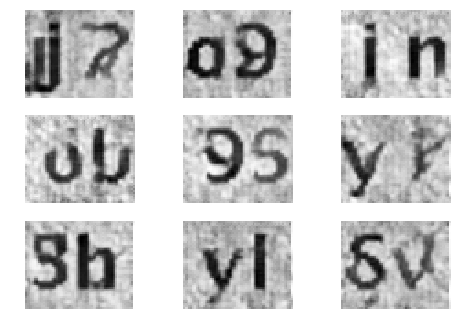

9001 [D loss: 0.328609] [G loss: 3.055758]
9002 [D loss: 0.496423] [G loss: 2.748769]
9003 [D loss: 0.499555] [G loss: 2.985256]
9004 [D loss: 0.076599] [G loss: 3.965922]
9005 [D loss: 0.094936] [G loss: 3.746046]
9006 [D loss: 0.328801] [G loss: 3.098823]
9007 [D loss: 0.786895] [G loss: 1.967756]
9008 [D loss: 0.243008] [G loss: 2.455067]
9009 [D loss: 0.364111] [G loss: 2.337905]
9010 [D loss: 0.450618] [G loss: 2.388318]
9011 [D loss: 0.548257] [G loss: 2.340034]
9012 [D loss: 0.632475] [G loss: 1.904484]
9013 [D loss: 0.578570] [G loss: 2.906127]
9014 [D loss: 0.636265] [G loss: 2.261560]
9015 [D loss: 0.435754] [G loss: 2.696337]
9016 [D loss: 0.138699] [G loss: 2.960590]
9017 [D loss: 0.603100] [G loss: 2.470695]
9018 [D loss: 0.490478] [G loss: 2.789514]
9019 [D loss: 0.541803] [G loss: 2.555977]
9020 [D loss: 0.352515] [G loss: 2.310290]
9021 [D loss: 0.444863] [G loss: 2.678475]
9022 [D loss: 0.346597] [G loss: 2.371694]
9023 [D loss: 0.271664] [G loss: 2.564931]
9024 [D los

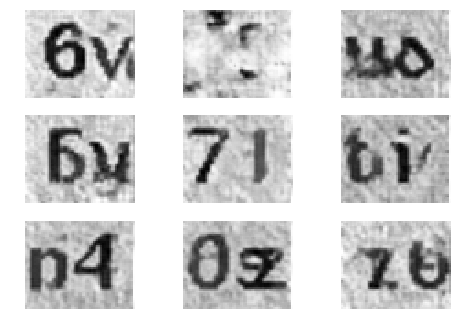

9051 [D loss: 0.588783] [G loss: 2.372537]
9052 [D loss: 0.340991] [G loss: 3.046818]
9053 [D loss: 0.526578] [G loss: 3.050610]
9054 [D loss: 0.382381] [G loss: 1.559880]
9055 [D loss: 0.570556] [G loss: 2.363740]
9056 [D loss: 0.363007] [G loss: 1.540756]
9057 [D loss: 1.138511] [G loss: 2.159382]
9058 [D loss: 0.796056] [G loss: 2.645607]
9059 [D loss: 0.353660] [G loss: 2.290741]
9060 [D loss: 0.465478] [G loss: 2.357176]
9061 [D loss: 0.267411] [G loss: 2.533561]
9062 [D loss: 0.968695] [G loss: 1.618499]
9063 [D loss: 0.348363] [G loss: 2.957453]
9064 [D loss: 0.407933] [G loss: 2.956407]
9065 [D loss: 0.455786] [G loss: 2.848152]
9066 [D loss: 0.620024] [G loss: 2.463866]
9067 [D loss: 0.518114] [G loss: 3.284184]
9068 [D loss: 0.470331] [G loss: 1.851283]
9069 [D loss: 0.468710] [G loss: 2.562275]
9070 [D loss: 0.453460] [G loss: 2.392468]
9071 [D loss: 0.429585] [G loss: 2.927582]
9072 [D loss: 0.374125] [G loss: 2.839570]
9073 [D loss: 0.347949] [G loss: 2.828421]
9074 [D los

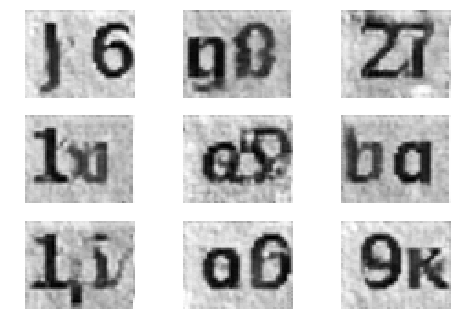

9101 [D loss: 0.795331] [G loss: 2.407097]
9102 [D loss: 0.444088] [G loss: 1.958370]
9103 [D loss: 0.532030] [G loss: 2.050778]
9104 [D loss: 0.463542] [G loss: 2.801866]
9105 [D loss: 0.377037] [G loss: 2.693308]
9106 [D loss: 0.554875] [G loss: 3.201181]
9107 [D loss: 0.224859] [G loss: 3.369387]
9108 [D loss: 0.267409] [G loss: 2.642559]
9109 [D loss: 0.507637] [G loss: 2.609196]
9110 [D loss: 0.262598] [G loss: 2.292538]
9111 [D loss: 0.360158] [G loss: 2.076030]
9112 [D loss: 0.227263] [G loss: 3.239470]
9113 [D loss: 0.247940] [G loss: 3.592772]
9114 [D loss: 0.553308] [G loss: 2.053065]
9115 [D loss: 0.436816] [G loss: 2.164544]
9116 [D loss: 0.388062] [G loss: 2.045896]
9117 [D loss: 0.349120] [G loss: 2.353478]
9118 [D loss: 0.239269] [G loss: 2.975237]
9119 [D loss: 0.373272] [G loss: 3.168667]
9120 [D loss: 0.272381] [G loss: 2.297995]
9121 [D loss: 0.218848] [G loss: 3.502220]
9122 [D loss: 0.402078] [G loss: 2.986850]
9123 [D loss: 0.279634] [G loss: 3.272643]
9124 [D los

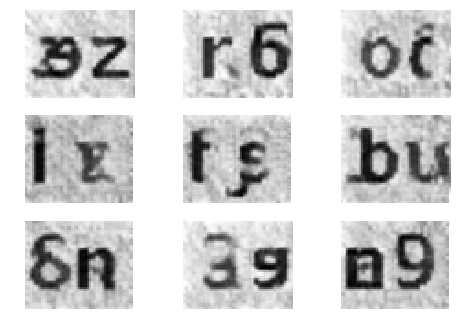

9151 [D loss: 0.351279] [G loss: 2.227879]
9152 [D loss: 0.501050] [G loss: 1.868693]
9153 [D loss: 0.253761] [G loss: 2.978066]
9154 [D loss: 0.579594] [G loss: 2.592617]
9155 [D loss: 0.734660] [G loss: 2.405897]
9156 [D loss: 0.373456] [G loss: 2.400710]
9157 [D loss: 0.425258] [G loss: 3.419928]
9158 [D loss: 0.401590] [G loss: 2.454551]
9159 [D loss: 0.365250] [G loss: 2.648123]
9160 [D loss: 0.585894] [G loss: 2.479445]
9161 [D loss: 0.416254] [G loss: 2.414673]
9162 [D loss: 0.322967] [G loss: 2.571567]
9163 [D loss: 0.799857] [G loss: 2.371983]
9164 [D loss: 0.481020] [G loss: 2.357984]
9165 [D loss: 0.407684] [G loss: 2.960998]
9166 [D loss: 0.230828] [G loss: 3.684273]
9167 [D loss: 0.513962] [G loss: 2.443802]
9168 [D loss: 0.291557] [G loss: 2.735754]
9169 [D loss: 0.385977] [G loss: 2.733111]
9170 [D loss: 0.697414] [G loss: 2.909267]
9171 [D loss: 0.219533] [G loss: 3.452450]
9172 [D loss: 0.145368] [G loss: 3.300045]
9173 [D loss: 0.232048] [G loss: 3.003162]
9174 [D los

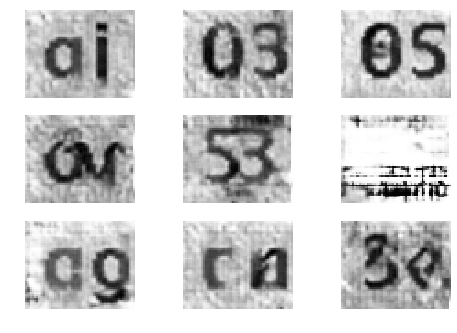

9201 [D loss: 0.977095] [G loss: 1.707383]
9202 [D loss: 0.370027] [G loss: 3.143820]
9203 [D loss: 0.434481] [G loss: 2.261328]
9204 [D loss: 0.414165] [G loss: 2.883666]
9205 [D loss: 0.623624] [G loss: 2.235663]
9206 [D loss: 0.428852] [G loss: 1.952973]
9207 [D loss: 0.255798] [G loss: 1.952848]
9208 [D loss: 0.505512] [G loss: 3.487232]
9209 [D loss: 0.323422] [G loss: 3.322672]
9210 [D loss: 0.833557] [G loss: 2.440915]
9211 [D loss: 0.461683] [G loss: 2.485676]
9212 [D loss: 0.401536] [G loss: 2.776477]
9213 [D loss: 0.646754] [G loss: 2.650047]
9214 [D loss: 0.384830] [G loss: 2.436748]
9215 [D loss: 0.490237] [G loss: 3.188354]
9216 [D loss: 0.403785] [G loss: 2.343559]
9217 [D loss: 0.474841] [G loss: 3.224417]
9218 [D loss: 0.286061] [G loss: 2.300540]
9219 [D loss: 0.418764] [G loss: 1.958168]
9220 [D loss: 0.384056] [G loss: 2.570847]
9221 [D loss: 0.488916] [G loss: 2.746330]
9222 [D loss: 0.385744] [G loss: 2.865154]
9223 [D loss: 0.383349] [G loss: 2.541526]
9224 [D los

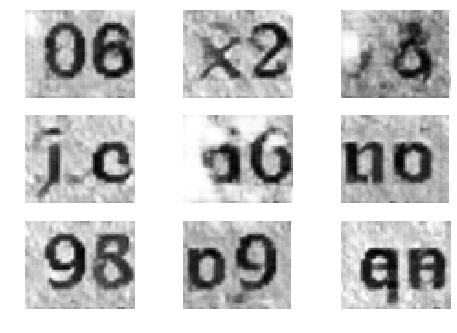

9251 [D loss: 0.436272] [G loss: 3.026035]
9252 [D loss: 0.683512] [G loss: 2.402411]
9253 [D loss: 0.424445] [G loss: 2.378467]
9254 [D loss: 0.384641] [G loss: 3.603449]
9255 [D loss: 0.583197] [G loss: 3.657051]
9256 [D loss: 0.478154] [G loss: 2.166894]
9257 [D loss: 0.332064] [G loss: 2.147323]
9258 [D loss: 0.301894] [G loss: 2.339491]
9259 [D loss: 0.177788] [G loss: 3.154208]
9260 [D loss: 0.156503] [G loss: 3.276665]
9261 [D loss: 0.563080] [G loss: 2.258603]
9262 [D loss: 0.312654] [G loss: 2.983463]
9263 [D loss: 0.464496] [G loss: 2.767651]
9264 [D loss: 0.563773] [G loss: 2.556623]
9265 [D loss: 0.415272] [G loss: 2.406409]
9266 [D loss: 0.562583] [G loss: 2.786804]
9267 [D loss: 0.431432] [G loss: 2.601256]
9268 [D loss: 0.564784] [G loss: 2.580045]
9269 [D loss: 0.624439] [G loss: 2.398602]
9270 [D loss: 0.304983] [G loss: 2.719312]
9271 [D loss: 0.315729] [G loss: 3.147941]
9272 [D loss: 0.311578] [G loss: 2.659260]
9273 [D loss: 0.748015] [G loss: 2.479980]
9274 [D los

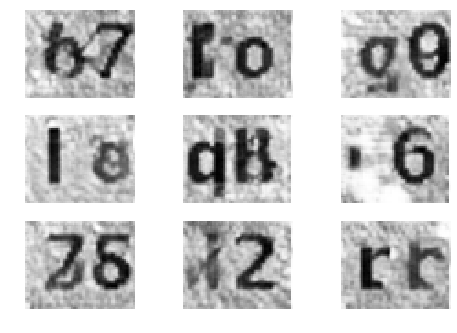

9301 [D loss: 0.419381] [G loss: 2.502400]
9302 [D loss: 0.407059] [G loss: 2.472891]
9303 [D loss: 0.368866] [G loss: 3.321810]
9304 [D loss: 0.575024] [G loss: 2.155305]
9305 [D loss: 0.544918] [G loss: 2.382688]
9306 [D loss: 0.144054] [G loss: 3.675003]
9307 [D loss: 0.404795] [G loss: 2.775230]
9308 [D loss: 0.530689] [G loss: 1.967315]
9309 [D loss: 0.466190] [G loss: 2.901764]
9310 [D loss: 0.439907] [G loss: 2.827297]
9311 [D loss: 0.518071] [G loss: 2.376654]
9312 [D loss: 0.394633] [G loss: 2.567320]
9313 [D loss: 0.524535] [G loss: 2.285408]
9314 [D loss: 0.664958] [G loss: 1.811595]
9315 [D loss: 0.462153] [G loss: 2.525713]
9316 [D loss: 0.451285] [G loss: 2.484472]
9317 [D loss: 0.377011] [G loss: 3.076882]
9318 [D loss: 0.402767] [G loss: 3.260503]
9319 [D loss: 0.552928] [G loss: 3.148033]
9320 [D loss: 0.177329] [G loss: 3.165887]
9321 [D loss: 0.129236] [G loss: 3.572229]
9322 [D loss: 0.172388] [G loss: 3.817177]
9323 [D loss: 0.239502] [G loss: 4.247613]
9324 [D los

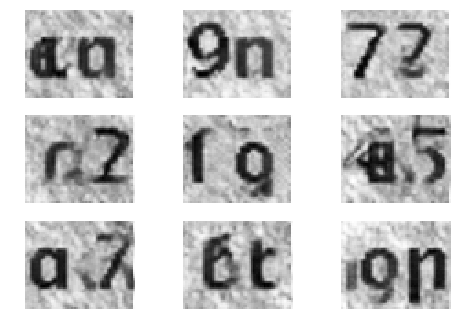

9351 [D loss: 0.374176] [G loss: 2.732930]
9352 [D loss: 0.355696] [G loss: 3.126736]
9353 [D loss: 0.209411] [G loss: 3.555930]
9354 [D loss: 0.496651] [G loss: 3.044557]
9355 [D loss: 0.096684] [G loss: 3.590057]
9356 [D loss: 0.605508] [G loss: 2.712697]
9357 [D loss: 0.498505] [G loss: 2.160312]
9358 [D loss: 0.374929] [G loss: 2.602533]
9359 [D loss: 0.288960] [G loss: 2.606063]
9360 [D loss: 0.377217] [G loss: 2.780107]
9361 [D loss: 0.084076] [G loss: 3.341483]
9362 [D loss: 0.398871] [G loss: 3.063718]
9363 [D loss: 0.145575] [G loss: 2.669114]
9364 [D loss: 0.378833] [G loss: 2.525800]
9365 [D loss: 0.459778] [G loss: 2.767534]
9366 [D loss: 0.190863] [G loss: 3.146929]
9367 [D loss: 0.476838] [G loss: 2.915011]
9368 [D loss: 0.171477] [G loss: 3.013597]
9369 [D loss: 0.371622] [G loss: 3.110664]
9370 [D loss: 0.612452] [G loss: 2.335292]
9371 [D loss: 0.469403] [G loss: 2.615539]
9372 [D loss: 0.604332] [G loss: 2.661974]
9373 [D loss: 0.371922] [G loss: 2.924539]
9374 [D los

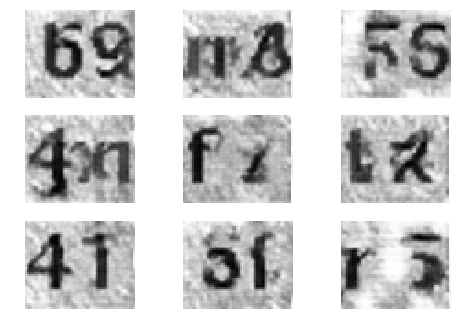

9401 [D loss: 0.075307] [G loss: 3.344399]
9402 [D loss: 0.609009] [G loss: 2.740517]
9403 [D loss: 0.934503] [G loss: 2.690450]
9404 [D loss: 0.694948] [G loss: 2.422875]
9405 [D loss: 0.288841] [G loss: 3.615173]
9406 [D loss: 0.582803] [G loss: 2.207076]
9407 [D loss: 0.331793] [G loss: 2.728843]
9408 [D loss: 0.609962] [G loss: 3.126576]
9409 [D loss: 0.630328] [G loss: 2.287104]
9410 [D loss: 0.353758] [G loss: 2.895589]
9411 [D loss: 0.408736] [G loss: 2.962447]
9412 [D loss: 0.610480] [G loss: 1.921781]
9413 [D loss: 0.467072] [G loss: 2.906660]
9414 [D loss: 0.577047] [G loss: 2.135208]
9415 [D loss: 0.235973] [G loss: 3.017829]
9416 [D loss: 0.153031] [G loss: 4.467498]
9417 [D loss: 0.958610] [G loss: 2.517752]
9418 [D loss: 0.123291] [G loss: 3.109717]
9419 [D loss: 0.170180] [G loss: 3.689159]
9420 [D loss: 0.092421] [G loss: 3.634437]
9421 [D loss: 0.564580] [G loss: 2.849635]
9422 [D loss: 0.389207] [G loss: 2.255255]
9423 [D loss: 0.171801] [G loss: 2.953782]
9424 [D los

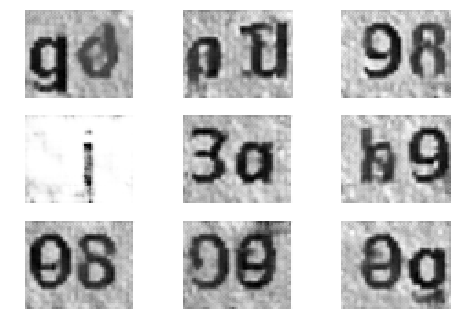

9451 [D loss: 0.453238] [G loss: 2.567713]
9452 [D loss: 0.191729] [G loss: 2.764275]
9453 [D loss: 0.622633] [G loss: 2.942396]
9454 [D loss: 0.216524] [G loss: 3.057993]
9455 [D loss: 0.137566] [G loss: 2.947398]
9456 [D loss: 0.921729] [G loss: 2.756052]
9457 [D loss: 0.092661] [G loss: 2.733717]
9458 [D loss: 0.539402] [G loss: 2.965776]
9459 [D loss: 0.577472] [G loss: 2.369778]
9460 [D loss: 0.088212] [G loss: 4.684451]
9461 [D loss: 0.567110] [G loss: 3.078971]
9462 [D loss: 0.183735] [G loss: 3.061104]
9463 [D loss: 0.657042] [G loss: 2.605990]
9464 [D loss: 0.097873] [G loss: 3.285218]
9465 [D loss: 0.649667] [G loss: 3.000628]
9466 [D loss: 0.648708] [G loss: 2.098916]
9467 [D loss: 0.578604] [G loss: 3.029441]
9468 [D loss: 0.217604] [G loss: 4.049010]
9469 [D loss: 0.071767] [G loss: 3.991920]
9470 [D loss: 0.724625] [G loss: 2.852546]
9471 [D loss: 0.497492] [G loss: 2.301898]
9472 [D loss: 0.565785] [G loss: 2.490361]
9473 [D loss: 0.232774] [G loss: 2.861628]
9474 [D los

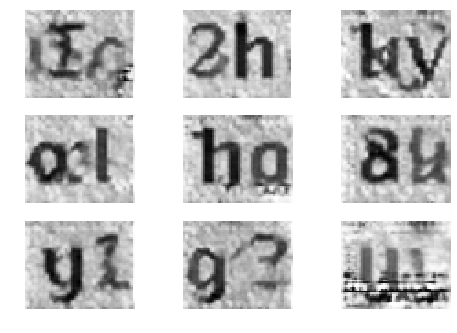

9501 [D loss: 1.023134] [G loss: 1.430868]
9502 [D loss: 0.276836] [G loss: 2.732157]
9503 [D loss: 0.873156] [G loss: 2.379933]
9504 [D loss: 0.927153] [G loss: 3.068321]
9505 [D loss: 0.529729] [G loss: 2.559905]
9506 [D loss: 0.364064] [G loss: 2.560665]
9507 [D loss: 0.305618] [G loss: 2.459577]
9508 [D loss: 0.334869] [G loss: 2.939221]
9509 [D loss: 0.329125] [G loss: 2.690508]
9510 [D loss: 0.438702] [G loss: 2.242561]
9511 [D loss: 0.670553] [G loss: 2.245602]
9512 [D loss: 0.318495] [G loss: 2.559777]
9513 [D loss: 0.297762] [G loss: 2.546218]
9514 [D loss: 0.463883] [G loss: 2.324013]
9515 [D loss: 0.357933] [G loss: 2.975934]
9516 [D loss: 0.309887] [G loss: 3.283335]
9517 [D loss: 0.552694] [G loss: 2.512235]
9518 [D loss: 0.415216] [G loss: 2.461978]
9519 [D loss: 0.299140] [G loss: 2.346823]
9520 [D loss: 0.307686] [G loss: 2.141456]
9521 [D loss: 0.523787] [G loss: 1.838660]
9522 [D loss: 0.454414] [G loss: 3.455643]
9523 [D loss: 0.255787] [G loss: 2.226989]
9524 [D los

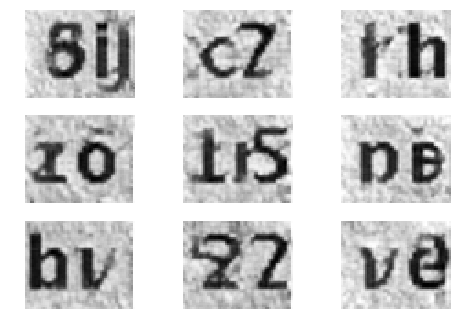

9551 [D loss: 0.379515] [G loss: 2.814253]
9552 [D loss: 0.216526] [G loss: 3.490236]
9553 [D loss: 0.713955] [G loss: 2.825124]
9554 [D loss: 0.570889] [G loss: 3.151920]
9555 [D loss: 0.329434] [G loss: 2.576010]
9556 [D loss: 0.372779] [G loss: 2.663445]
9557 [D loss: 0.807628] [G loss: 2.064567]
9558 [D loss: 0.216661] [G loss: 2.943547]
9559 [D loss: 0.417519] [G loss: 3.309720]
9560 [D loss: 0.302056] [G loss: 2.839342]
9561 [D loss: 0.557232] [G loss: 2.419933]
9562 [D loss: 0.597492] [G loss: 1.962419]
9563 [D loss: 0.433103] [G loss: 2.856422]
9564 [D loss: 0.514597] [G loss: 2.524012]
9565 [D loss: 0.246419] [G loss: 3.028416]
9566 [D loss: 0.430727] [G loss: 3.219455]
9567 [D loss: 0.233024] [G loss: 2.434590]
9568 [D loss: 0.192124] [G loss: 2.780741]
9569 [D loss: 0.631244] [G loss: 3.115135]
9570 [D loss: 0.434293] [G loss: 2.657482]
9571 [D loss: 0.399774] [G loss: 1.900781]
9572 [D loss: 0.371172] [G loss: 2.693467]
9573 [D loss: 0.262804] [G loss: 2.873518]
9574 [D los

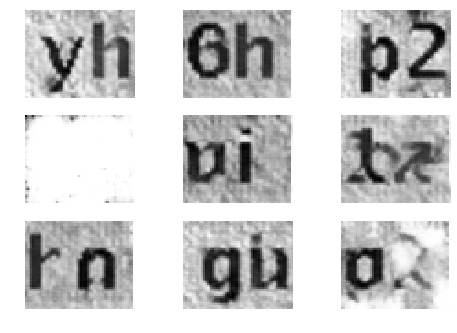

9601 [D loss: 0.311063] [G loss: 2.906068]
9602 [D loss: 0.498703] [G loss: 2.284672]
9603 [D loss: 0.478075] [G loss: 2.383026]
9604 [D loss: 0.262663] [G loss: 2.658754]
9605 [D loss: 0.092008] [G loss: 3.166311]
9606 [D loss: 0.324376] [G loss: 2.615811]
9607 [D loss: 0.341054] [G loss: 2.246640]
9608 [D loss: 0.379202] [G loss: 2.419830]
9609 [D loss: 0.313135] [G loss: 2.908122]
9610 [D loss: 0.452229] [G loss: 2.092131]
9611 [D loss: 0.528657] [G loss: 2.660773]
9612 [D loss: 0.246303] [G loss: 2.608380]
9613 [D loss: 0.233799] [G loss: 3.735531]
9614 [D loss: 0.360239] [G loss: 3.754585]
9615 [D loss: 0.674101] [G loss: 2.392522]
9616 [D loss: 0.305926] [G loss: 2.552565]
9617 [D loss: 0.578457] [G loss: 3.209264]
9618 [D loss: 0.370749] [G loss: 4.034963]
9619 [D loss: 0.754036] [G loss: 2.435092]
9620 [D loss: 0.504677] [G loss: 2.573457]
9621 [D loss: 0.529837] [G loss: 2.570859]
9622 [D loss: 0.429009] [G loss: 2.627998]
9623 [D loss: 0.238785] [G loss: 2.194470]
9624 [D los

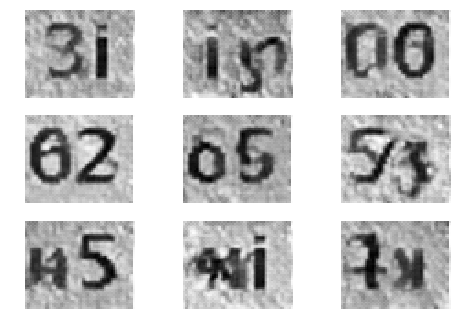

9651 [D loss: 0.599543] [G loss: 3.142556]
9652 [D loss: 0.112471] [G loss: 3.037873]
9653 [D loss: 0.354804] [G loss: 2.411818]
9654 [D loss: 0.267307] [G loss: 2.405640]
9655 [D loss: 0.208804] [G loss: 3.352877]
9656 [D loss: 0.457080] [G loss: 2.352608]
9657 [D loss: 0.561844] [G loss: 1.896102]
9658 [D loss: 0.194242] [G loss: 3.757712]
9659 [D loss: 0.383162] [G loss: 3.012848]
9660 [D loss: 0.332788] [G loss: 2.852508]
9661 [D loss: 0.356012] [G loss: 2.168880]
9662 [D loss: 0.200377] [G loss: 2.542403]
9663 [D loss: 0.080605] [G loss: 3.345459]
9664 [D loss: 0.921823] [G loss: 2.574478]
9665 [D loss: 0.190057] [G loss: 1.918617]
9666 [D loss: 0.304590] [G loss: 3.359330]
9667 [D loss: 0.343552] [G loss: 3.293882]
9668 [D loss: 0.293818] [G loss: 3.761176]
9669 [D loss: 0.610451] [G loss: 3.309622]
9670 [D loss: 0.136736] [G loss: 3.378991]
9671 [D loss: 0.571110] [G loss: 2.615973]
9672 [D loss: 0.425373] [G loss: 2.932753]
9673 [D loss: 0.628132] [G loss: 3.303756]
9674 [D los

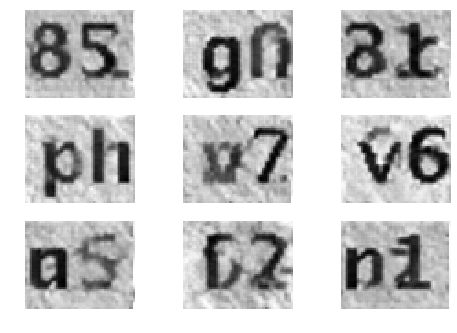

9701 [D loss: 0.099875] [G loss: 3.191926]
9702 [D loss: 0.106043] [G loss: 3.611290]
9703 [D loss: 0.577786] [G loss: 2.683754]
9704 [D loss: 0.611372] [G loss: 2.602772]
9705 [D loss: 0.356873] [G loss: 3.014879]
9706 [D loss: 0.415479] [G loss: 2.689882]
9707 [D loss: 0.195317] [G loss: 3.251117]
9708 [D loss: 0.522938] [G loss: 3.311629]
9709 [D loss: 0.130718] [G loss: 3.716618]
9710 [D loss: 0.066856] [G loss: 4.818804]
9711 [D loss: 0.336697] [G loss: 3.346923]
9712 [D loss: 0.105001] [G loss: 3.846035]
9713 [D loss: 0.469163] [G loss: 2.572462]
9714 [D loss: 0.938879] [G loss: 2.590972]
9715 [D loss: 0.140167] [G loss: 3.726563]
9716 [D loss: 0.462315] [G loss: 2.764461]
9717 [D loss: 0.514465] [G loss: 3.124190]
9718 [D loss: 0.088691] [G loss: 2.526005]
9719 [D loss: 0.440112] [G loss: 2.953819]
9720 [D loss: 0.497166] [G loss: 2.459629]
9721 [D loss: 0.345060] [G loss: 2.272007]
9722 [D loss: 0.124623] [G loss: 3.338097]
9723 [D loss: 0.492879] [G loss: 2.330595]
9724 [D los

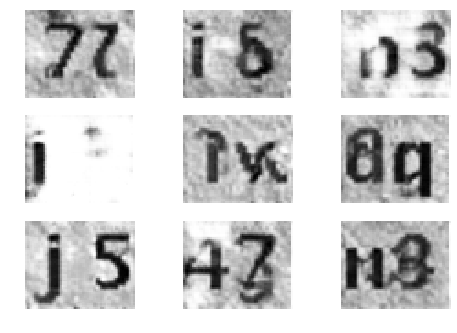

9751 [D loss: 0.414109] [G loss: 2.764268]
9752 [D loss: 0.368501] [G loss: 2.649503]
9753 [D loss: 0.443001] [G loss: 2.032348]
9754 [D loss: 0.533797] [G loss: 2.916096]
9755 [D loss: 0.158972] [G loss: 3.662013]
9756 [D loss: 0.393318] [G loss: 2.879284]
9757 [D loss: 0.162852] [G loss: 3.627386]
9758 [D loss: 0.749872] [G loss: 3.005167]
9759 [D loss: 0.311650] [G loss: 4.083316]
9760 [D loss: 0.126907] [G loss: 3.237732]
9761 [D loss: 0.065297] [G loss: 3.390378]
9762 [D loss: 0.093720] [G loss: 4.082878]
9763 [D loss: 0.630202] [G loss: 2.591111]
9764 [D loss: 0.166909] [G loss: 2.887324]
9765 [D loss: 0.122401] [G loss: 3.336239]
9766 [D loss: 0.416391] [G loss: 2.944652]
9767 [D loss: 0.096982] [G loss: 3.180426]
9768 [D loss: 0.144240] [G loss: 3.949740]
9769 [D loss: 0.936407] [G loss: 2.365374]
9770 [D loss: 0.095109] [G loss: 2.475172]
9771 [D loss: 0.113697] [G loss: 3.988323]
9772 [D loss: 0.617382] [G loss: 2.995604]
9773 [D loss: 0.443537] [G loss: 2.460892]
9774 [D los

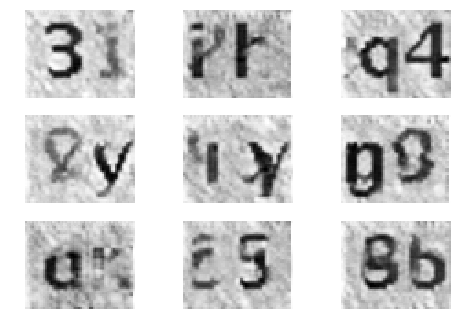

9801 [D loss: 0.483267] [G loss: 3.112784]
9802 [D loss: 0.450508] [G loss: 2.140341]
9803 [D loss: 0.483031] [G loss: 1.977856]
9804 [D loss: 0.353690] [G loss: 3.188859]
9805 [D loss: 0.414761] [G loss: 3.156646]
9806 [D loss: 0.096167] [G loss: 4.022801]
9807 [D loss: 0.387550] [G loss: 3.298954]
9808 [D loss: 0.411790] [G loss: 2.751793]
9809 [D loss: 0.344921] [G loss: 2.240198]
9810 [D loss: 0.632055] [G loss: 3.390267]
9811 [D loss: 0.432965] [G loss: 2.818658]
9812 [D loss: 0.451800] [G loss: 2.158700]
9813 [D loss: 0.385975] [G loss: 2.532977]
9814 [D loss: 0.531202] [G loss: 2.258535]
9815 [D loss: 0.559391] [G loss: 2.526758]
9816 [D loss: 0.073399] [G loss: 3.430225]
9817 [D loss: 0.388744] [G loss: 2.404746]
9818 [D loss: 0.296308] [G loss: 3.295438]
9819 [D loss: 0.144481] [G loss: 3.766717]
9820 [D loss: 0.430784] [G loss: 3.376203]
9821 [D loss: 0.663073] [G loss: 2.588567]
9822 [D loss: 0.112840] [G loss: 3.458579]
9823 [D loss: 0.390812] [G loss: 3.127127]
9824 [D los

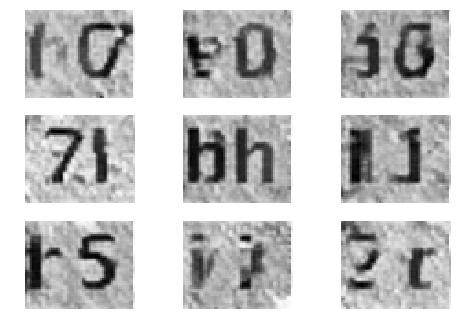

9851 [D loss: 0.050541] [G loss: 4.178064]
9852 [D loss: 0.259147] [G loss: 3.272654]
9853 [D loss: 0.645585] [G loss: 1.751769]
9854 [D loss: 0.529331] [G loss: 2.813047]
9855 [D loss: 0.324870] [G loss: 1.906579]
9856 [D loss: 0.624905] [G loss: 2.943448]
9857 [D loss: 0.597803] [G loss: 2.559953]
9858 [D loss: 0.516800] [G loss: 2.267117]
9859 [D loss: 0.606046] [G loss: 2.358086]
9860 [D loss: 0.413584] [G loss: 2.217948]
9861 [D loss: 0.453523] [G loss: 3.210662]
9862 [D loss: 0.653415] [G loss: 2.019444]
9863 [D loss: 0.119295] [G loss: 3.836101]
9864 [D loss: 0.576119] [G loss: 2.242126]
9865 [D loss: 0.226374] [G loss: 2.996766]
9866 [D loss: 0.277220] [G loss: 2.664086]
9867 [D loss: 0.054683] [G loss: 4.029408]
9868 [D loss: 0.746834] [G loss: 2.786316]
9869 [D loss: 0.099270] [G loss: 2.666802]
9870 [D loss: 0.078139] [G loss: 3.388541]
9871 [D loss: 0.380071] [G loss: 2.760067]
9872 [D loss: 0.487510] [G loss: 2.110583]
9873 [D loss: 0.277267] [G loss: 2.556862]
9874 [D los

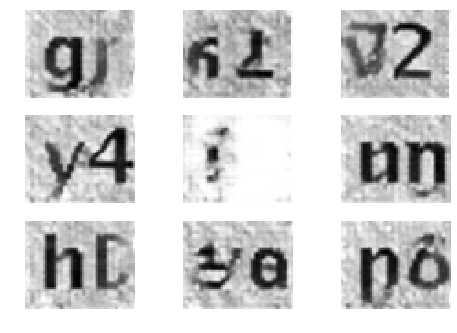

9901 [D loss: 0.362709] [G loss: 3.236591]
9902 [D loss: 0.443083] [G loss: 2.447846]
9903 [D loss: 0.833636] [G loss: 2.744663]
9904 [D loss: 0.483893] [G loss: 2.904562]
9905 [D loss: 0.587873] [G loss: 2.102179]
9906 [D loss: 0.301044] [G loss: 2.909244]
9907 [D loss: 0.287202] [G loss: 2.386389]
9908 [D loss: 0.442451] [G loss: 2.557692]
9909 [D loss: 0.200402] [G loss: 3.378697]
9910 [D loss: 0.098288] [G loss: 3.711062]
9911 [D loss: 0.053471] [G loss: 3.943417]
9912 [D loss: 0.380455] [G loss: 2.519848]
9913 [D loss: 0.484574] [G loss: 2.957408]
9914 [D loss: 0.559543] [G loss: 1.956046]
9915 [D loss: 0.364086] [G loss: 2.501763]
9916 [D loss: 0.369308] [G loss: 2.531890]
9917 [D loss: 0.640746] [G loss: 2.689339]
9918 [D loss: 0.158609] [G loss: 3.330398]
9919 [D loss: 0.593201] [G loss: 2.685587]
9920 [D loss: 0.547495] [G loss: 3.069006]
9921 [D loss: 0.251032] [G loss: 3.427398]
9922 [D loss: 0.478600] [G loss: 2.362872]
9923 [D loss: 0.275218] [G loss: 2.860901]
9924 [D los

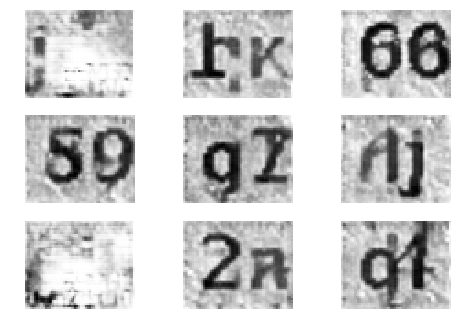

9951 [D loss: 0.463719] [G loss: 2.636905]
9952 [D loss: 0.131278] [G loss: 2.841499]
9953 [D loss: 0.782171] [G loss: 2.962605]
9954 [D loss: 0.829845] [G loss: 2.813642]
9955 [D loss: 0.538560] [G loss: 1.867767]
9956 [D loss: 0.669353] [G loss: 2.055110]
9957 [D loss: 0.652745] [G loss: 3.051660]
9958 [D loss: 0.690460] [G loss: 2.922405]
9959 [D loss: 0.820918] [G loss: 2.085088]
9960 [D loss: 0.253769] [G loss: 1.350945]
9961 [D loss: 0.442454] [G loss: 2.334241]
9962 [D loss: 0.843401] [G loss: 2.385360]
9963 [D loss: 0.376731] [G loss: 2.476800]
9964 [D loss: 0.672583] [G loss: 2.554515]
9965 [D loss: 0.271322] [G loss: 3.160162]
9966 [D loss: 0.421431] [G loss: 2.008990]
9967 [D loss: 0.500795] [G loss: 2.059671]
9968 [D loss: 0.588296] [G loss: 2.366760]
9969 [D loss: 0.460869] [G loss: 3.748605]
9970 [D loss: 0.597313] [G loss: 2.825905]
9971 [D loss: 0.432031] [G loss: 2.226110]
9972 [D loss: 0.595491] [G loss: 2.996762]
9973 [D loss: 0.492383] [G loss: 3.008864]
9974 [D los

In [26]:
if __name__ == '__main__':
    dcgan = DCGAN()
    dcgan.train(epochs=10000, batch_size=32, save_interval=50, data_set = data_set)